In [2]:
# Initialization of packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import openpyxl
import sklearn
import seaborn as sns
import statsmodels.api as sm
import glob
import os
import re


from xgboost import XGBClassifier

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, mean_squared_error

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import RandomForestClassifier

from ModelingFunctions.GEMpythonlib.GEMpythonfunctions import *
from statsmodels.tsa.stattools import acf

from hmmlearn.hmm import GaussianHMM

In [3]:
# Define the columns and the prefixes you want to use
freq_a = 'Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)'
freq_b = 'Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)'
volt_a = 'Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)'
volt_b = 'Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)'


# Define the columns and the prefixes you want to use
columns_to_compare = [
    (freq_a, 'freq_lab'),
    (freq_b, 'freq_clinique'),
    (volt_a, 'volt_lab'),
    (volt_b, 'volt_clinique')
]


# Array or dataframe initialization
data = []

# Constant initialization
minutes_interval = 2

# Constants
NOx_lb_hp_hr = 0.024
CO_lb_hp_hr = 0.0055
SOx_lb_hp_hr = 0.00809
CO2_lb_hp_hr = 1.16
PM_lb_hp_hr = 0.0007

# unit changes
kwh_to_hp_hr = 1.341
lb_to_gr = 453.592


# List of emissions
emissions = ['NOx', 'CO', 'SOx', 'CO2', 'PM']

# 1. Loading the Data

In [4]:
# Opening files
file_list = ['Voltage Time Series-data-2024-09-15 15_04_52.csv',  
             'Voltage Time Series-data-2024-09-15 15_05_24.csv', 
             'Voltage Time Series-data-2024-09-15 15_06_06.csv',
             'Voltage Time Series-data-2024-09-15 15_06_22.csv',
             'Voltage Time Series-data-2024-09-15 15_05_49.csv',
             'Voltage Time Series-data-2024-10-28 21_01_48.csv',
             'Voltage Time Series-data-2024-10-28 21_02_00.csv',
             'Voltage Time Series-data-2024-10-28 21_02_17.csv',
             'Voltage Time Series-data-2024-10-28 21_02_43.csv']

file_path = '../../data/0. ChCbNdosho/training/'

# Initialize an empty list to collect DataFrames
data_frames = []

for file in file_list:
    # Read each file into a DataFrame and append to the list
    monthly_data = pd.read_csv(file_path + file)
    data_frames.append(monthly_data)

# Concatenate all DataFrames in the list at once
data = pd.concat(data_frames, ignore_index=True)

# Display the final concatenated DataFrame
display(data)

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON
0,9/9/24 0:00,51.7,51.6,226.0,242.0,True
1,9/9/24 0:02,51.9,52.0,227.0,243.0,True
2,9/9/24 0:04,51.8,52.1,226.0,241.0,True
3,9/9/24 0:06,52.0,52.0,225.0,241.0,True
4,9/9/24 0:08,52.1,52.0,225.0,241.0,True
...,...,...,...,...,...,...
45361,2/28/23 23:50,50.2,50.2,216.0,219.0,False
45362,2/28/23 23:52,50.4,50.3,220.0,222.0,False
45363,2/28/23 23:54,50.4,50.3,220.0,221.0,False
45364,2/28/23 23:56,50.4,50.4,219.0,221.0,False


In [5]:
# Sort values by 'Time' in ascending order
data.sort_values('Time', ascending=True, inplace=True)

# Now you can proceed to drop the duplicates as before
data.drop_duplicates(subset='Time', inplace=True)

# Reset the index after dropping duplicates
data.reset_index(drop=True, inplace=True)

# Display the cleaned data
display(data)

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON
0,2/1/23 0:00,50.5,50.4,223.0,223.0,False
1,2/1/23 0:02,50.6,50.5,223.0,224.0,False
2,2/1/23 0:04,50.6,50.6,223.0,224.0,False
3,2/1/23 0:06,50.6,50.5,224.0,225.0,False
4,2/1/23 0:08,50.5,50.6,222.0,224.0,False
...,...,...,...,...,...,...
45355,9/9/24 9:50,49.6,49.5,194.0,196.0,False
45356,9/9/24 9:52,49.5,49.5,197.0,197.0,False
45357,9/9/24 9:54,49.7,49.6,196.0,195.0,False
45358,9/9/24 9:56,49.3,49.3,196.0,193.0,False


In [6]:
# Checking if all rows have the same date time format:

data['Time'] = pd.to_datetime(data['Time'], format="%m/%d/%y %H:%M")
data['Time'].dtype

dtype('<M8[ns]')

In [7]:
# Check interval of data:

is_valid, invalid_data = check_time_intervals(data)

# If there are invalid rows, display them
if not is_valid:
    print("Invalid rows:")
    display(invalid_data)
    
#display(data.iloc[10078:10082])

Some rows are not separated by exactly 2 minutes.
Invalid rows:


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON,time_diff
0,2023-02-01,50.5,50.4,223.0,223.0,False,NaT
20160,2024-08-12,50.2,50.2,208.0,224.0,False,530 days 00:02:00


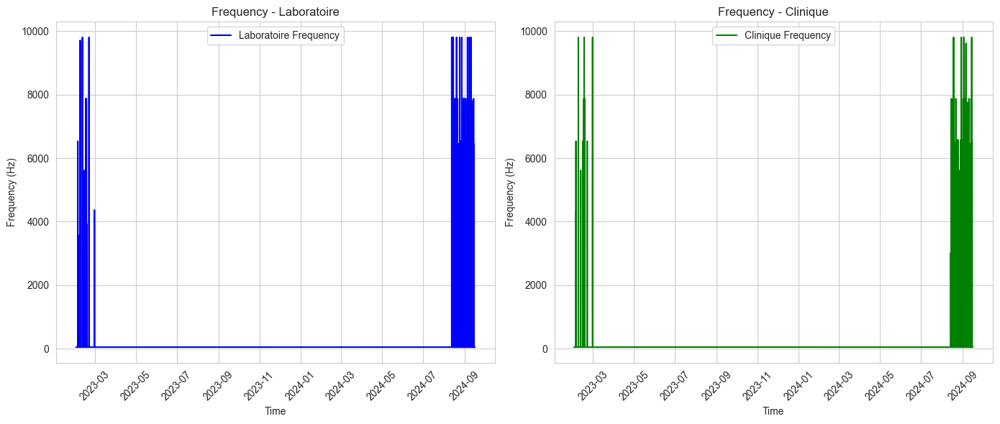

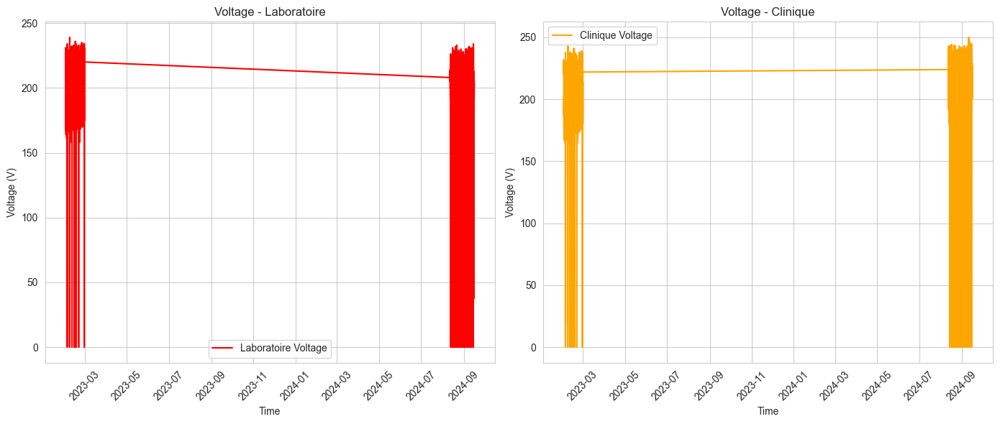

In [8]:
# Convert 'Time' column to datetime format
data['Time'] = pd.to_datetime(data['Time'])
data.sort_values('Time', ascending=True, inplace=True)

# Plot Frequency for both facilities
plt.figure(figsize=(14, 6))

# Plot Frequency for Laboratoire
plt.subplot(1, 2, 1)
plt.plot(data['Time'], data[freq_a], label='Laboratoire Frequency', color='blue')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.title('Frequency - Laboratoire')
plt.xticks(rotation=45)
plt.legend()

# Plot Frequency for Clinique
plt.subplot(1, 2, 2)
plt.plot(data['Time'], data[freq_b], label='Clinique Frequency', color='green')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.title('Frequency - Clinique')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

# Plot Voltage for both facilities
plt.figure(figsize=(14, 6))

# Plot Voltage for Laboratoire
plt.subplot(1, 2, 1)
plt.plot(data['Time'], data[volt_a], label='Laboratoire Voltage', color='red')
plt.xlabel('Time')
plt.ylabel('Voltage (V)')
plt.title('Voltage - Laboratoire')
plt.xticks(rotation=45)
plt.legend()

# Plot Voltage for Clinique
plt.subplot(1, 2, 2)
plt.plot(data['Time'], data[volt_b], label='Clinique Voltage', color='orange')
plt.xlabel('Time')
plt.ylabel('Voltage (V)')
plt.title('Voltage - Clinique')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

In [9]:
# List of columns to calculate statistics
columns_of_interest = [
    freq_a,
    freq_b,
    volt_a,
    volt_b
]

# Calculate the statistics for each column, including mean, median, percentiles, and null counts
stats = data[columns_of_interest].agg([
    'mean',
    'median',
    lambda x: x.quantile(0.01),  # 1st percentile
    lambda x: x.quantile(0.99),  # 99th percentile
    lambda x: x.isnull().sum()/x.sum()*100  # Null counts
])

# Renaming the lambda output columns
stats.columns = columns_of_interest
stats.index = ['Mean', 'Median', '1st Percentile', '99th Percentile', 'Null Count (%)']

# Display the statistics
print(stats)

                 Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)  \
Mean                                                     72.947477            
Median                                                   50.100000            
1st Percentile                                           49.000000            
99th Percentile                                          52.100000            
Null Count (%)                                            0.000091            

                 Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)  \
Mean                                                     80.850821         
Median                                                   50.100000         
1st Percentile                                           49.000000         
99th Percentile                                          52.400000         
Null Count (%)                                            0.000027         

                 Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laborat

# 2. Training and Test Data Separation

In [10]:
# Determine the split index (60% for training)
split_index = int(len(data) * 0.6)

# Split the data into training and testing sets
train_data = data.iloc[:split_index]
test_data = data.iloc[split_index:]

# Display the sizes of the train and test sets
print(f'Training data size: {len(train_data)}')
print(f'Test data size: {len(test_data)}')

# Optionally, display the first few rows of each
print("Training Data Sample:")
display(train_data)

print("Test Data Sample:")
display(test_data)

Training data size: 27216
Test data size: 18144
Training Data Sample:


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON
0,2023-02-01 00:00:00,50.5,50.4,223.0,223.0,False
1,2023-02-01 00:02:00,50.6,50.5,223.0,224.0,False
2,2023-02-01 00:04:00,50.6,50.6,223.0,224.0,False
3,2023-02-01 00:06:00,50.6,50.5,224.0,225.0,False
4,2023-02-01 00:08:00,50.5,50.6,222.0,224.0,False
...,...,...,...,...,...,...
26941,2024-08-21 19:02:00,50.5,50.5,222.0,238.0,True
26942,2024-08-21 19:04:00,50.6,50.6,223.0,239.0,True
26943,2024-08-21 19:06:00,50.7,50.6,222.0,238.0,True
26944,2024-08-21 19:08:00,50.5,50.4,222.0,236.0,True


Test Data Sample:


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON
26946,2024-08-21 19:12:00,50.4,50.5,220.0,236.0,True
26947,2024-08-21 19:14:00,50.7,50.7,224.0,238.0,True
26948,2024-08-21 19:16:00,50.5,50.5,221.0,237.0,True
26949,2024-08-21 19:18:00,50.7,50.6,222.0,238.0,True
26950,2024-08-21 19:20:00,50.7,50.7,224.0,238.0,True
...,...,...,...,...,...,...
39355,2024-09-15 23:50:00,50.1,50.1,202.0,229.0,False
39356,2024-09-15 23:52:00,50.1,50.1,202.0,228.0,False
39357,2024-09-15 23:54:00,50.0,50.0,203.0,229.0,False
39358,2024-09-15 23:56:00,50.1,50.1,202.0,229.0,False


# 3. Voltage and Frequency Only 

#### *3.1. Baseline Model on the Voltage and Frequency only*

-> Choosing only the most from the train set

In [11]:
train_data_base = train_data.copy()
test_data_base = test_data.copy()

In [12]:
train_data_base['prediction'] = (train_data_base['Generator_ON'].mean()) > 0.5
test_data_base['prediction'] = (train_data_base['Generator_ON'].mean()) > 0.5

display('Train data for baseline:')
display(train_data_base['prediction'])

display('Test data for baseline:')
display(test_data_base['prediction'])

'Train data for baseline:'

0        False
1        False
2        False
3        False
4        False
         ...  
26941    False
26942    False
26943    False
26944    False
26945    False
Name: prediction, Length: 27216, dtype: bool

'Test data for baseline:'

26946    False
26947    False
26948    False
26949    False
26950    False
         ...  
39355    False
39356    False
39357    False
39358    False
39359    False
Name: prediction, Length: 18144, dtype: bool

Assessing the model:

In [13]:
# TRAIN DATA EVALUATION
metrics = evaluate_model_performance(train_data_base)

Accuracy of model: 0.8566651969429747
Confusion Matrix:
[[23315     0]
 [ 3901     0]]
Precision of model: 0.0
Recall of model: 0.0


In [14]:
# TEST DATA EVALUATION
metrics = evaluate_model_performance(test_data_base)

Accuracy of model: 0.8112874779541446
Confusion Matrix:
[[14720     0]
 [ 3424     0]]
Precision of model: 0.0
Recall of model: 0.0


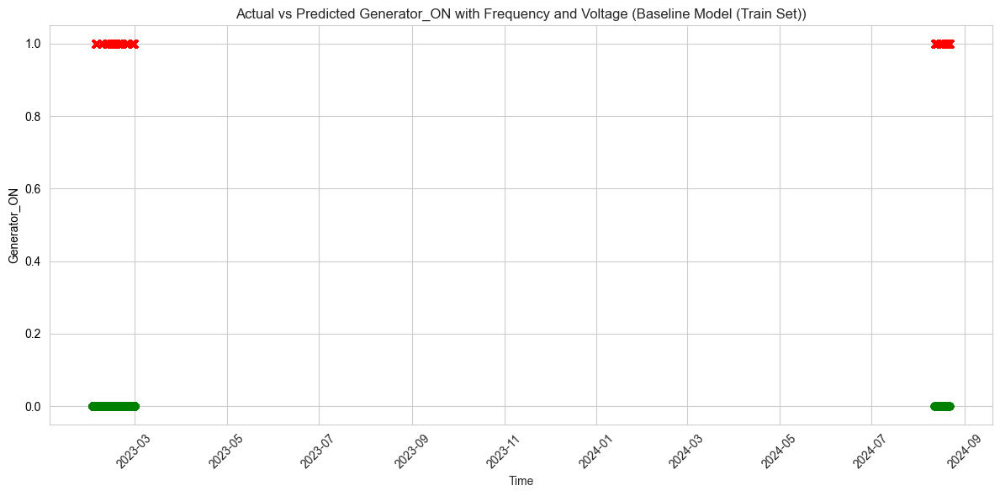

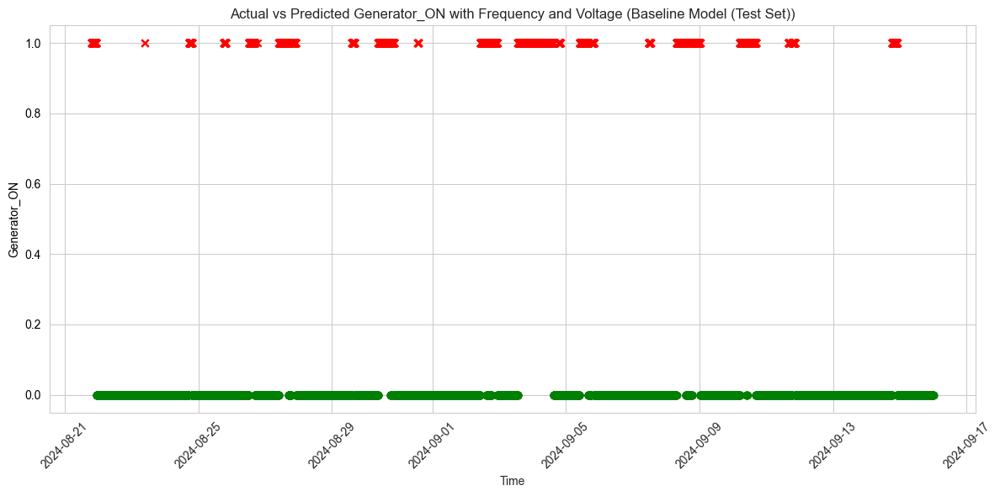

In [15]:
# For Baseline Model without voltage
plot_predictions_vs_actuals(train_data_base, model_name="Baseline Model (Train Set)", 
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)
plot_predictions_vs_actuals(test_data_base, model_name="Baseline Model (Test Set)",  
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)

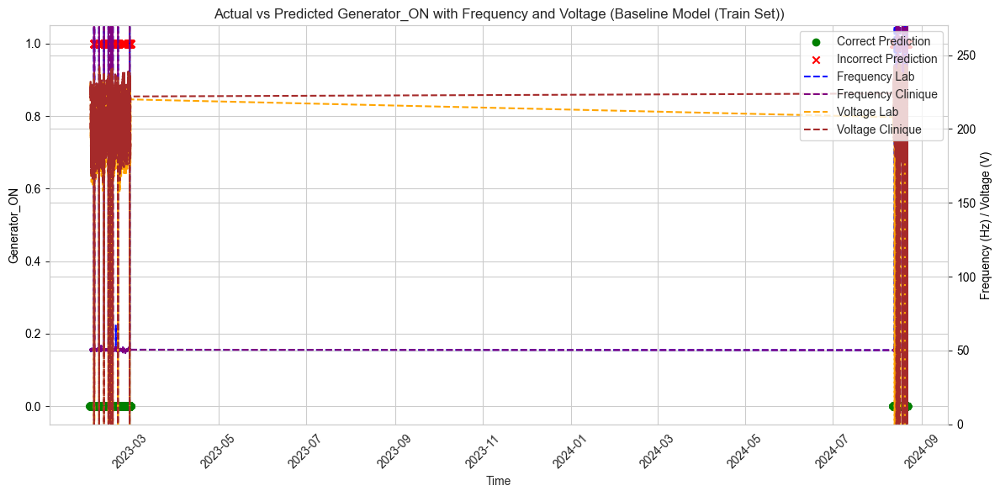

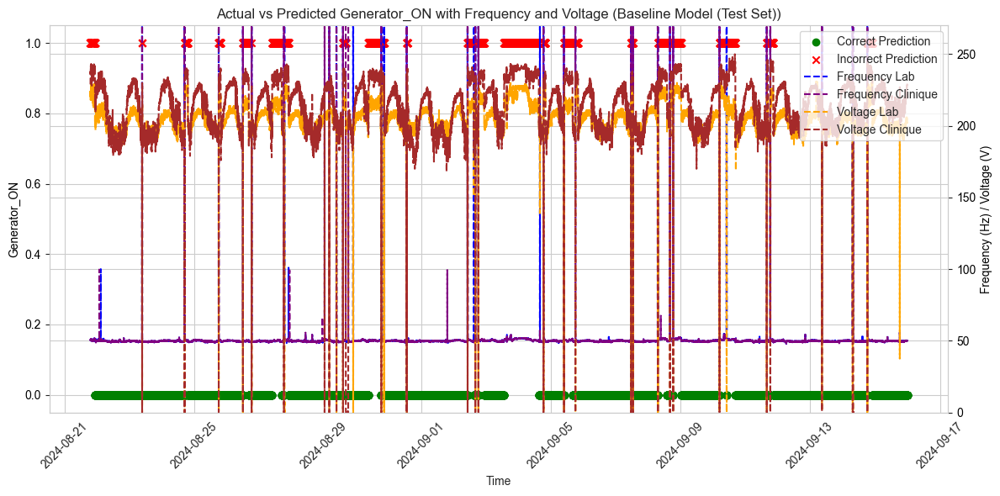

In [16]:
# For Baseline Model without voltage
plot_predictions_vs_actuals(train_data_base, model_name="Baseline Model (Train Set)",  
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
plot_predictions_vs_actuals(test_data_base, model_name="Baseline Model (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)

#### *3.2. Logistic Regression on the Voltage and Frequency only*

In [17]:
# Step 1: Create copies of the original data
train_data_mean_lg = train_data.copy()
test_data_mean_lg = test_data.copy()

# Calculate the mean flags (assuming the function 'calculate_mean_flags' is defined)
train_data_mean_lg, test_data_mean_lg = calculate_mean_flags(train_data_mean_lg, test_data_mean_lg, train_data_base, columns_to_compare)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b
]

# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_mean_lg[feature_columns]
y_train = train_data_mean_lg['Generator_ON']

X_test = test_data_mean_lg[feature_columns]
y_test = test_data_mean_lg['Generator_ON']

# Fill NaN values in training and testing data with the mean of each column
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())  # Use training mean to avoid data leakage

# Step 2: Train a Logistic Regression model
reg = LogisticRegression()
reg.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_mean_lg['prediction_value'] = reg.predict(X_train)
test_data_mean_lg['prediction_value'] = reg.predict(X_test)

# Optional: Convert predictions to binary form for classification (e.g., threshold at 0.5)
train_data_mean_lg['prediction'] = (train_data_mean_lg['prediction_value'] >= 0.5).astype(int)
test_data_mean_lg['prediction'] = (test_data_mean_lg['prediction_value'] >= 0.5).astype(int)

# Print accuracy for classification interpretation
train_accuracy = accuracy_score(y_train, train_data_mean_lg['prediction'])
test_accuracy = accuracy_score(y_test, test_data_mean_lg['prediction'])

print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")

Train Accuracy: 0.96
Test Accuracy: 0.97


/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/.venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Evaluating the train set - Baseline Logistic Regression:

In [18]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_mean_lg['prediction'])

print("Train data prediction distribution:")
print(train_data_mean_lg['prediction'].value_counts())

Train Set Evaluation:
Accuracy: 0.9617871840094062
Confusion Matrix:
[[22795   520]
 [  520  3381]]
Precision: 0.8667008459369393
Recall: 0.8667008459369393
Train data prediction distribution:
prediction
0    23315
1     3901
Name: count, dtype: int64


Evaluating the test set - Baseline Logistic Regression:

In [19]:
# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_mean_lg['prediction'])

print("Test data prediction distribution:")
print(test_data_mean_lg['prediction'].value_counts())

Test Set Evaluation:
Accuracy: 0.9685295414462081
Confusion Matrix:
[[14591   129]
 [  442  2982]]
Precision: 0.9585342333654774
Recall: 0.8709112149532711
Test data prediction distribution:
prediction
0    15033
1     3111
Name: count, dtype: int64


#### *3.3. Random Forrest on the Voltage and Frequency only*

In [20]:
# Step 1: Create copies of the original data
train_data_rf = train_data.copy()
test_data_rf = test_data.copy()

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b
]

# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_rf[feature_columns]
y_train = train_data_rf['Generator_ON']

X_test = test_data_rf[feature_columns]
y_test = test_data_rf['Generator_ON']

# Step 2: Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_rf['prediction'] = clf.predict(X_train)
test_data_rf['prediction'] = clf.predict(X_test)

Evaluating the train set (Random Forrest): 

In [21]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_rf['prediction'])

print("Train data prediction distribution:")
print(train_data_rf['prediction'].value_counts())

Train Set Evaluation:
Accuracy: 0.9971340388007055
Confusion Matrix:
[[23286    29]
 [   49  3852]]
Precision: 0.9925276990466375
Recall: 0.987439118174827
Train data prediction distribution:
prediction
False    23335
True      3881
Name: count, dtype: int64


Evaluating the test set (Random Forrest): 

In [22]:
# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_rf['prediction'])

print("Test data prediction distribution:")
print(test_data_rf['prediction'].value_counts())

Test Set Evaluation:
Accuracy: 0.9635692239858906
Confusion Matrix:
[[14563   157]
 [  504  2920]]
Precision: 0.9489762755931102
Recall: 0.852803738317757
Test data prediction distribution:
prediction
False    15067
True      3077
Name: count, dtype: int64


#### *3.4. XG-Boost on the Voltage and Frequency only*

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/.venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [22:53:06] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Top 20 features sorted by importance (XGBoost):


,Feature,Importance
3,Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - cl...,0.797339
0,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - ...,0.111026
2,Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - la...,0.051043
1,Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - ...,0.040592


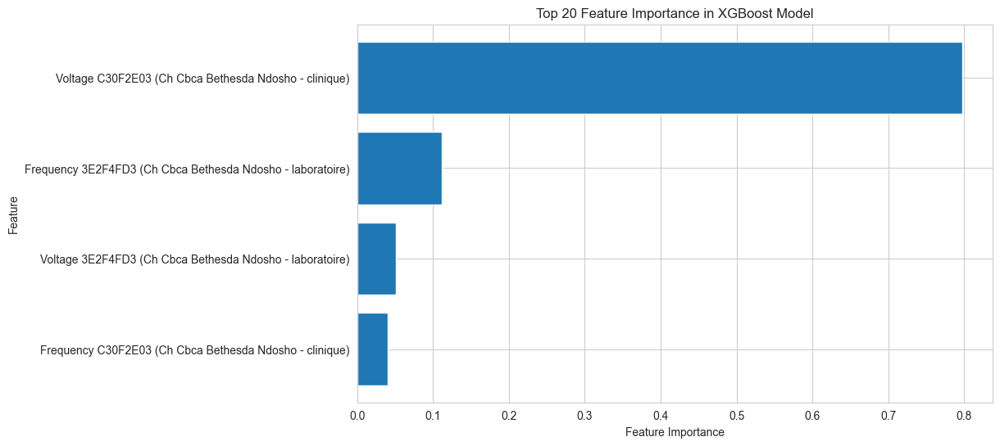

In [23]:
# Step 0: Copy rf data
train_data_boost = train_data.copy()
test_data_boost = test_data.copy()

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b
]


# Step 1: Use the same data and feature columns
X_train = train_data_boost[feature_columns]
y_train = train_data_boost['Generator_ON']

X_test = test_data_boost[feature_columns]
y_test = test_data_boost['Generator_ON']


# Step 2: Train an XGBoost Classifier
xgb_clf = XGBClassifier(
    random_state=42,
    eval_metric='logloss',  # Evaluation metric for binary classification
    use_label_encoder=False  # Avoid unnecessary warnings
)

# Fit the model
xgb_clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_boost['prediction'] = xgb_clf.predict(X_train)
test_data_boost['prediction'] = xgb_clf.predict(X_test)

# Step 4: Evaluate Feature Importances
importances = xgb_clf.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': importances
})

# Sort the features by importance and keep only the top 20
top_20_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(20)

# Display the top 20 most important features
print("Top 20 features sorted by importance (XGBoost):")
display(top_20_features)

# Visualize the top 20 feature importances
plt.figure(figsize=(10, 6))
plt.barh(top_20_features['Feature'], top_20_features['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance in XGBoost Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important on top
plt.show()

In [24]:
# Step 5: Evaluate Model Performance
# Evaluate on the train set
print("Train Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_train, train_data_boost['prediction'])

print("Train data prediction distribution (XGBoost):")
print(train_data_boost['prediction'].value_counts())

Train Set Evaluation (XGBoost):
Accuracy: 0.9932025279247502
Confusion Matrix:
[[23245    70]
 [  115  3786]]
Precision: 0.9818464730290456
Recall: 0.9705203793899
Train data prediction distribution (XGBoost):
prediction
0    23360
1     3856
Name: count, dtype: int64


In [25]:
# Step 5: Evaluate Model Performance
# Evaluate on the train set
print("Test Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_test, test_data_boost['prediction'])

print("Test data prediction distribution (XGBoost):")
print(train_data_boost['prediction'].value_counts())

Test Set Evaluation (XGBoost):
Accuracy: 0.9643959435626103
Confusion Matrix:
[[14559   161]
 [  485  2939]]
Precision: 0.9480645161290323
Recall: 0.8583528037383178
Test data prediction distribution (XGBoost):
prediction
0    23360
1     3856
Name: count, dtype: int64


# 4. Feature Generation

### 4.1. Using Mean as a Threshold

In [26]:
train_data_mean = train_data.copy()
test_data_mean = test_data.copy()

In [27]:
# Taking the mean of the dataframe
train_data_mean, test_data_mean = calculate_mean_flags(train_data_mean, test_data_mean, train_data_base, columns_to_compare)

# Display the updated data
display(train_data_mean)
display(test_data_mean)

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique
0,2023-02-01 00:00:00,50.5,50.4,223.0,223.0,False,False,False,True,True
1,2023-02-01 00:02:00,50.6,50.5,223.0,224.0,False,False,False,True,True
2,2023-02-01 00:04:00,50.6,50.6,223.0,224.0,False,False,False,True,True
3,2023-02-01 00:06:00,50.6,50.5,224.0,225.0,False,False,False,True,True
4,2023-02-01 00:08:00,50.5,50.6,222.0,224.0,False,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...
26941,2024-08-21 19:02:00,50.5,50.5,222.0,238.0,True,False,False,True,True
26942,2024-08-21 19:04:00,50.6,50.6,223.0,239.0,True,False,False,True,True
26943,2024-08-21 19:06:00,50.7,50.6,222.0,238.0,True,False,False,True,True
26944,2024-08-21 19:08:00,50.5,50.4,222.0,236.0,True,False,False,True,True


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique
26946,2024-08-21 19:12:00,50.4,50.5,220.0,236.0,True,False,False,True,True
26947,2024-08-21 19:14:00,50.7,50.7,224.0,238.0,True,False,False,True,True
26948,2024-08-21 19:16:00,50.5,50.5,221.0,237.0,True,False,False,True,True
26949,2024-08-21 19:18:00,50.7,50.6,222.0,238.0,True,False,False,True,True
26950,2024-08-21 19:20:00,50.7,50.7,224.0,238.0,True,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...
39355,2024-09-15 23:50:00,50.1,50.1,202.0,229.0,False,False,False,False,True
39356,2024-09-15 23:52:00,50.1,50.1,202.0,228.0,False,False,False,False,True
39357,2024-09-15 23:54:00,50.0,50.0,203.0,229.0,False,False,False,False,True
39358,2024-09-15 23:56:00,50.1,50.1,202.0,229.0,False,False,False,False,True


#### 4.1.1. Using Mean as a Threshold - Custom Prediction

In [28]:
# Define custom prediction logic
def custom_prediction(row):
    # Example: Set prediction to True if either clinic or lab has higher frequency and voltage
    if (row['higher_freq_lab'] or row['higher_volt_lab']) and (row['higher_freq_clinique'] or row['higher_volt_clinique']):
        return True
    else:
        return False

# Apply custom prediction logic
train_data_mean['prediction'] = train_data_mean.apply(custom_prediction, axis=1)
test_data_mean['prediction'] = test_data_mean.apply(custom_prediction, axis=1)

# Show prediction:
display('Train data for baseline:')
display(train_data_mean['prediction'].value_counts())

display('Test data for baseline:')
display(test_data_mean['prediction'].value_counts())

'Train data for baseline:'

prediction
False    13795
True     13421
Name: count, dtype: int64

'Test data for baseline:'

prediction
False    9464
True     8680
Name: count, dtype: int64

Assessing the mean model: 

In [29]:
metrics = evaluate_model_performance(train_data_mean)

Accuracy of model: 0.6499853027630805
Confusion Matrix:
[[13792  9523]
 [    3  3898]]
Precision of model: 0.2904403546680575
Recall of model: 0.999230966418867


In [30]:
metrics = evaluate_model_performance(test_data_mean)

Accuracy of model: 0.7098765432098766
Confusion Matrix:
[[9460 5260]
 [   4 3420]]
Precision of model: 0.39400921658986177
Recall of model: 0.9988317757009346


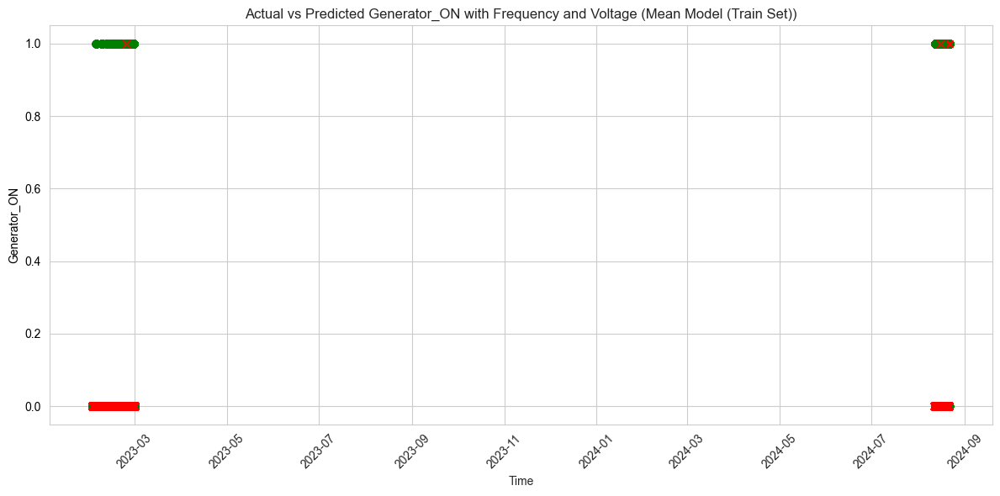

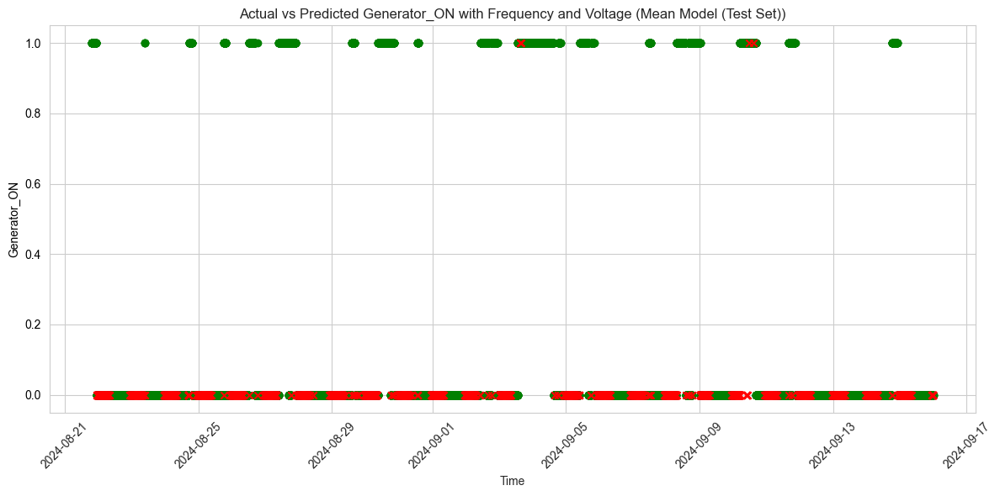

In [31]:
# For Mean Model without frequency
plot_predictions_vs_actuals(train_data_mean, model_name="Mean Model (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)
plot_predictions_vs_actuals(test_data_mean, model_name="Mean Model (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)

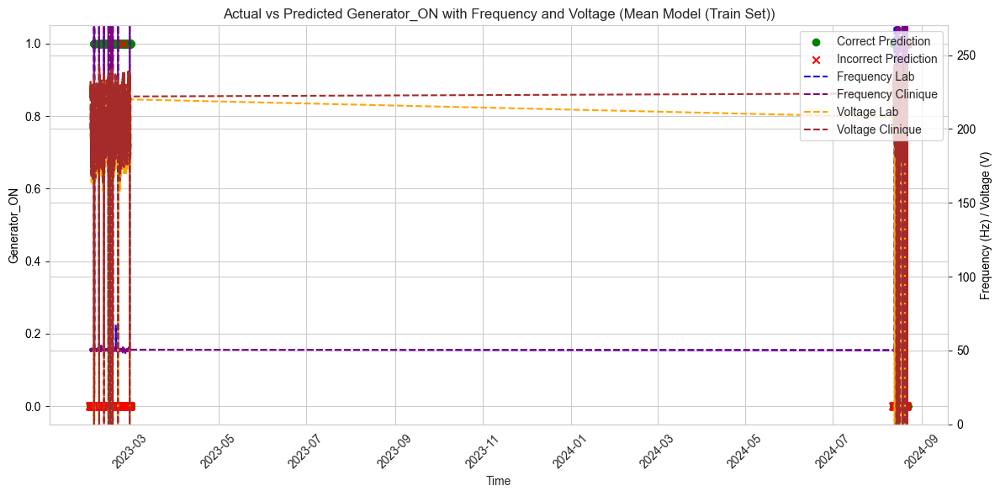

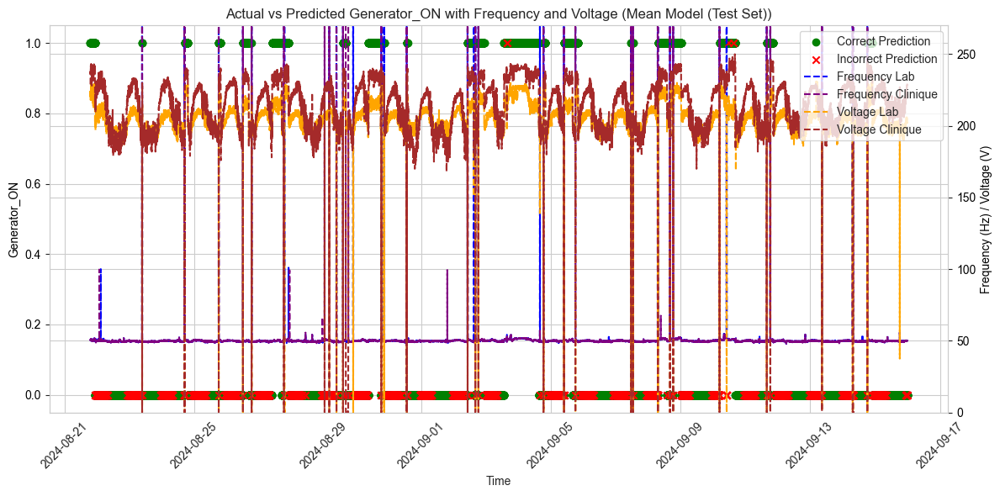

In [32]:
# For Mean Model without frequency
plot_predictions_vs_actuals(train_data_mean, model_name="Mean Model (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
plot_predictions_vs_actuals(test_data_mean, model_name="Mean Model (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)

#### 4.1.2. Using Mean as a Threshold - Logistic Regression

In [33]:
# Step 1: Create copies of the original data
train_data_mean_lg = train_data.copy()
test_data_mean_lg = test_data.copy()

# Calculate the mean flags (assuming the function 'calculate_mean_flags' is defined)
train_data_mean_lg, test_data_mean_lg = calculate_mean_flags(train_data_mean_lg, test_data_mean_lg, train_data_base, columns_to_compare)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique'
]

# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_mean_lg[feature_columns]
y_train = train_data_mean_lg['Generator_ON']

X_test = test_data_mean_lg[feature_columns]
y_test = test_data_mean_lg['Generator_ON']

# Fill NaN values in training and testing data with the mean of each column
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())  # Use training mean to avoid data leakage

# Step 2: Train a Logistic Regression model
reg = LogisticRegression()
reg.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_mean_lg['prediction_value'] = reg.predict(X_train)
test_data_mean_lg['prediction_value'] = reg.predict(X_test)

# Optional: Convert predictions to binary form for classification (e.g., threshold at 0.5)
train_data_mean_lg['prediction'] = (train_data_mean_lg['prediction_value'] >= 0.5).astype(int)
test_data_mean_lg['prediction'] = (test_data_mean_lg['prediction_value'] >= 0.5).astype(int)

# Print accuracy for classification interpretation
train_accuracy = accuracy_score(y_train, train_data_mean_lg['prediction'])
test_accuracy = accuracy_score(y_test, test_data_mean_lg['prediction'])

print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")

Train Accuracy: 0.90
Test Accuracy: 0.94


/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/.venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Evaluating the train set (Logistic Regression): 

In [34]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_mean_lg['prediction'])

print("Train data prediction distribution:")
print(train_data_mean_lg['prediction'].value_counts())

Train Set Evaluation:
Accuracy: 0.9023736037624926
Confusion Matrix:
[[22653   662]
 [ 1995  1906]]
Precision: 0.7422118380062306
Recall: 0.48859266854652655
Train data prediction distribution:
prediction
0    24648
1     2568
Name: count, dtype: int64


Evaluating the test set (Logistic Regression): 

In [35]:
# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_mean_lg['prediction'])

print("Test data prediction distribution:")
print(test_data_mean_lg['prediction'].value_counts())

Test Set Evaluation:
Accuracy: 0.9415784832451499
Confusion Matrix:
[[14423   297]
 [  763  2661]]
Precision: 0.8995943204868154
Recall: 0.7771612149532711
Test data prediction distribution:
prediction
0    15186
1     2958
Name: count, dtype: int64


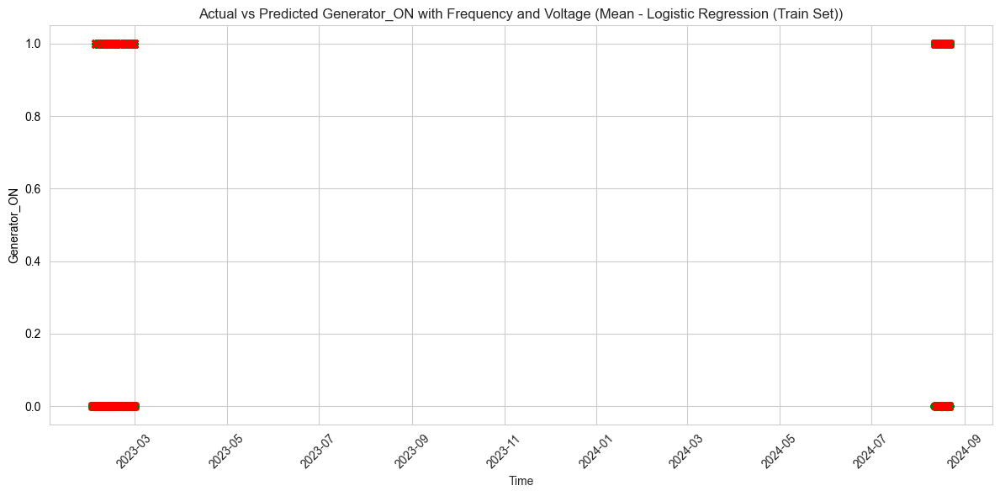

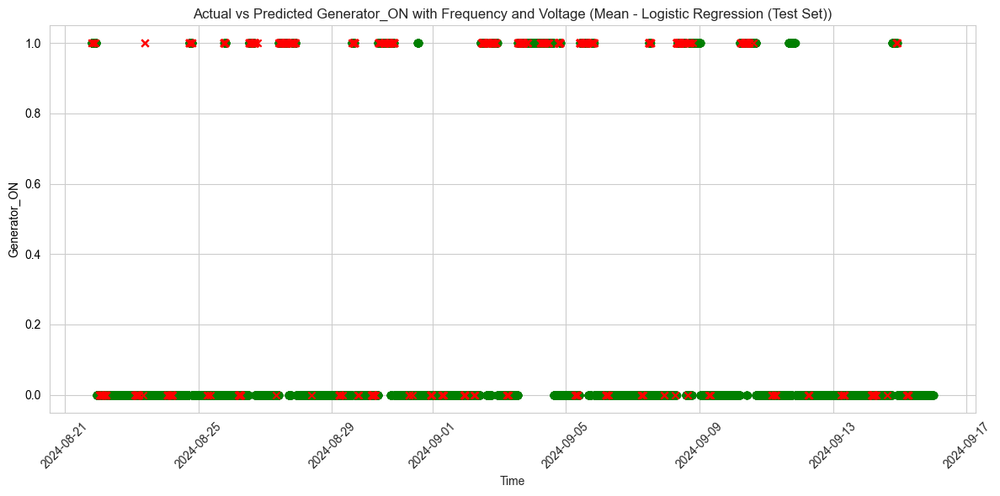

In [36]:
# For Logistic Regression Model with both voltage and frequency
plot_predictions_vs_actuals(train_data_mean_lg, model_name="Mean - Logistic Regression (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)
plot_predictions_vs_actuals(test_data_mean_lg, model_name="Mean - Logistic Regression (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)

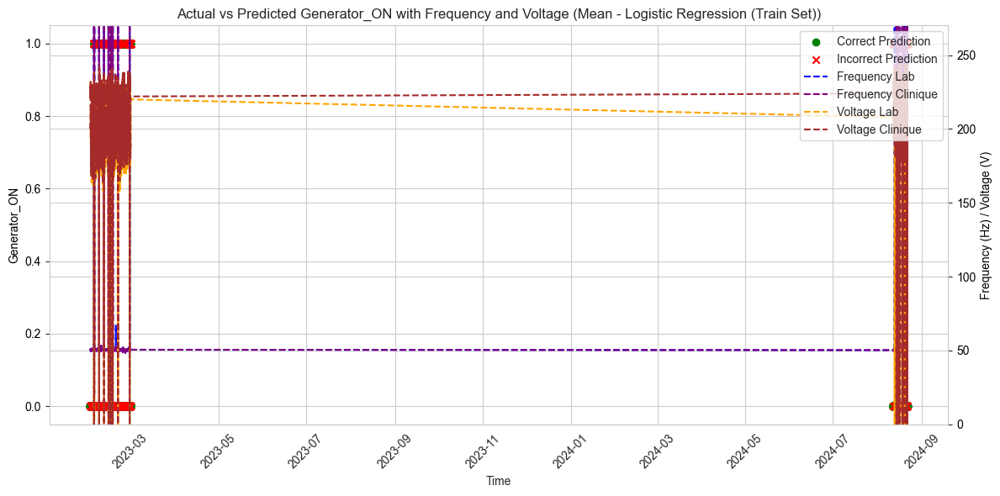

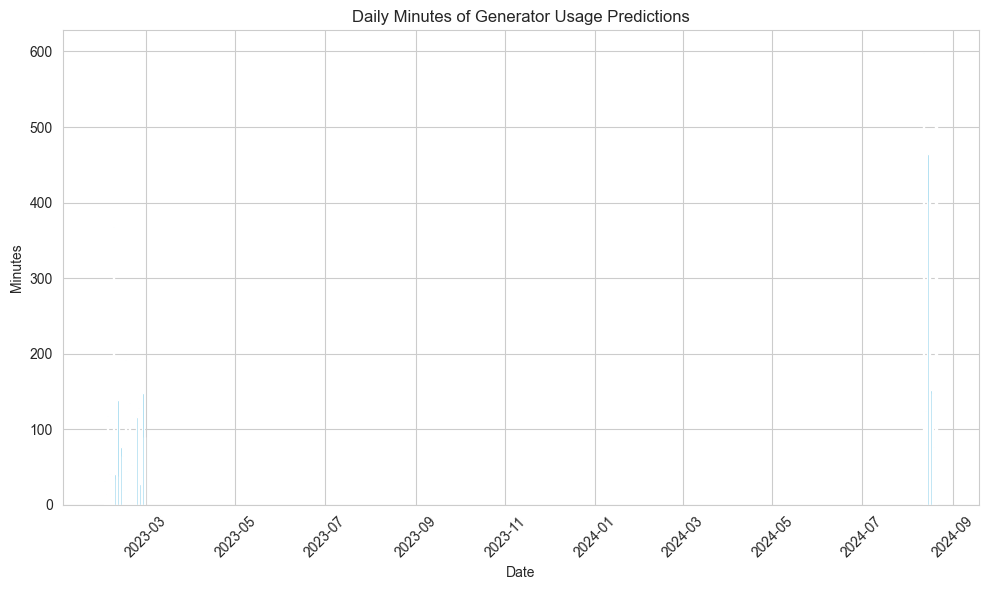

,Date,Count,Minutes,Hours
0,2023-02-01,16,32,0.533333
1,2023-02-02,7,14,0.233333
2,2023-02-03,59,118,1.966667
3,2023-02-04,20,40,0.666667
4,2023-02-05,20,40,0.666667
5,2023-02-06,19,38,0.633333
6,2023-02-07,184,368,6.133333
7,2023-02-08,20,40,0.666667
8,2023-02-09,17,34,0.566667
9,2023-02-10,69,138,2.300000


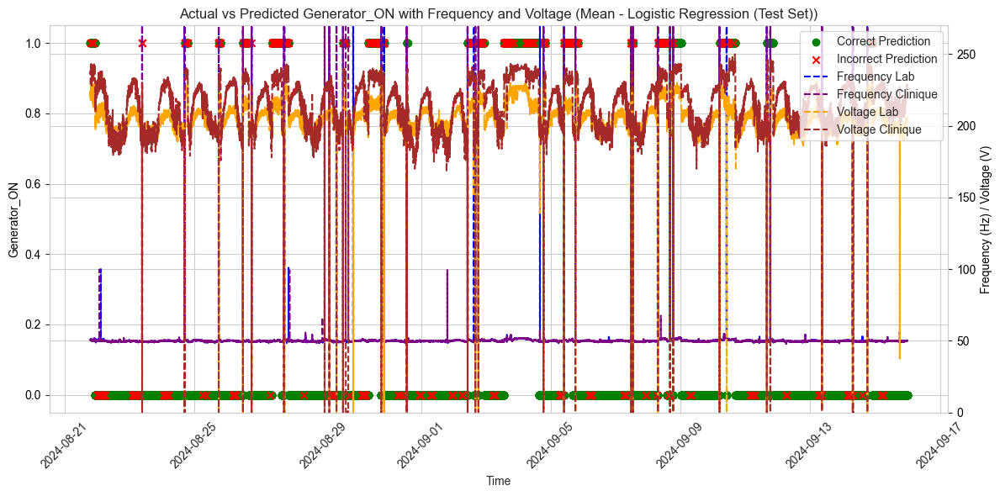

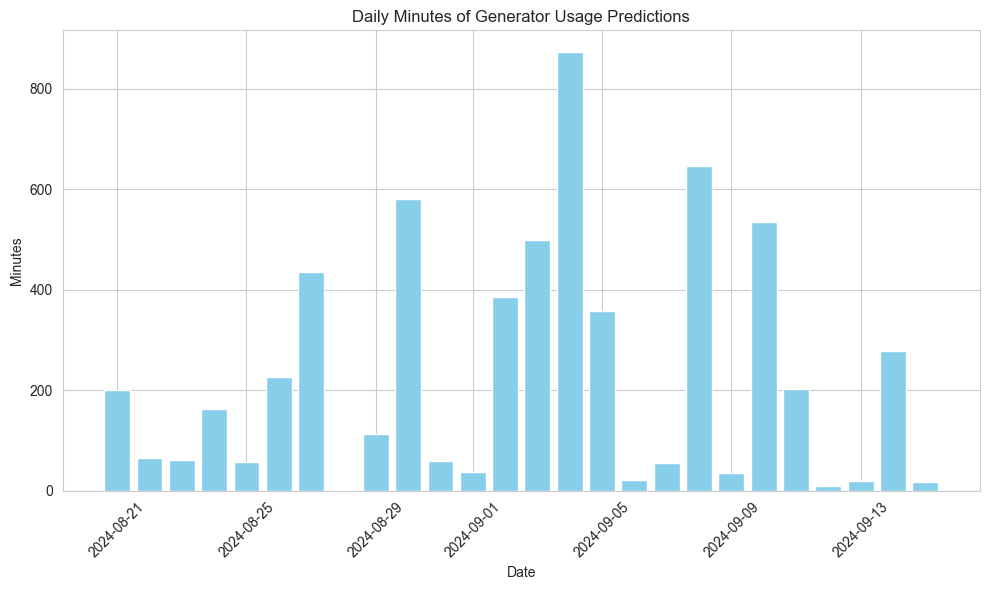

,Date,Count,Minutes,Hours
0,2024-08-21,100,200,3.333333
1,2024-08-22,32,64,1.066667
2,2024-08-23,30,60,1.000000
3,2024-08-24,81,162,2.700000
4,2024-08-25,28,56,0.933333
5,2024-08-26,113,226,3.766667
6,2024-08-27,217,434,7.233333
7,2024-08-28,1,2,0.033333
8,2024-08-29,56,112,1.866667
9,2024-08-30,290,580,9.666667


In [37]:
# For Logistic Regression Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_mean_lg, model_name="Mean - Logistic Regression (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
train_data_lg_daily_count = plot_true_predictions_histogram(train_data_mean_lg)
display(train_data_lg_daily_count)
# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_mean_lg, model_name="Mean - Logistic Regression (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
test_data_lg_daily_count = plot_true_predictions_histogram(test_data_mean_lg)
display(test_data_lg_daily_count)

#### 4.1.3. Using Mean as a Threshold - Random Forrest

In [38]:
# Step 1: Create copies of the original data
train_data_mean_rf = train_data.copy()
test_data_mean_rf = test_data.copy()

# Taking the mean of the dataframe
train_data_mean_rf, test_data_mean_rf = calculate_mean_flags(train_data_mean_rf, test_data_mean_rf, train_data_base, columns_to_compare)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
       'higher_volt_clinique'
]

# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_mean_rf[feature_columns]
y_train = train_data_mean_rf['Generator_ON']

X_test = test_data_mean_rf[feature_columns]
y_test = test_data_mean_rf['Generator_ON']

# Step 2: Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_mean_rf['prediction'] = clf.predict(X_train)
test_data_mean_rf['prediction'] = clf.predict(X_test)

Evaluating the train set (Random Forrest): 

In [39]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_mean_rf['prediction'])

print("Train data prediction distribution:")
print(train_data_mean_rf['prediction'].value_counts())

Train Set Evaluation:
Accuracy: 0.9971340388007055
Confusion Matrix:
[[23286    29]
 [   49  3852]]
Precision: 0.9925276990466375
Recall: 0.987439118174827
Train data prediction distribution:
prediction
False    23335
True      3881
Name: count, dtype: int64


Evaluating the test set (Random Forrest): 

In [40]:
# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_mean_rf['prediction'])

print("Test data prediction distribution:")
print(test_data_mean_rf['prediction'].value_counts())

Test Set Evaluation:
Accuracy: 0.9654431216931217
Confusion Matrix:
[[14579   141]
 [  486  2938]]
Precision: 0.9542059110100682
Recall: 0.8580607476635514
Test data prediction distribution:
prediction
False    15065
True      3079
Name: count, dtype: int64


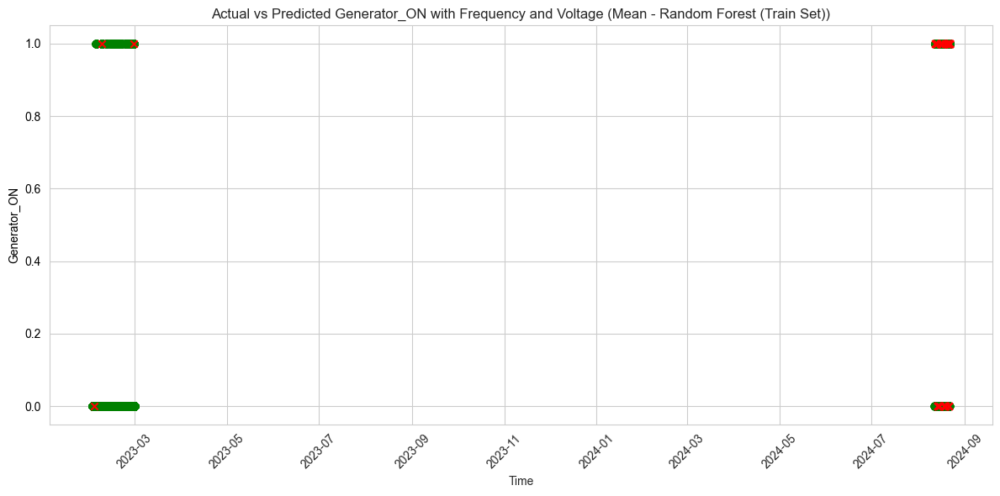

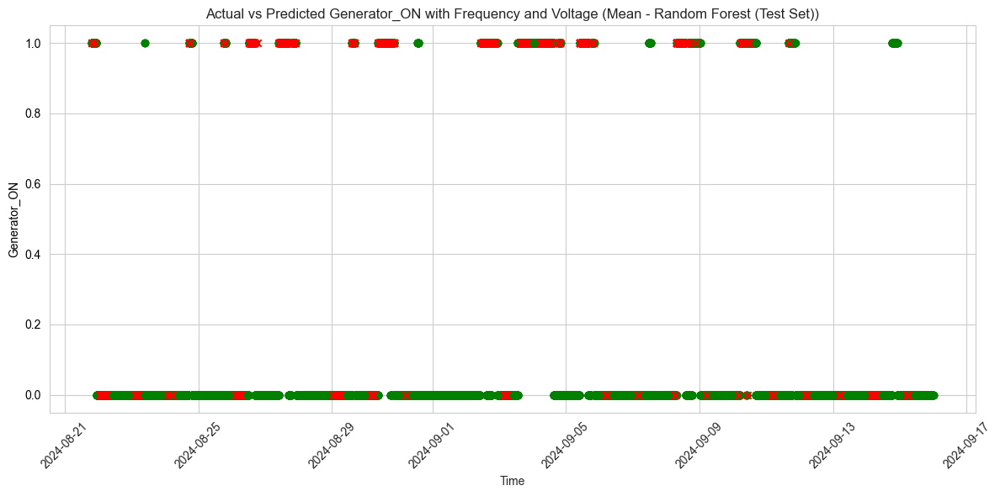

In [41]:
# For Random Forest Model with both voltage and frequency
plot_predictions_vs_actuals(train_data_mean_rf, model_name="Mean - Random Forest (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)
plot_predictions_vs_actuals(test_data_mean_rf, model_name="Mean - Random Forest (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)

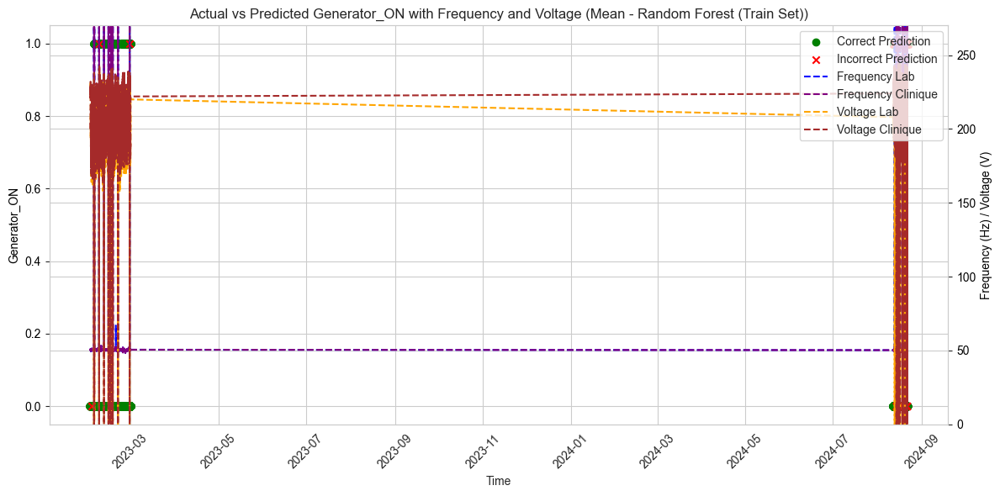

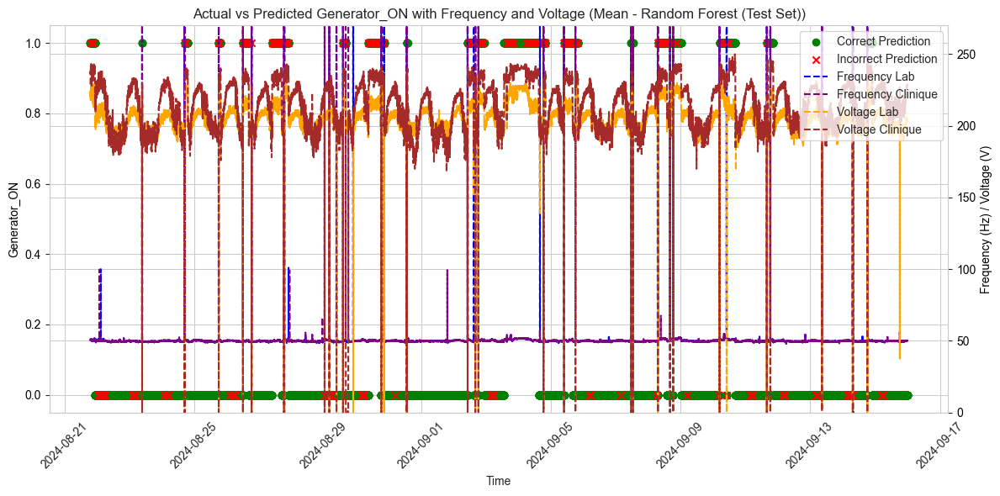

In [42]:
# For Random Forest Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_mean_rf, model_name="Mean - Random Forest (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_mean_rf, model_name="Mean - Random Forest (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)

In [43]:
print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_mean_rf)
display_generator_statistics(test_data_mean_rf)

##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3881 minutes, or 64.68 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 3079 minutes, or 51.32 hours within 302.40 hours


#### 4.1.4. Using Mean as a Threshold - XGBoost

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/.venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [22:53:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Top 20 features sorted by importance (XGBoost):


,Feature,Importance
3,Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - cl...,0.797339
0,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - ...,0.111026
2,Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - la...,0.051043
1,Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - ...,0.040592
4,higher_freq_lab,0.000000
5,higher_freq_clinique,0.000000
6,higher_volt_lab,0.000000
7,higher_volt_clinique,0.000000


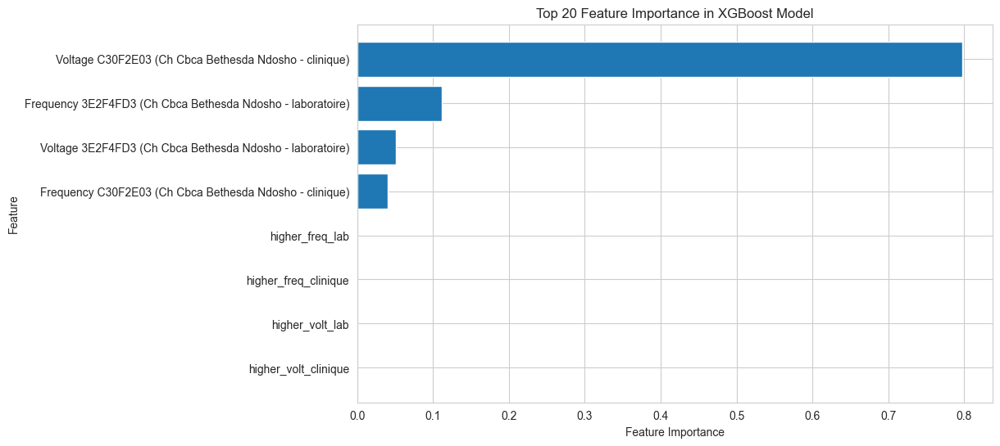

In [44]:
# Step 0: Copy rf data
train_data_mean_boost = train_data.copy()
test_data_mean_boost = test_data.copy()

# Taking the mean of the dataframe (using the previous function)
train_data_mean_boost, test_data_mean_boost = calculate_mean_flags(train_data_mean_boost, test_data_mean_boost, train_data_base, columns_to_compare)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique'
]


# Step 1: Use the same data and feature columns
X_train = train_data_mean_boost[feature_columns]
y_train = train_data_mean_boost['Generator_ON']

X_test = test_data_mean_boost[feature_columns]
y_test = test_data_mean_boost['Generator_ON']


# Step 2: Train an XGBoost Classifier
xgb_clf = XGBClassifier(
    random_state=42,
    eval_metric='logloss',  # Evaluation metric for binary classification
    use_label_encoder=False  # Avoid unnecessary warnings
)

# Fit the model
xgb_clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_mean_boost['prediction'] = xgb_clf.predict(X_train)
test_data_mean_boost['prediction'] = xgb_clf.predict(X_test)

# Step 4: Evaluate Feature Importances
importances = xgb_clf.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': importances
})

# Sort the features by importance and keep only the top 20
top_20_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(20)

# Display the top 20 most important features
print("Top 20 features sorted by importance (XGBoost):")
display(top_20_features)

# Visualize the top 20 feature importances
plt.figure(figsize=(10, 6))
plt.barh(top_20_features['Feature'], top_20_features['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance in XGBoost Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important on top
plt.show()

In [45]:
# Step 5: Evaluate Model Performance
# Evaluate on the train set
print("Train Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_train, train_data_mean_boost['prediction'])

print("Train data prediction distribution (XGBoost):")
print(train_data_mean_boost['prediction'].value_counts())

Train Set Evaluation (XGBoost):
Accuracy: 0.9932025279247502
Confusion Matrix:
[[23245    70]
 [  115  3786]]
Precision: 0.9818464730290456
Recall: 0.9705203793899
Train data prediction distribution (XGBoost):
prediction
0    23360
1     3856
Name: count, dtype: int64


In [46]:
# Step 5: Evaluate Model Performance
# Evaluate on the train set
print("Test Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_test, test_data_mean_boost['prediction'])

print("Test data prediction distribution (XGBoost):")
print(train_data_mean_boost['prediction'].value_counts())

Test Set Evaluation (XGBoost):
Accuracy: 0.9643959435626103
Confusion Matrix:
[[14559   161]
 [  485  2939]]
Precision: 0.9480645161290323
Recall: 0.8583528037383178
Test data prediction distribution (XGBoost):
prediction
0    23360
1     3856
Name: count, dtype: int64


In [47]:
print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_mean_boost)
display_generator_statistics(test_data_mean_boost)

##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3856 minutes, or 64.27 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 3100 minutes, or 51.67 hours within 302.40 hours


### 4.2. Generating Time Series Feature

In [48]:
## INITIALIZATION OF CONSTANTS
# Range of reasonable frequency and voltage
high_freq_threshold = 60
low_freq_threshold = 40

high_volt_threshold = 250
low_volt_threshold = 2

voltage_delta = 10

In [49]:
train_data_ts = train_data.copy()
test_data_ts = test_data.copy()

In [50]:
## FEATURE GENERATION
# Using mean to compare
train_data_ts, test_data_ts = calculate_mean_flags(train_data_ts, test_data_ts, train_data_base, columns_to_compare)

# Assuming train_data_ts and test_data_ts are your DataFrames
train_data_ts, test_data_ts = process_time_series_data(train_data_ts, test_data_ts, 
                                                        freq_lab_column= freq_a,
                                                        freq_clinique_column= freq_b,
                                                        volt_lab_column= volt_a,
                                                        volt_clinique_column= volt_b,
                                                        high_freq_threshold = high_freq_threshold,
                                                        low_freq_threshold = low_freq_threshold, 
                                                        high_volt_threshold = high_volt_threshold, 
                                                        low_volt_threshold = low_volt_threshold)

# Display the processed data
display(train_data_ts)
display(test_data_ts)

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,Hour_22,Hour_23,High_delta_freq_lab,High_delta_freq_clinique,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique
0,2023-02-01 00:00:00,50.5,50.4,223.0,223.0,False,False,False,True,True,...,False,False,False,False,False,False,NaN,NaN,NaN,NaN
1,2023-02-01 00:02:00,50.6,50.5,223.0,224.0,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
2,2023-02-01 00:04:00,50.6,50.6,223.0,224.0,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
3,2023-02-01 00:06:00,50.6,50.5,224.0,225.0,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
4,2023-02-01 00:08:00,50.5,50.6,222.0,224.0,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26941,2024-08-21 19:02:00,50.5,50.5,222.0,238.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
26942,2024-08-21 19:04:00,50.6,50.6,223.0,239.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
26943,2024-08-21 19:06:00,50.7,50.6,222.0,238.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
26944,2024-08-21 19:08:00,50.5,50.4,222.0,236.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,Hour_22,Hour_23,High_delta_freq_lab,High_delta_freq_clinique,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique
26946,2024-08-21 19:12:00,50.4,50.5,220.0,236.0,True,False,False,True,True,...,False,False,False,False,False,False,NaN,NaN,NaN,NaN
26947,2024-08-21 19:14:00,50.7,50.7,224.0,238.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
26948,2024-08-21 19:16:00,50.5,50.5,221.0,237.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
26949,2024-08-21 19:18:00,50.7,50.6,222.0,238.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
26950,2024-08-21 19:20:00,50.7,50.7,224.0,238.0,True,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39355,2024-09-15 23:50:00,50.1,50.1,202.0,229.0,False,False,False,False,True,...,False,True,False,False,False,False,False,False,False,False
39356,2024-09-15 23:52:00,50.1,50.1,202.0,228.0,False,False,False,False,True,...,False,True,False,False,False,False,False,False,False,False
39357,2024-09-15 23:54:00,50.0,50.0,203.0,229.0,False,False,False,False,True,...,False,True,False,False,False,False,False,False,False,False
39358,2024-09-15 23:56:00,50.1,50.1,202.0,229.0,False,False,False,False,True,...,False,True,False,False,False,False,False,False,False,False


In [51]:
train_data_ts.columns

Index(['Time', 'Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)',
       'Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)',
       'Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)',
       'Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)', 'Generator_ON',
       'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
       'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
       'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
       'freq_delta_negative_clinique', 'volt_delta_positive_lab',
       'volt_delta_positive_clinique', 'freq_in_range_lab',
       'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
       'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
       'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
       'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
       'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
      

#### 4.2.1. Using Mean of Voltage and Frequency as a Threshold and Time Series - Logistic Regression

Train Accuracy: 0.98
Test Accuracy: 0.97
Top 20 features sorted by absolute coefficient value:


/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/.venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,Feature,Coefficient
6,higher_volt_lab,6.065040
21,Hour_1,-5.655162
22,Hour_2,-5.519521
20,Hour_0,-5.325279
18,freq_in_range_clinique,-5.229298
19,volt_in_range_clinique,-5.155888
17,volt_in_range_lab,-5.105566
16,freq_in_range_lab,-5.105069
43,Hour_23,-5.045097
7,higher_volt_clinique,4.745035


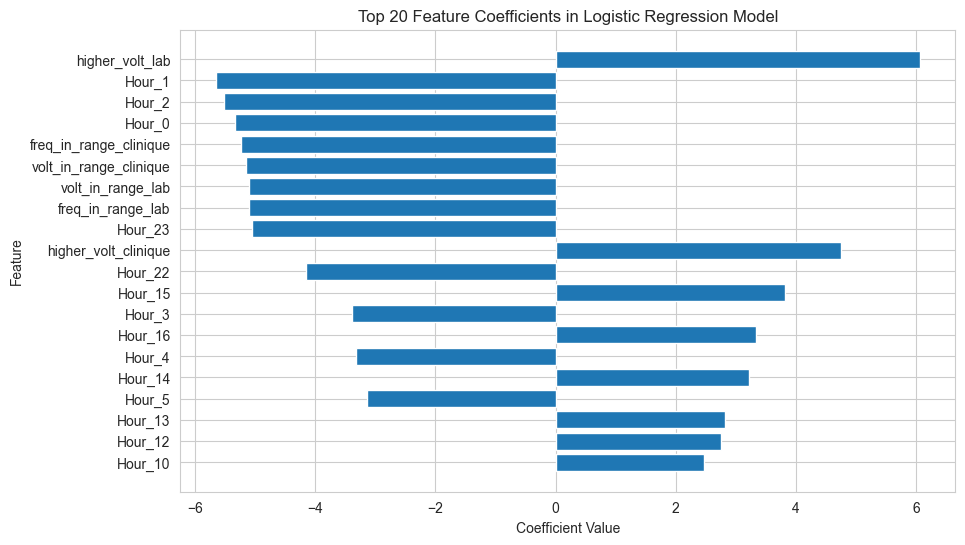

In [52]:

# Step 1: Create copies of the original data
train_data_ts_lg = train_data_ts.copy()
test_data_ts_lg = test_data_ts.copy()

# Calculate the mean flags (assuming the function 'calculate_mean_flags' is defined)
train_data_ts_lg, test_data_ts_lg = calculate_mean_flags(train_data_ts_lg, test_data_ts_lg, train_data_base, columns_to_compare)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_ts_lg[feature_columns]
y_train = train_data_ts_lg['Generator_ON']

X_test = test_data_ts_lg[feature_columns]
y_test = test_data_ts_lg['Generator_ON']

# Fill NaN values in training and testing data with the mean of each column
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())  # Use training mean to avoid data leakage

# Step 2: Train a Logistic Regression model
clf = LogisticRegression(max_iter=1000, random_state=42)
clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_ts_lg['prediction'] = clf.predict(X_train)
test_data_ts_lg['prediction'] = clf.predict(X_test)

# Print accuracy for classification interpretation
train_accuracy = accuracy_score(y_train, train_data_ts_lg['prediction'])
test_accuracy = accuracy_score(y_test, test_data_ts_lg['prediction'])

print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")

# Step 4: Get the feature coefficients (importance in logistic regression)
coefficients = clf.coef_[0]  # Extract coefficients from the trained model

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Coefficient': coefficients
})

# Sort the features by absolute value of the coefficient and keep the top 20
top_20_features = feature_importance_df.reindex(
    feature_importance_df['Coefficient'].abs().sort_values(ascending=False).index
).head(20)

# Display the top 20 most significant features
print("Top 20 features sorted by absolute coefficient value:")
display(top_20_features)

# Visualize the top 20 feature coefficients
plt.figure(figsize=(10, 6))
plt.barh(top_20_features['Feature'], top_20_features['Coefficient'])
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Top 20 Feature Coefficients in Logistic Regression Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most significant features on top
plt.show()

In [53]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_ts_lg['prediction'])

print("Train data prediction distribution:")
print(train_data_ts_lg['prediction'].value_counts())

Train Set Evaluation:
Accuracy: 0.9774397413286302
Confusion Matrix:
[[23061   254]
 [  360  3541]]
Precision: 0.9330698287220026
Recall: 0.9077159702640348
Train data prediction distribution:
prediction
False    23421
True      3795
Name: count, dtype: int64


In [54]:
# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_ts_lg['prediction'])

print("Test data prediction distribution:")
print(test_data_ts_lg['prediction'].value_counts())

Test Set Evaluation:
Accuracy: 0.968915343915344
Confusion Matrix:
[[14679    41]
 [  523  2901]]
Precision: 0.9860639021074099
Recall: 0.8472546728971962
Test data prediction distribution:
prediction
False    15202
True      2942
Name: count, dtype: int64


In [55]:
print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_ts_lg)
display_generator_statistics(test_data_ts_lg)

##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3795 minutes, or 63.25 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 2942 minutes, or 49.03 hours within 302.40 hours


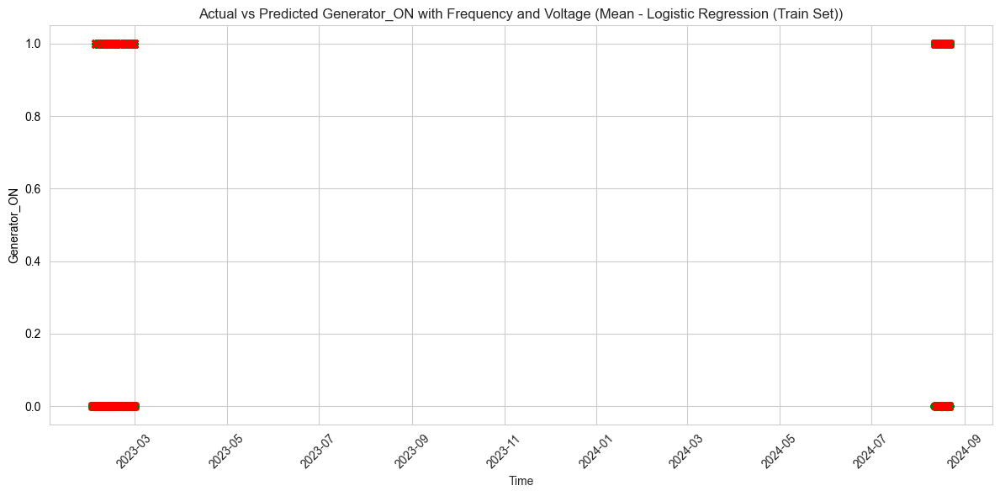

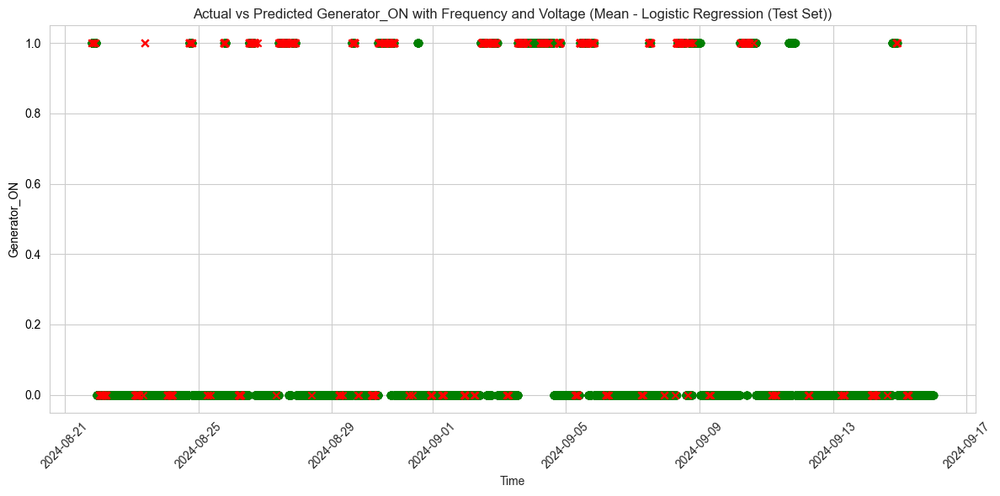

In [56]:
# For Logistic Regression Model with both voltage and frequency
plot_predictions_vs_actuals(train_data_mean_lg, model_name="Mean - Logistic Regression (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)
plot_predictions_vs_actuals(test_data_mean_lg, model_name="Mean - Logistic Regression (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)

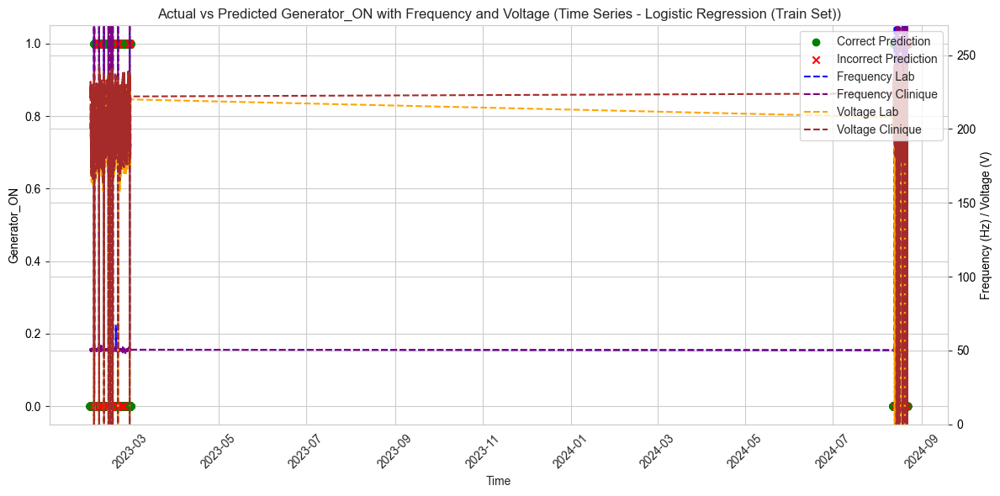

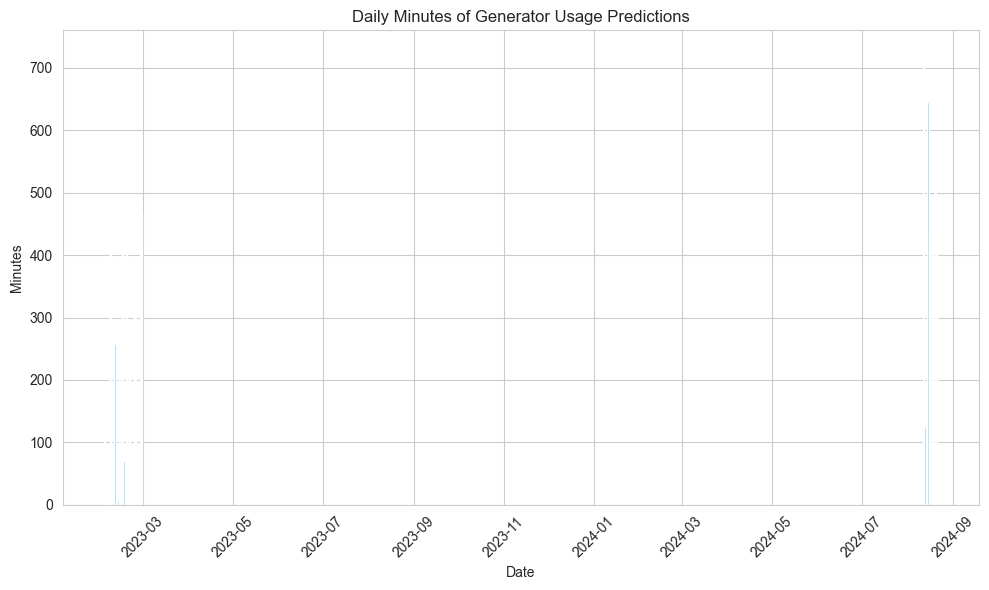

,Date,Count,Minutes,Hours
0,2023-02-03,76,152,2.533333
1,2023-02-06,5,10,0.166667
2,2023-02-07,228,456,7.600000
3,2023-02-08,2,4,0.066667
4,2023-02-09,1,2,0.033333
5,2023-02-10,129,258,4.300000
6,2023-02-12,4,8,0.133333
7,2023-02-13,149,298,4.966667
8,2023-02-15,210,420,7.000000
9,2023-02-16,35,70,1.166667


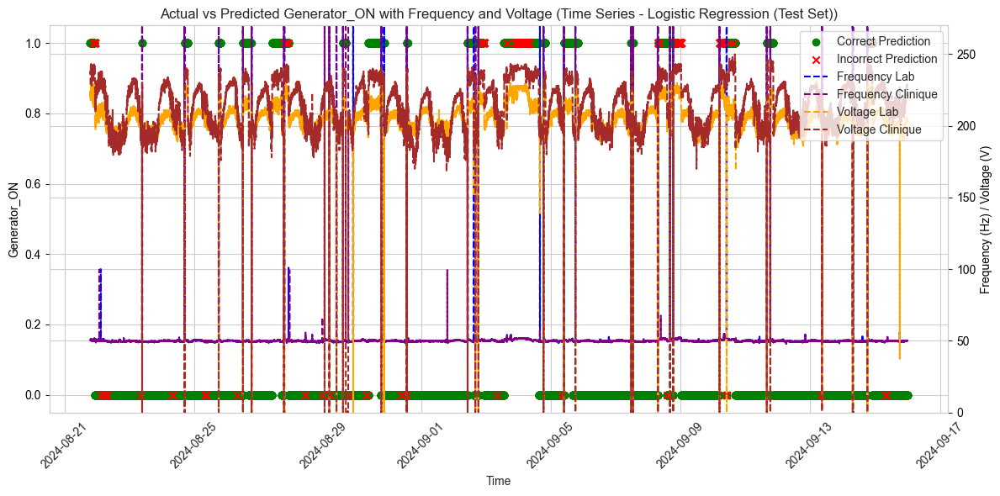

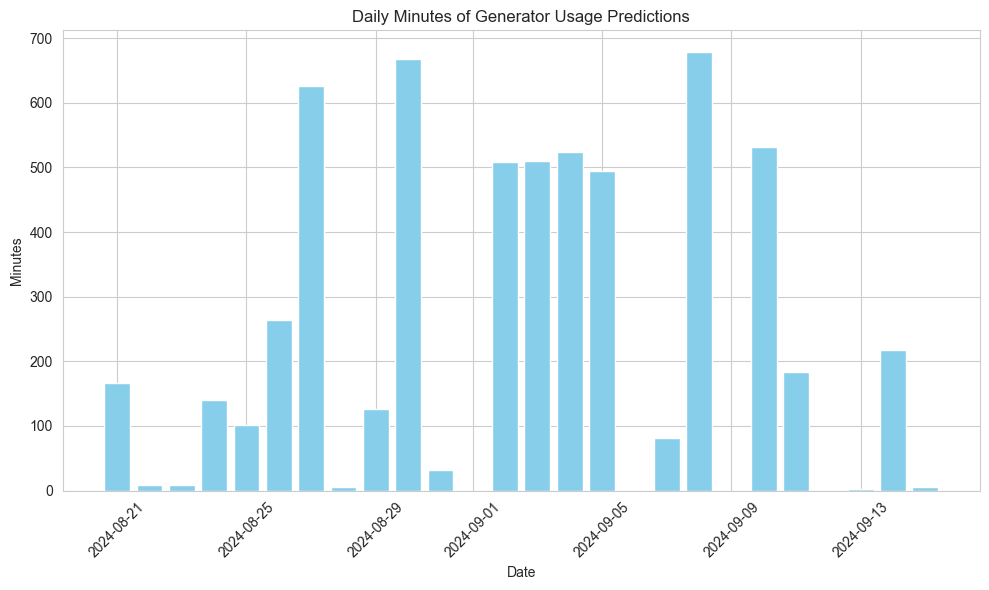

,Date,Count,Minutes,Hours
0,2024-08-21,83,166,2.766667
1,2024-08-22,4,8,0.133333
2,2024-08-23,4,8,0.133333
3,2024-08-24,70,140,2.333333
4,2024-08-25,51,102,1.700000
5,2024-08-26,132,264,4.400000
6,2024-08-27,313,626,10.433333
7,2024-08-28,3,6,0.100000
8,2024-08-29,63,126,2.100000
9,2024-08-30,334,668,11.133333


In [57]:
# For Logistic Regression Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_lg, model_name="Time Series - Logistic Regression (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
train_data_ts_lg_daily_count = plot_true_predictions_histogram(train_data_ts_lg)
display(train_data_ts_lg_daily_count)
# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_ts_lg, model_name="Time Series - Logistic Regression (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
test_data_ts_lg_daily_count = plot_true_predictions_histogram(test_data_ts_lg)
display(test_data_ts_lg_daily_count)

#### 4.2.2. Using Mean of Voltage and Frequency as a Threshold and Time Series - Random Forrest

Top 15 features sorted by importance:


,Feature,Importance
3,Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - cl...,0.401433
2,Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - la...,0.143232
0,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - ...,0.080122
1,Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - ...,0.069076
6,higher_volt_lab,0.046430
7,higher_volt_clinique,0.032406
34,Hour_14,0.016796
31,Hour_11,0.016531
24,Hour_4,0.016030
33,Hour_13,0.015766


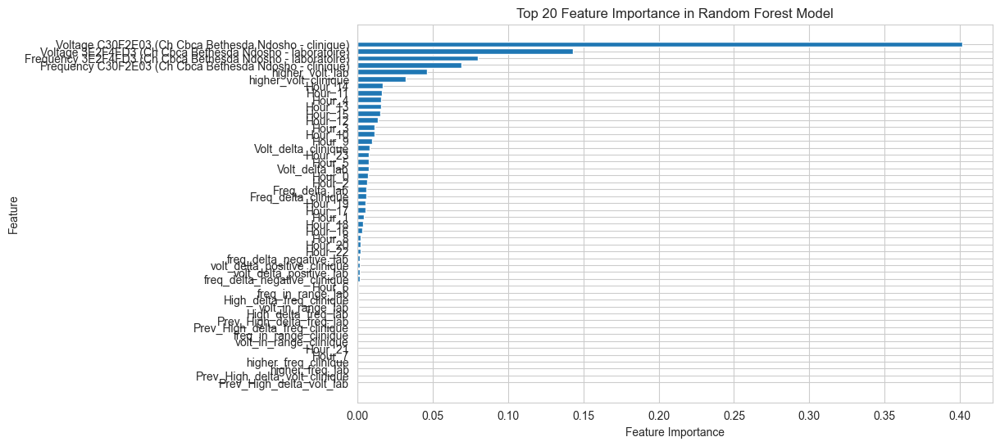

In [58]:
# Step 1: Create copies of the original data
train_data_ts_rf = train_data_ts.copy()
test_data_ts_rf = test_data_ts.copy()

# Taking the mean of the dataframe (using the previous function)
train_data_ts_rf, test_data_ts_rf = calculate_mean_flags(train_data_ts_rf, test_data_ts_rf, train_data_base, columns_to_compare)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_ts_rf[feature_columns]
y_train = train_data_ts_rf['Generator_ON']

X_test = test_data_ts_rf[feature_columns]
y_test = test_data_ts_rf['Generator_ON']

# Step 2: Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_ts_rf['prediction'] = clf.predict(X_train)
test_data_ts_rf['prediction'] = clf.predict(X_test)

# Step 4: Get the feature importances
importances = clf.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': importances
})

# Sort the features by importance and keep only the top 10
top_15_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(50)

# Display the top 15 most important features
print("Top 15 features sorted by importance:")
display(top_15_features)

# Visualize the top 15 feature importances
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.barh(top_15_features['Feature'], top_15_features['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance in Random Forest Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important on top
plt.show()

Evaluating the train and test set

In [59]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_ts_rf['prediction'])

print("Train data prediction distribution:")
print(train_data_ts_rf['prediction'].value_counts())

Train Set Evaluation:
Accuracy: 1.0
Confusion Matrix:
[[23315     0]
 [    0  3901]]
Precision: 1.0
Recall: 1.0
Train data prediction distribution:
prediction
False    23315
True      3901
Name: count, dtype: int64


In [60]:
# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_ts_rf['prediction'])

print("Test data prediction distribution:")
print(test_data_ts_rf['prediction'].value_counts())

Test Set Evaluation:
Accuracy: 0.9930555555555556
Confusion Matrix:
[[14711     9]
 [  117  3307]]
Precision: 0.997285886610374
Recall: 0.9658294392523364
Test data prediction distribution:
prediction
False    14828
True      3316
Name: count, dtype: int64


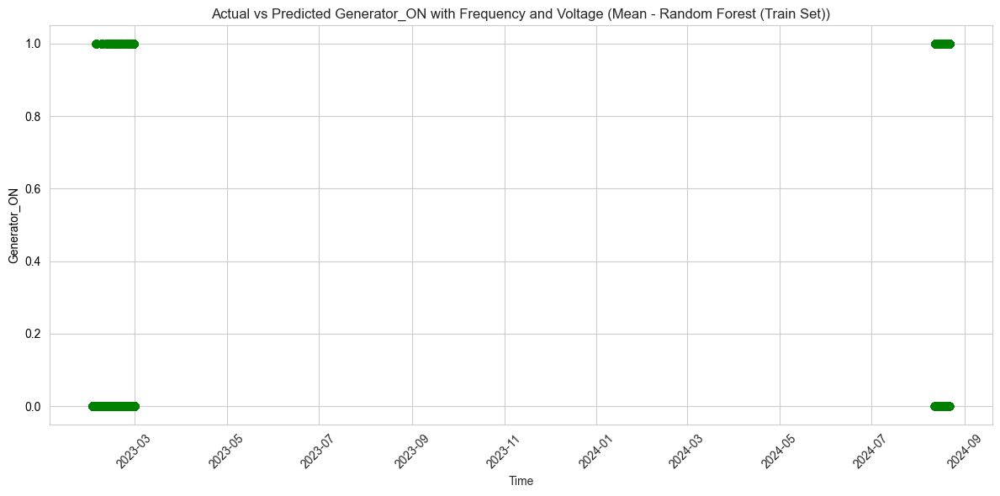

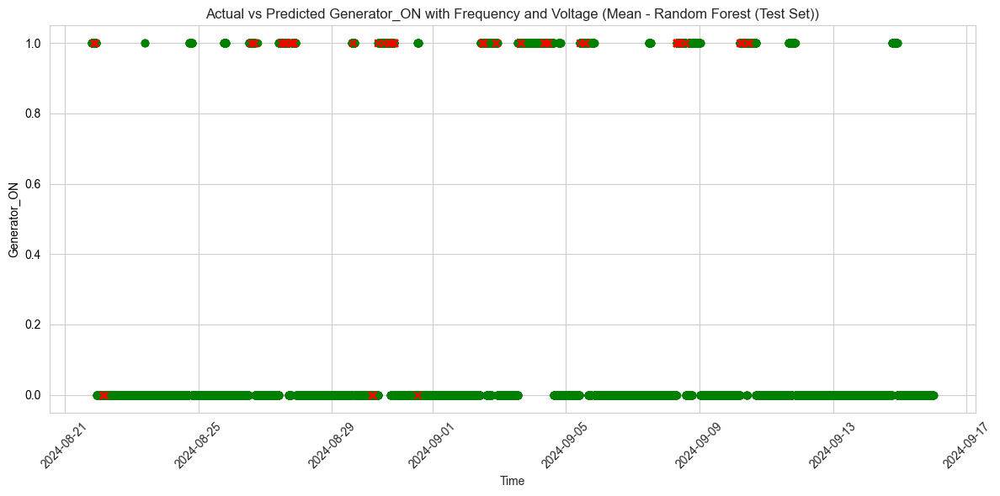

In [61]:
# For Random Forest Model with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_rf, model_name="Mean - Random Forest (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)
plot_predictions_vs_actuals(test_data_ts_rf, model_name="Mean - Random Forest (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)

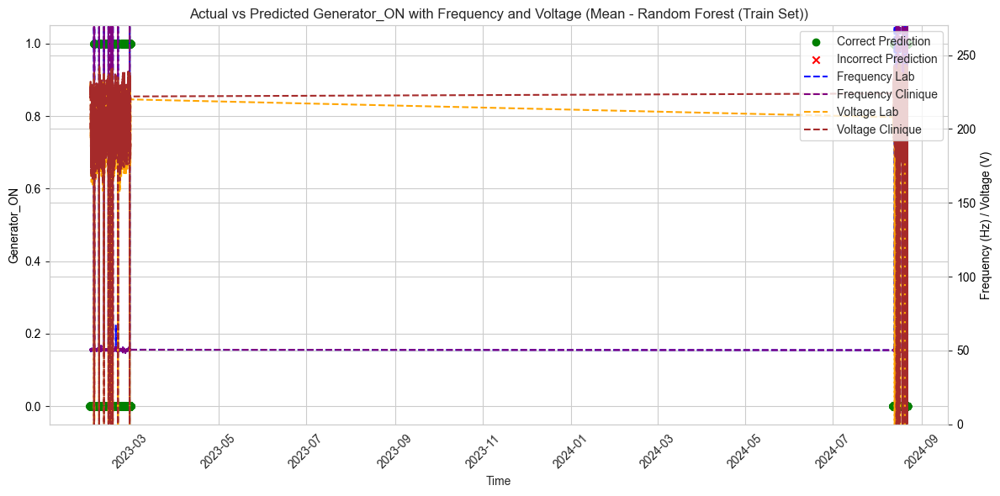

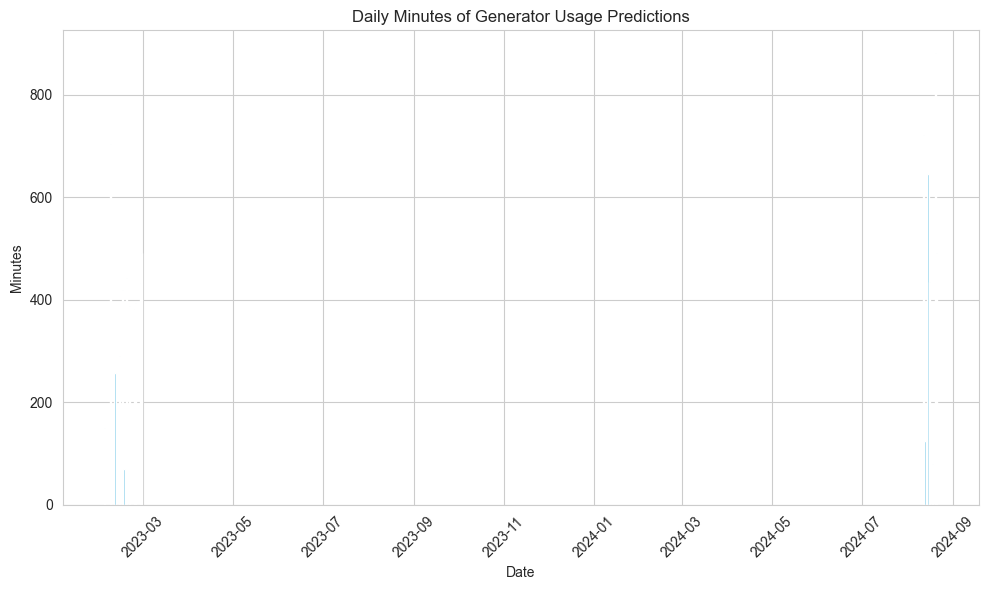

,Date,Count,Minutes,Hours
0,2023-02-03,75,150,2.500000
1,2023-02-07,352,704,11.733333
2,2023-02-10,129,258,4.300000
3,2023-02-13,145,290,4.833333
4,2023-02-15,210,420,7.000000
5,2023-02-16,35,70,1.166667
6,2023-02-18,221,442,7.366667
7,2023-02-20,194,388,6.466667
8,2023-02-23,191,382,6.366667
9,2023-02-24,197,394,6.566667


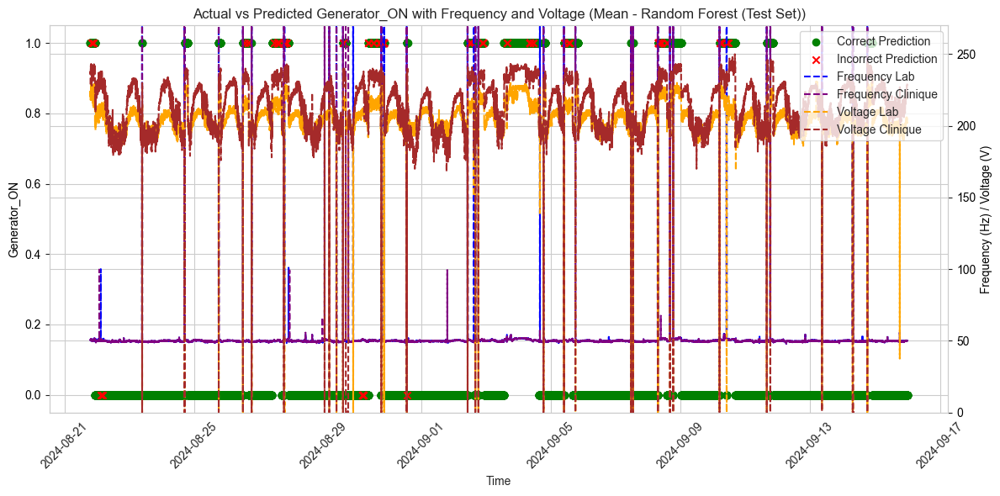

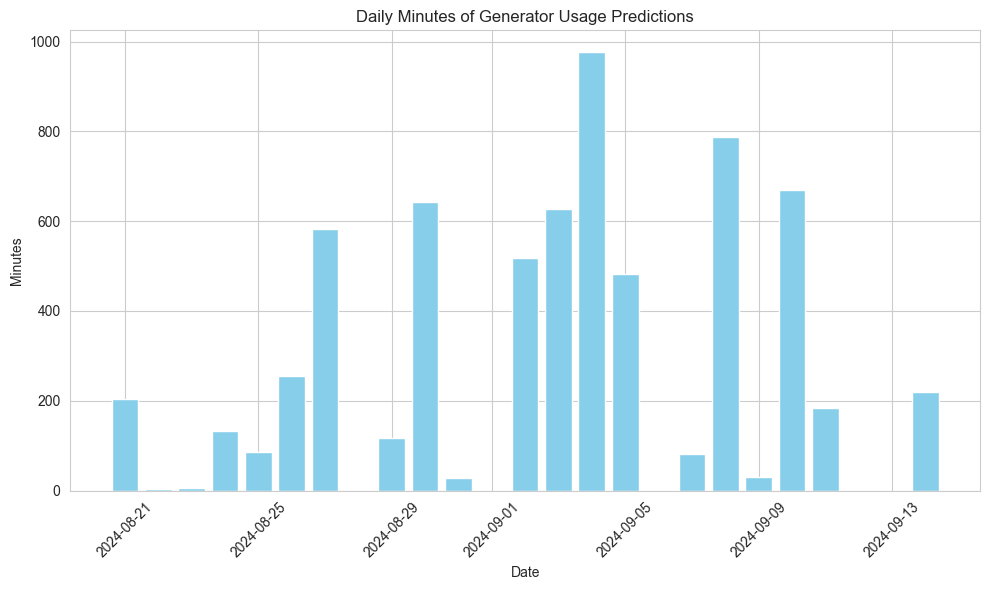

,Date,Count,Minutes,Hours
0,2024-08-21,102,204,3.400000
1,2024-08-22,2,4,0.066667
2,2024-08-23,3,6,0.100000
3,2024-08-24,66,132,2.200000
4,2024-08-25,43,86,1.433333
5,2024-08-26,127,254,4.233333
6,2024-08-27,291,582,9.700000
7,2024-08-29,58,116,1.933333
8,2024-08-30,321,642,10.700000
9,2024-08-31,14,28,0.466667


In [62]:
# For Random Forest Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_rf, model_name="Mean - Random Forest (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
train_data_ts_rf_daily_count = plot_true_predictions_histogram(train_data_ts_rf)
display(train_data_ts_rf_daily_count)
# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_ts_rf, model_name="Mean - Random Forest (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
test_data_ts_rf_daily_count = plot_true_predictions_histogram(test_data_ts_rf)
display(test_data_ts_rf_daily_count)

In [63]:
train_data_ts_rf['Generator_ON'].dtype

dtype('bool')

In [64]:
print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_ts_rf)
display_generator_statistics(test_data_ts_rf)

##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 3316 minutes, or 55.27 hours within 302.40 hours


#### 4.2.3. Using Mean of Voltage and Frequency as a Threshold and Time Series - XGBoost

In [65]:

# Step 0: Copy rf data
train_data_ts_boost = train_data_ts.copy()
test_data_ts_boost = test_data_ts.copy()

# Taking the mean of the dataframe (using the previous function)
train_data_ts_boost, test_data_ts_boost = calculate_mean_flags(train_data_ts_boost, test_data_ts_boost, train_data_base, columns_to_compare)


# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]


# Step 1: Use the same data and feature columns
X_train = train_data_ts_boost[feature_columns]
y_train = train_data_ts_boost['Generator_ON']

X_test = test_data_ts_boost[feature_columns]
y_test = test_data_ts_boost['Generator_ON']

X_train['Prev_High_delta_freq_lab'] = pd.to_numeric(X_train['Prev_High_delta_freq_lab'], errors='coerce')
X_train['Prev_High_delta_freq_clinique'] = pd.to_numeric(X_train['Prev_High_delta_freq_clinique'], errors='coerce')
X_train['Prev_High_delta_volt_lab'] = pd.to_numeric(X_train['Prev_High_delta_volt_lab'], errors='coerce')
X_train['Prev_High_delta_volt_clinique'] = pd.to_numeric(X_train['Prev_High_delta_volt_clinique'], errors='coerce')

X_test['Prev_High_delta_freq_lab'] = pd.to_numeric(X_test['Prev_High_delta_freq_lab'], errors='coerce')
X_test['Prev_High_delta_freq_clinique'] = pd.to_numeric(X_test['Prev_High_delta_freq_clinique'], errors='coerce')
X_test['Prev_High_delta_volt_lab'] = pd.to_numeric(X_test['Prev_High_delta_volt_lab'], errors='coerce')
X_test['Prev_High_delta_volt_clinique'] = pd.to_numeric(X_test['Prev_High_delta_volt_clinique'], errors='coerce')


/var/folders/7q/629hmk5n2d38m2bbwtv3djvc0000gn/T/ipykernel_14691/3060535340.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Prev_High_delta_freq_lab'] = pd.to_numeric(X_train['Prev_High_delta_freq_lab'], errors='coerce')
/var/folders/7q/629hmk5n2d38m2bbwtv3djvc0000gn/T/ipykernel_14691/3060535340.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Prev_High_delta_freq_clinique'] = pd.to_numeric(X_train['Prev_High_delta_freq_clinique'], errors='coerce')
/var/folders/7q/629hmk5n2d38m2bb

#### This section is for XGBoost parameter search using cross validation

In [66]:

'''
# Step 2: Train an XGBoost Classifier
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 300, 500],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 10, 100]
}

grid_search = GridSearchCV(
    estimator=XGBClassifier(random_state=42),
    param_grid=param_grid,
    scoring='roc_auc',  # Adjust based on your metric
    cv=3,               # Cross-validation splits
    verbose=2
)

grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)


# Step 3: Make Predictions on the train and test sets
train_data_ts_boost['prediction'] = xgb_clf.predict(X_train)
test_data_ts_boost['prediction'] = xgb_clf.predict(X_test)

# Step 4: Evaluate Feature Importances
importances = xgb_clf.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': importances
})

# Sort the features by importance and keep only the top 20
top_20_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(20)

# Display the top 20 most important features
print("Top 20 features sorted by importance (XGBoost):")
display(top_20_features)

# Visualize the top 20 feature importances
plt.figure(figsize=(10, 6))
plt.barh(top_20_features['Feature'], top_20_features['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance in XGBoost Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important on top
plt.show()
'''

'\n# Step 2: Train an XGBoost Classifier\nparam_grid = {\n    \'max_depth\': [3, 5, 7],\n    \'learning_rate\': [0.01, 0.1, 0.2],\n    \'n_estimators\': [100, 300, 500],\n    \'subsample\': [0.6, 0.8, 1.0],\n    \'colsample_bytree\': [0.6, 0.8, 1.0],\n    \'gamma\': [0, 1, 5],\n    \'reg_alpha\': [0, 0.1, 1],\n    \'reg_lambda\': [1, 10, 100]\n}\n\ngrid_search = GridSearchCV(\n    estimator=XGBClassifier(random_state=42),\n    param_grid=param_grid,\n    scoring=\'roc_auc\',  # Adjust based on your metric\n    cv=3,               # Cross-validation splits\n    verbose=2\n)\n\ngrid_search.fit(X_train, y_train)\n\nprint("Best parameters:", grid_search.best_params_)\n\n\n# Step 3: Make Predictions on the train and test sets\ntrain_data_ts_boost[\'prediction\'] = xgb_clf.predict(X_train)\ntest_data_ts_boost[\'prediction\'] = xgb_clf.predict(X_test)\n\n# Step 4: Evaluate Feature Importances\nimportances = xgb_clf.feature_importances_\n\n# Create a DataFrame for better visualization\nfeature

In [67]:
# Use the best parameters from GridSearchCV
best_params = {
    'colsample_bytree': 0.6,
    'gamma': 0,
    'learning_rate': 0.1,
    'max_depth': 3,
    'n_estimators': 300,
    'reg_alpha': 0,
    'reg_lambda': 1,
    'subsample': 1.0
}

# Initialize the model with the best parameters
final_model = XGBClassifier(
    random_state=42,
    **best_params
)

# Fit the model on the entire training data
final_model.fit(X_train, y_train)

# Make predictions on the test set
train_data_ts_boost['prediction'] = final_model.predict(X_train)
test_data_ts_boost['prediction'] = final_model.predict(X_test)

# Evaluate the model on the test set
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix

# Classification report
print("Classification Report:")
print(classification_report(y_test, test_data_ts_boost['prediction']))

# AUC-ROC score
print("AUC-ROC Score:")
y_test_proba = final_model.predict_proba(X_test)[:, 1]
print(roc_auc_score(y_test, y_test_proba))

# Confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, test_data_ts_boost['prediction']))

Classification Report:
              precision    recall  f1-score   support

       False       0.99      1.00      1.00     14720
        True       0.99      0.97      0.98      3424

    accuracy                           0.99     18144
   macro avg       0.99      0.98      0.99     18144
weighted avg       0.99      0.99      0.99     18144

AUC-ROC Score:
0.9994633767237657
Confusion Matrix:
[[14700    20]
 [  109  3315]]


In [68]:
# Step 5: Evaluate Model Performance
# Evaluate on the train set
print("Train Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_train, train_data_ts_boost['prediction'])

print("Train data prediction distribution (XGBoost):")
print(train_data_ts_boost['prediction'].value_counts())

Train Set Evaluation (XGBoost):
Accuracy: 0.9970605526161082
Confusion Matrix:
[[23258    57]
 [   23  3878]]
Precision: 0.9855146124523507
Recall: 0.99410407587798
Train data prediction distribution (XGBoost):
prediction
0    23281
1     3935
Name: count, dtype: int64


In [69]:
# Evaluate on the test set
print("\nTest Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_test, test_data_ts_boost['prediction'])

print("Test data prediction distribution (XGBoost):")
print(test_data_ts_boost['prediction'].value_counts())


Test Set Evaluation (XGBoost):
Accuracy: 0.9928902116402116
Confusion Matrix:
[[14700    20]
 [  109  3315]]
Precision: 0.9940029985007496
Recall: 0.9681658878504673
Test data prediction distribution (XGBoost):
prediction
0    14809
1     3335
Name: count, dtype: int64


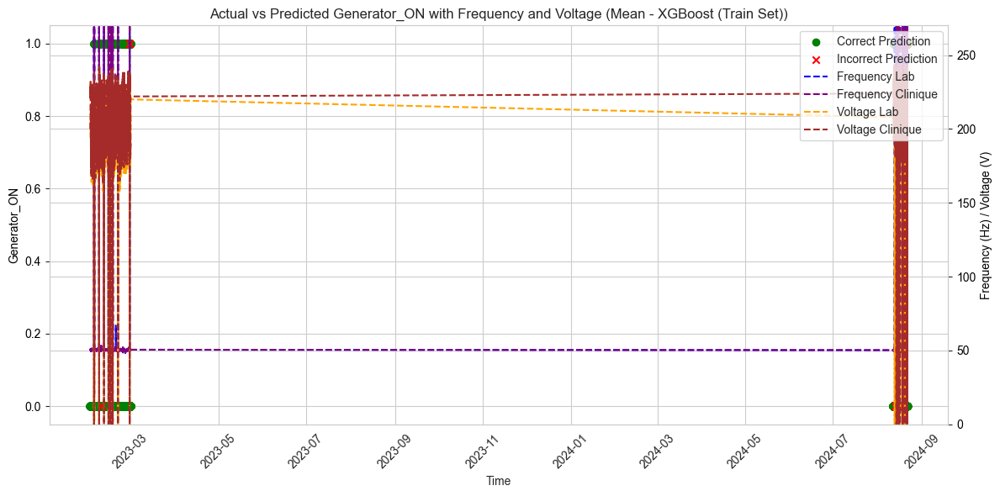

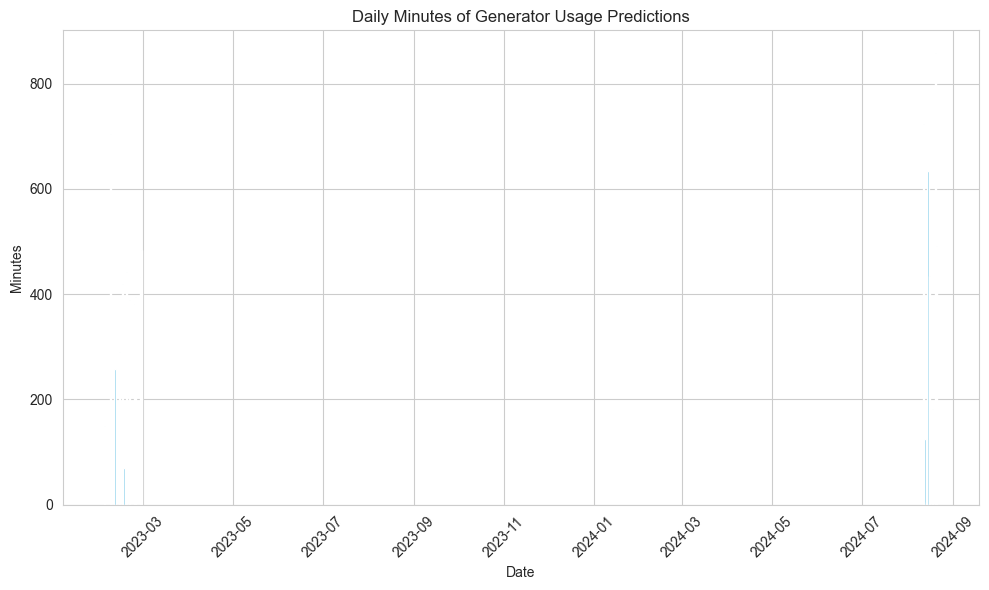

,Date,Count,Minutes,Hours
0,2023-02-03,75,150,2.500000
1,2023-02-07,352,704,11.733333
2,2023-02-08,1,2,0.033333
3,2023-02-10,129,258,4.300000
4,2023-02-13,145,290,4.833333
5,2023-02-15,210,420,7.000000
6,2023-02-16,35,70,1.166667
7,2023-02-18,221,442,7.366667
8,2023-02-20,194,388,6.466667
9,2023-02-23,191,382,6.366667


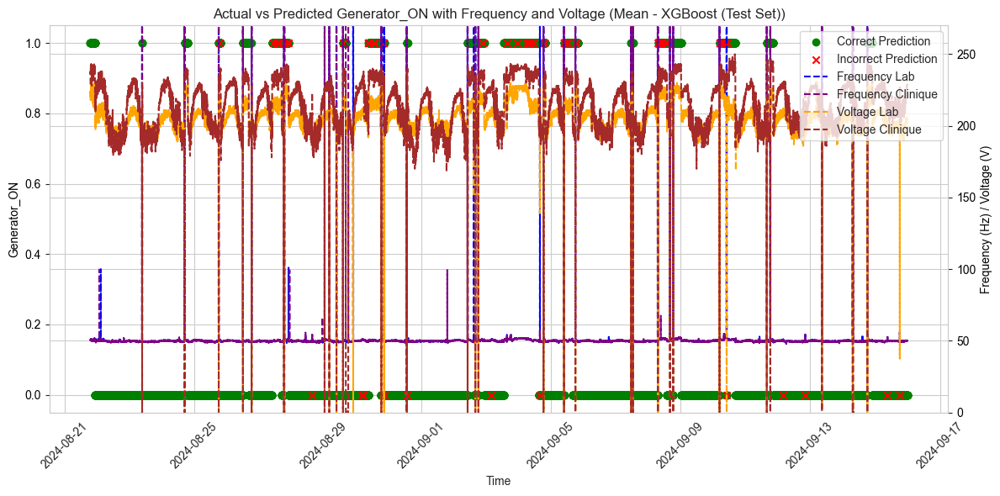

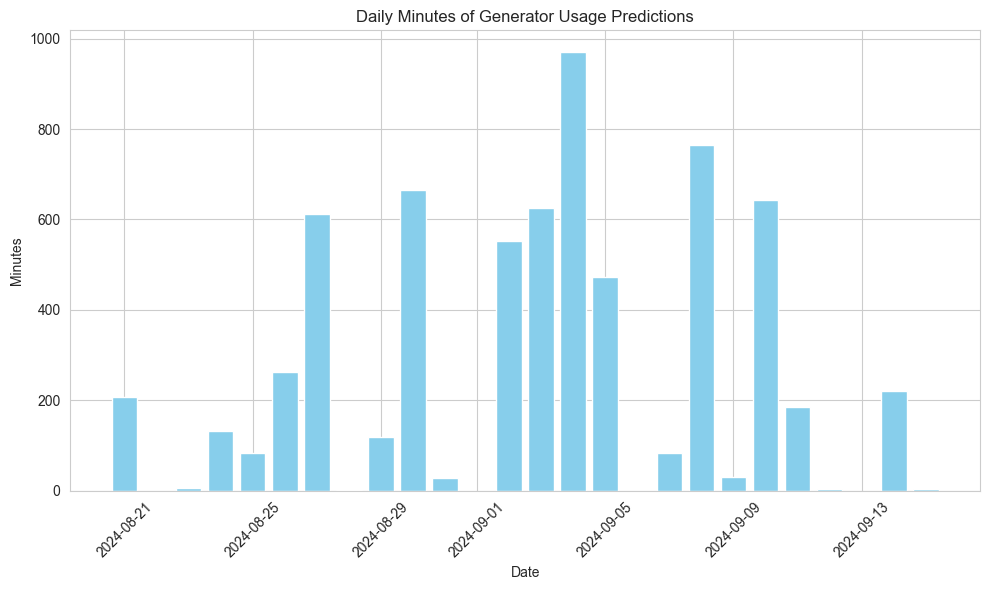

,Date,Count,Minutes,Hours
0,2024-08-21,104,208,3.466667
1,2024-08-23,3,6,0.100000
2,2024-08-24,66,132,2.200000
3,2024-08-25,42,84,1.400000
4,2024-08-26,131,262,4.366667
5,2024-08-27,306,612,10.200000
6,2024-08-28,1,2,0.033333
7,2024-08-29,59,118,1.966667
8,2024-08-30,333,666,11.100000
9,2024-08-31,14,28,0.466667


In [70]:
# For Boosting Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_boost, model_name="Mean - XGBoost (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
train_data_ts_boost_daily_count = plot_true_predictions_histogram(train_data_ts_boost)
display(train_data_ts_boost_daily_count)
# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_ts_boost, model_name="Mean - XGBoost (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
test_data_ts_boost_daily_count = plot_true_predictions_histogram(test_data_ts_boost)
display(test_data_ts_boost_daily_count)

In [71]:
print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_ts_boost)
display_generator_statistics(test_data_ts_boost)

##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3935 minutes, or 65.58 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 3335 minutes, or 55.58 hours within 302.40 hours


### 4.3. Correlation Feature

In this section we're applying additional feature using the : 
- Hidden Markov Model : Detecting states

In [72]:
### Applying Hidden Markov Model

# Insert variables
n_states = 5
hmm_columns = [freq_a, freq_b, volt_a, volt_b]

# Make copies of original train and test sets
train_data_ts_co = train_data_ts.copy()
test_data_ts_co = test_data_ts.copy()

# Sort by Time
train_data_ts_co.sort_values('Time', ascending=True, inplace=True)
test_data_ts_co.sort_values('Time', ascending=True, inplace=True)

# Clean NaNs, infs, and low-variance columns
valid_hmm_columns = []

for col in hmm_columns:
    if col in train_data_ts_co.columns and col in test_data_ts_co.columns:
        values_train = train_data_ts_co[col].replace([np.inf, -np.inf], 0).fillna(0)
        values_test = test_data_ts_co[col].replace([np.inf, -np.inf], 0).fillna(0)

        if values_train.std() < 1e-3:
            print(f"⚠️ Column {col} has too low variance (std={values_train.std():.5f}), skipping HMM fitting.")
        else:
            train_data_ts_co[col] = values_train
            test_data_ts_co[col] = values_test
            valid_hmm_columns.append(col)

hmm_columns = valid_hmm_columns  # update hmm_columns

# Train HMMs on train set
train_data_ts_co, hmm_models, hmm_features = generate_hmm(
    train_data_ts_co,
    hmm_columns,
    n_states=n_states
)

# Apply HMMs to test set
def apply_hmm(df, columns, hmm_models):
    """
    Apply trained HMM models to a new dataset and generate one-hot encoded HMM states.

    Parameters:
    - df (DataFrame): The DataFrame to apply HMMs to.
    - columns (list): List of feature columns to apply HMMs.
    - hmm_models (dict): Trained HMM models from the training set.

    Returns:
    - df_result (DataFrame): DataFrame with added HMM states and one-hot encoded features.
    """
    df_result = df.copy()
    hmm_feature_cols = []

    for col in columns:
        if col not in df_result.columns:
            print(f"⚠️ Column {col} missing in DataFrame. Skipping...")
            continue

        X = df_result[col].replace([np.inf, -np.inf], 0).fillna(0).to_numpy().reshape(-1, 1)
        state_col = f'HMM_State_{col}'
        model = hmm_models.get(col)

        if model is not None:
            df_result[state_col] = model.predict(X)

            # One-hot encode HMM state
            dummies = pd.get_dummies(df_result[state_col], prefix=state_col)
            df_result = pd.concat([df_result, dummies], axis=1)
            hmm_feature_cols.extend(dummies.columns.tolist())
        else:
            print(f"⚠️ No trained HMM model found for {col}. Skipping...")

    return df_result

# Now apply
test_data_ts_co = apply_hmm(test_data_ts_co, hmm_columns, hmm_models)

# Display result
display(train_data_ts_co)
display(test_data_ts_co)


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_1,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_2,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_3,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_4,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_0,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_1,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_2,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_3,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_4
0,2023-02-01 00:00:00,50.5,50.4,223.0,223.0,False,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
1,2023-02-01 00:02:00,50.6,50.5,223.0,224.0,False,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
2,2023-02-01 00:04:00,50.6,50.6,223.0,224.0,False,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
3,2023-02-01 00:06:00,50.6,50.5,224.0,225.0,False,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
4,2023-02-01 00:08:00,50.5,50.6,222.0,224.0,False,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26941,2024-08-21 19:02:00,50.5,50.5,222.0,238.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
26942,2024-08-21 19:04:00,50.6,50.6,223.0,239.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
26943,2024-08-21 19:06:00,50.7,50.6,222.0,238.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
26944,2024-08-21 19:08:00,50.5,50.4,222.0,236.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Generator_ON,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_1,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_2,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_3,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_4,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_0,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_1,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_2,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_3,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_4
26946,2024-08-21 19:12:00,50.4,50.5,220.0,236.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
26947,2024-08-21 19:14:00,50.7,50.7,224.0,238.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
26948,2024-08-21 19:16:00,50.5,50.5,221.0,237.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
26949,2024-08-21 19:18:00,50.7,50.6,222.0,238.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
26950,2024-08-21 19:20:00,50.7,50.7,224.0,238.0,True,False,False,True,True,...,False,False,True,False,3,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39355,2024-09-15 23:50:00,50.1,50.1,202.0,229.0,False,False,False,False,True,...,False,False,False,True,3,False,False,False,True,False
39356,2024-09-15 23:52:00,50.1,50.1,202.0,228.0,False,False,False,False,True,...,False,False,False,False,3,False,False,False,True,False
39357,2024-09-15 23:54:00,50.0,50.0,203.0,229.0,False,False,False,False,True,...,True,False,False,False,3,False,False,False,True,False
39358,2024-09-15 23:56:00,50.1,50.1,202.0,229.0,False,False,False,False,True,...,False,False,False,True,3,False,False,False,True,False



Mean values per HMM state for Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire):
Series([], Name: Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire), dtype: float64)


/var/folders/7q/629hmk5n2d38m2bbwtv3djvc0000gn/T/ipykernel_14691/3642123367.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.sort_values('Time', ascending=True, inplace=True)


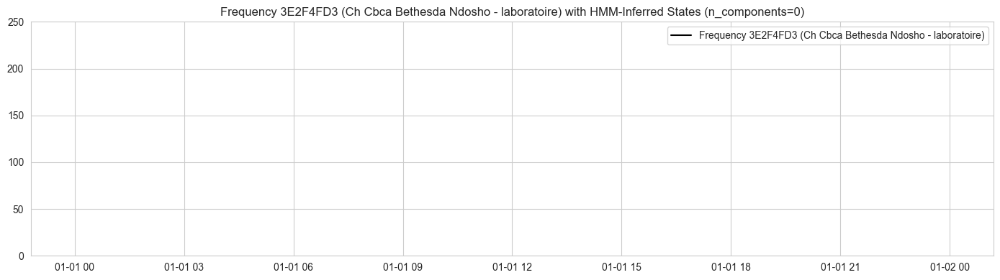


Mean values per HMM state for Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique):
Series([], Name: Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique), dtype: float64)


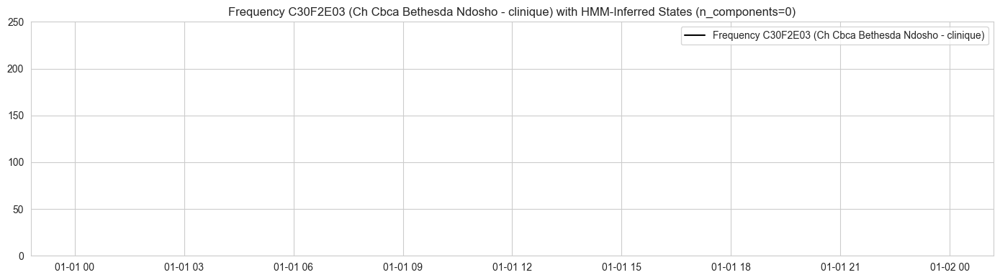


Mean values per HMM state for Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire):
Series([], Name: Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire), dtype: float64)


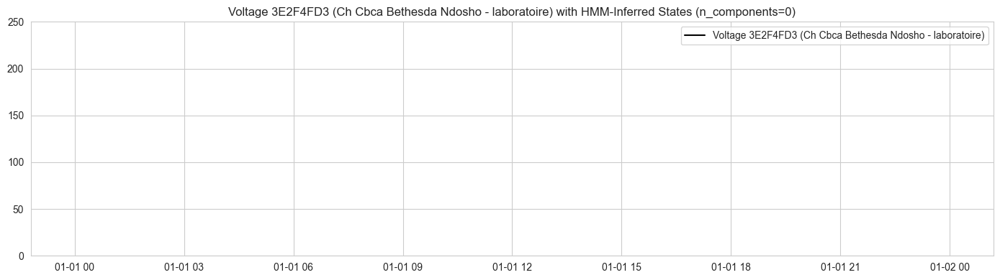


Mean values per HMM state for Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique):
Series([], Name: Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique), dtype: float64)


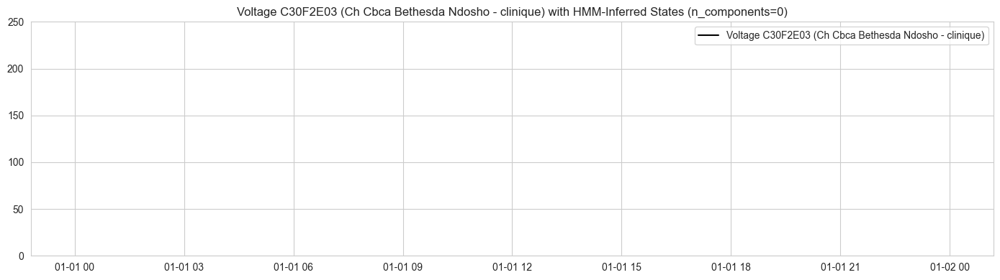

In [73]:
#### SHOWING THE RESULT OF HMM SIGNAL
    
# Create the signal
start_date = '2023-01-01 00:00:00'
finished_date = '2023-01-28 23:59:59'
filtered_data = train_data_ts_co[(train_data_ts_co['Time'] >= start_date) & (train_data_ts_co['Time'] <= finished_date)]
filtered_data.sort_values('Time', ascending=True, inplace=True)

show_hmm_result(filtered_data, hmm_columns, y_max=250)

In [74]:
hmm_features

['HMM_State_Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_0',
 'HMM_State_Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_1',
 'HMM_State_Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_2',
 'HMM_State_Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_3',
 'HMM_State_Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_4',
 'HMM_State_Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_0',
 'HMM_State_Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_1',
 'HMM_State_Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_2',
 'HMM_State_Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_3',
 'HMM_State_Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)_4',
 'HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_0',
 'HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_1',
 'HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire)_2',
 'HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda

#### 4.3.1. Adding the Correlation functions (HMM and Ruptures)  - Logistic Regression

Train Accuracy: 0.99
Test Accuracy: 0.97
Top 20 features sorted by absolute coefficient value:


/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/.venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,Feature,Coefficient
65,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda N...,6.521592
20,Hour_0,-5.314970
43,Hour_23,-4.994076
21,Hour_1,-4.920579
22,Hour_2,-4.697121
35,Hour_15,3.761480
23,Hour_3,-3.643722
24,Hour_4,-3.498535
34,Hour_14,3.302206
71,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda N...,-3.016595


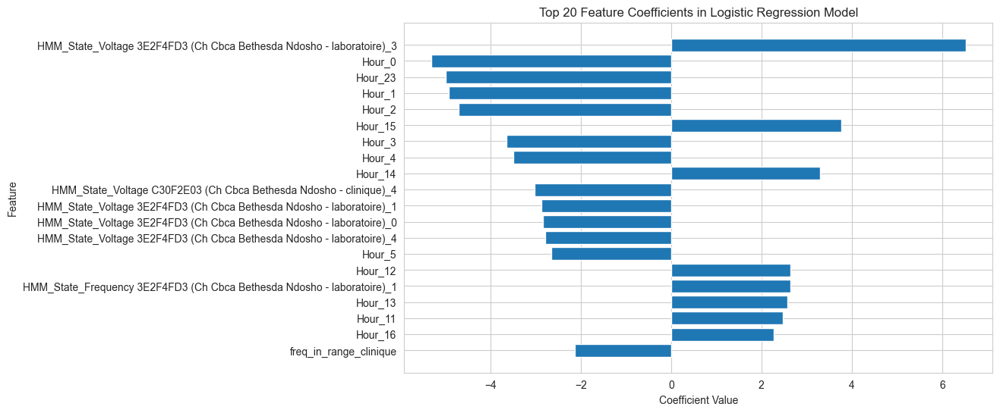

In [75]:
# Step 1: Create copies of the original data
train_data_ts_co_lg = train_data_ts_co.copy()
test_data_ts_co_lg = test_data_ts_co.copy()

# Calculate the mean flags
train_data_ts_co_lg, test_data_ts_co_lg = calculate_mean_flags(
    train_data_ts_co_lg,
    test_data_ts_co_lg,
    train_data_base,
    columns_to_compare
)

# Define your static feature columns
static_feature_columns = [
    freq_a, freq_b, volt_a, volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

# Combine static features + HMM-generated features
feature_columns = static_feature_columns + hmm_features

# Prepare X and y
X_train = train_data_ts_co_lg[feature_columns]
y_train = train_data_ts_co_lg['Generator_ON']

# Fix X_test: reindex so missing columns (e.g., HMM states) are filled with 0
X_test = test_data_ts_co_lg.reindex(columns=feature_columns, fill_value=0)
y_test = test_data_ts_co_lg['Generator_ON']

# Fill any remaining NaN values (very safe)
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())  # Use training mean to avoid data leakage

# Step 2: Train a Logistic Regression model
clf = LogisticRegression(max_iter=1000, random_state=42)
clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_ts_co_lg['prediction'] = clf.predict(X_train)
test_data_ts_co_lg['prediction'] = clf.predict(X_test)

# Print accuracy for classification interpretation
train_accuracy = accuracy_score(y_train, train_data_ts_co_lg['prediction'])
test_accuracy = accuracy_score(y_test, test_data_ts_co_lg['prediction'])

print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")

# Step 4: Get the feature coefficients
coefficients = clf.coef_[0]

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Coefficient': coefficients
})

# Sort by absolute value of coefficient
top_20_features = feature_importance_df.reindex(
    feature_importance_df['Coefficient'].abs().sort_values(ascending=False).index
).head(20)

# Display the top 20 features
print("Top 20 features sorted by absolute coefficient value:")
display(top_20_features)

# Visualize the top 20 feature coefficients
plt.figure(figsize=(10, 6))
plt.barh(top_20_features['Feature'], top_20_features['Coefficient'])
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Top 20 Feature Coefficients in Logistic Regression Model')
plt.gca().invert_yaxis()  # Most important on top
plt.show()

In [76]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_ts_co_lg['prediction'])

print("Train data prediction distribution:")
print(train_data_ts_co_lg['prediction'].value_counts())

# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_ts_co_lg['prediction'])

print("Test data prediction distribution:")
print(test_data_ts_co_lg['prediction'].value_counts())

print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_ts_co_lg)
display_generator_statistics(test_data_ts_co_lg)

Train Set Evaluation:
Accuracy: 0.987801293356849
Confusion Matrix:
[[23117   198]
 [  134  3767]]
Precision: 0.9500630517023959
Recall: 0.9656498333760575
Train data prediction distribution:
prediction
False    23251
True      3965
Name: count, dtype: int64
Test Set Evaluation:
Accuracy: 0.9702932098765432
Confusion Matrix:
[[14700    20]
 [  519  2905]]
Precision: 0.9931623931623932
Recall: 0.8484228971962616
Test data prediction distribution:
prediction
False    15219
True      2925
Name: count, dtype: int64
##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3965 minutes, or 66.08 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 2925 minutes, or 48.75 hours within 302.40 hours


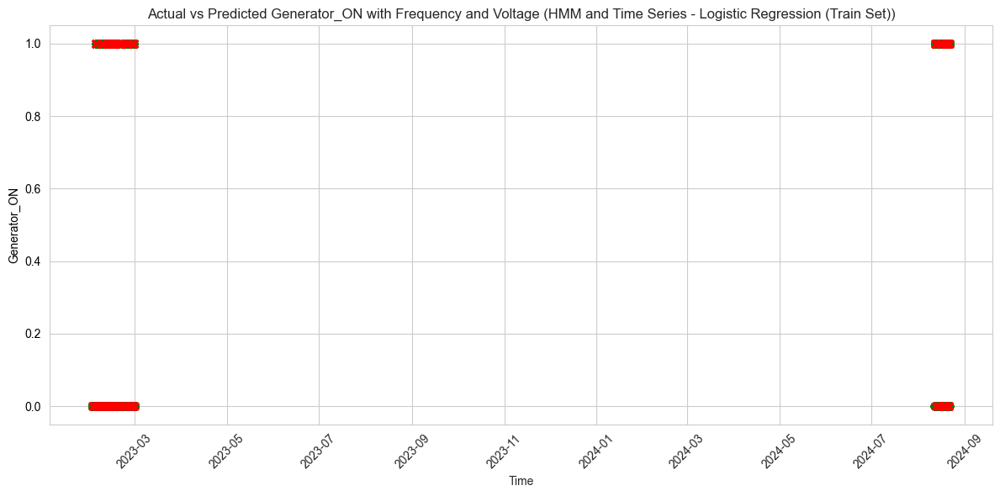

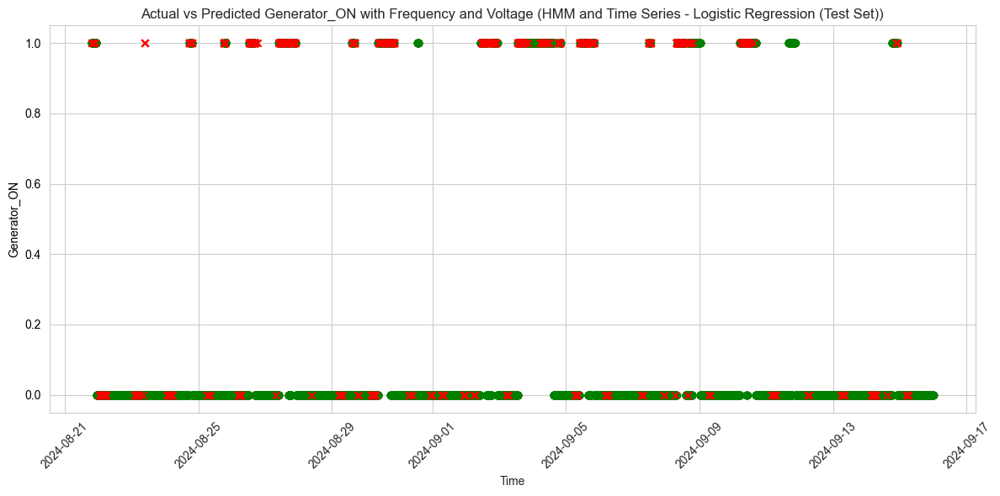

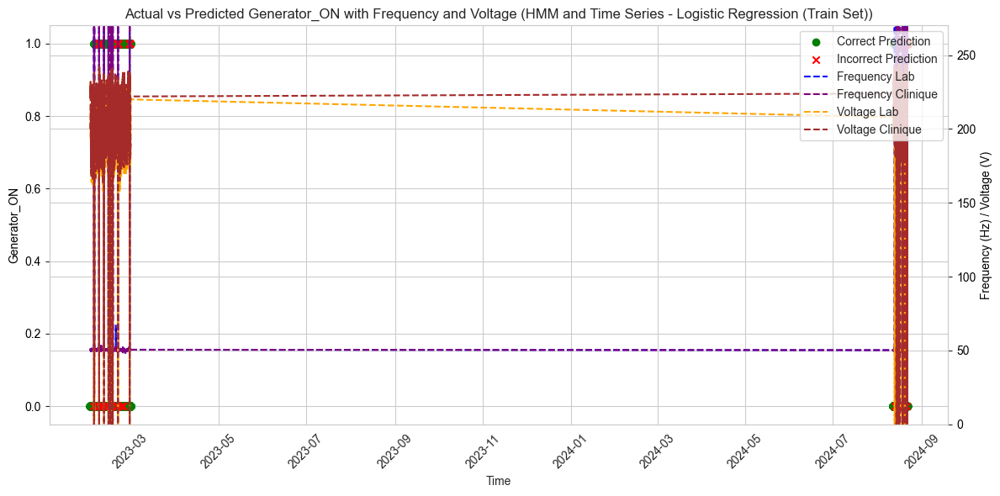

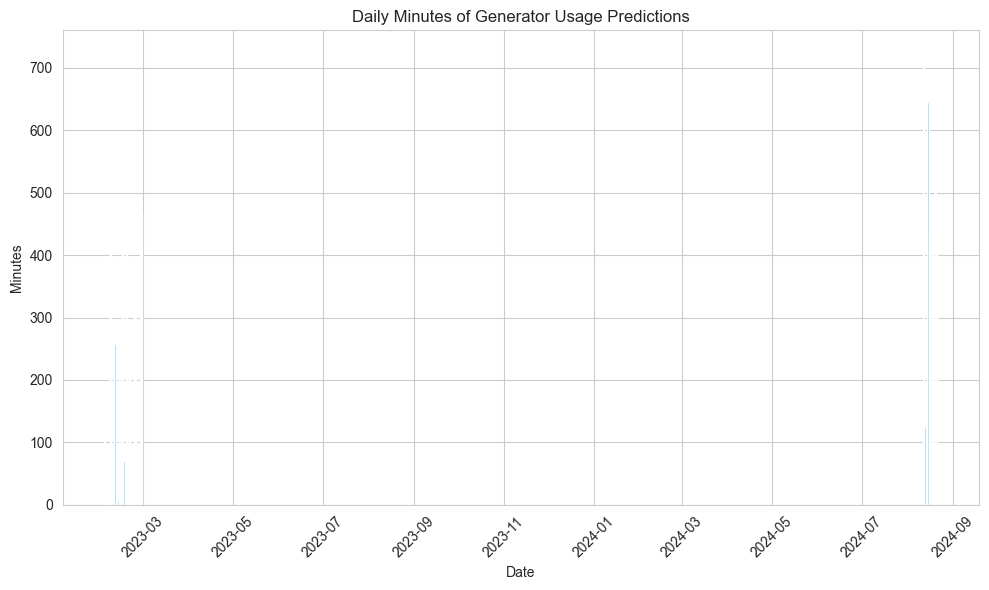

,Date,Count,Minutes,Hours
0,2023-02-03,76,152,2.533333
1,2023-02-06,5,10,0.166667
2,2023-02-07,228,456,7.600000
3,2023-02-08,2,4,0.066667
4,2023-02-09,1,2,0.033333
5,2023-02-10,129,258,4.300000
6,2023-02-12,4,8,0.133333
7,2023-02-13,149,298,4.966667
8,2023-02-15,210,420,7.000000
9,2023-02-16,35,70,1.166667


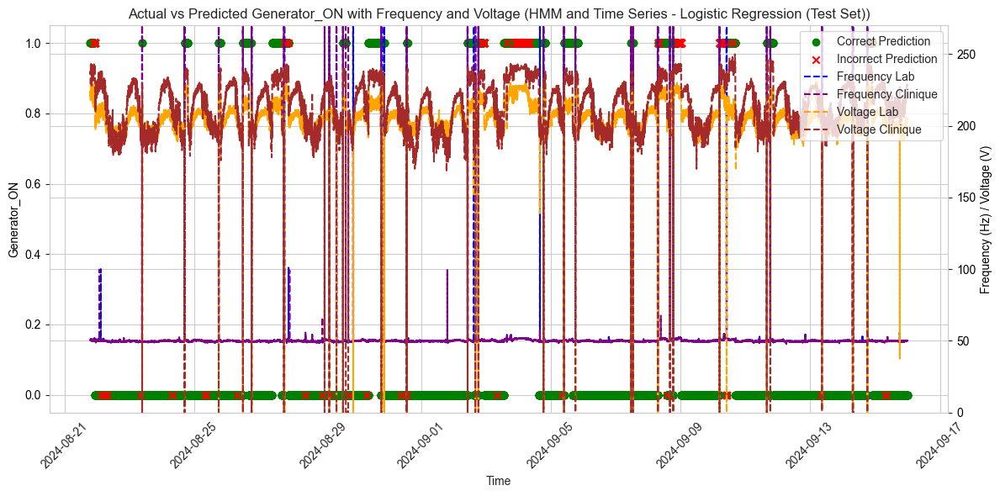

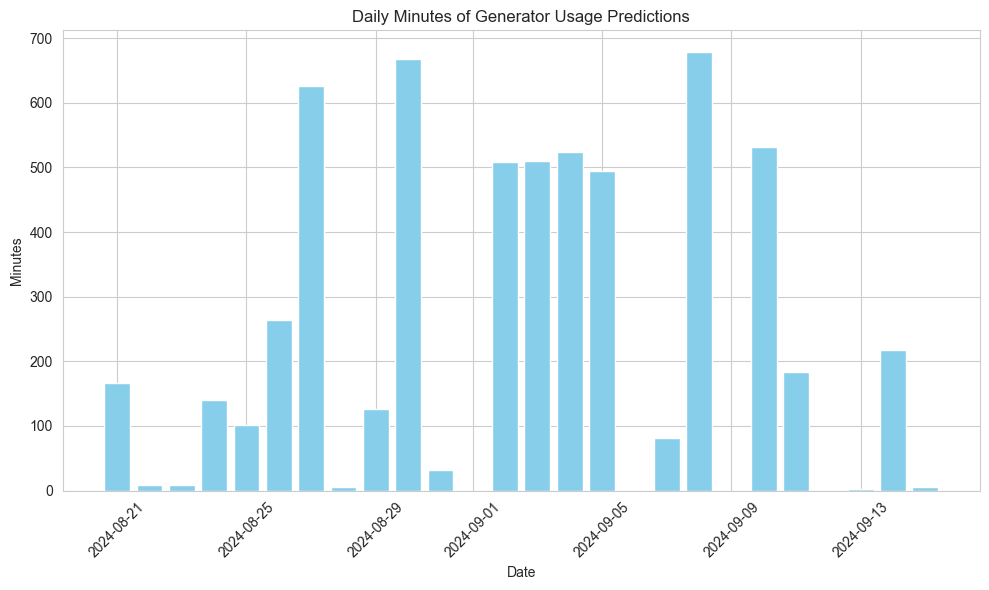

,Date,Count,Minutes,Hours
0,2024-08-21,83,166,2.766667
1,2024-08-22,4,8,0.133333
2,2024-08-23,4,8,0.133333
3,2024-08-24,70,140,2.333333
4,2024-08-25,51,102,1.700000
5,2024-08-26,132,264,4.400000
6,2024-08-27,313,626,10.433333
7,2024-08-28,3,6,0.100000
8,2024-08-29,63,126,2.100000
9,2024-08-30,334,668,11.133333


In [77]:
# For Logistic Regression Model with both voltage and frequency
plot_predictions_vs_actuals(train_data_mean_lg, model_name="HMM and Time Series - Logistic Regression (Train Set)",
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)
plot_predictions_vs_actuals(test_data_mean_lg, model_name="HMM and Time Series - Logistic Regression (Test Set)",
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False, include_frequency=False)

# For Logistic Regression Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_lg, model_name="HMM and Time Series - Logistic Regression (Train Set)",
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
train_data_ts_lg_daily_count = plot_true_predictions_histogram(train_data_ts_lg)
display(train_data_ts_lg_daily_count)
# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_ts_lg, model_name="HMM and Time Series - Logistic Regression (Test Set)",
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True, include_frequency=True)
test_data_ts_lg_daily_count = plot_true_predictions_histogram(test_data_ts_lg)
display(test_data_ts_lg_daily_count)


#### 4.3.2. Adding the Correlation functions (HMM)  - Random Forrest

Top 20 features sorted by importance:


,Feature,Importance
3,Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - cl...,0.361314
2,Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - la...,0.095807
65,HMM_State_Voltage 3E2F4FD3 (Ch Cbca Bethesda N...,0.064683
0,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - ...,0.057548
1,Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - ...,0.050289
70,HMM_State_Voltage C30F2E03 (Ch Cbca Bethesda N...,0.046262
6,higher_volt_lab,0.018359
31,Hour_11,0.018342
33,Hour_13,0.017595
34,Hour_14,0.016660


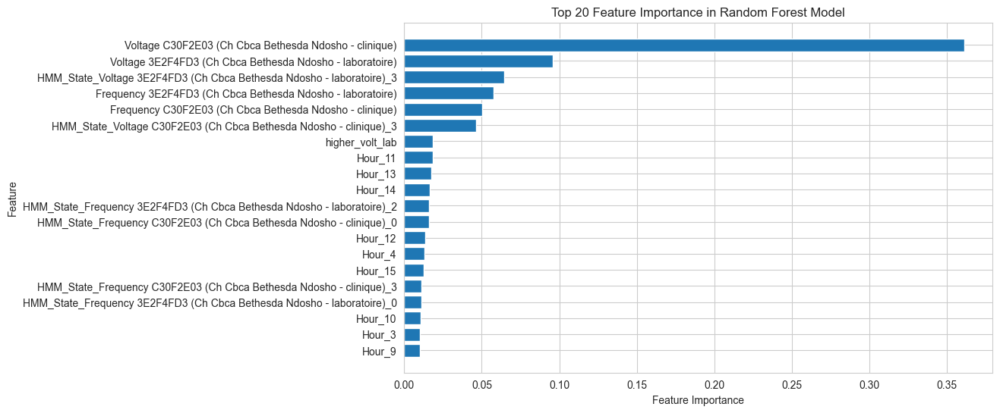

In [78]:
# Step 1: Create copies of the original data
train_data_ts_co_rf = train_data_ts_co.copy()
test_data_ts_co_rf = test_data_ts_co.copy()


# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_ts_co_rf[feature_columns]
y_train = train_data_ts_co_rf['Generator_ON']

X_test = test_data_ts_co_rf.reindex(columns=feature_columns, fill_value=0)
y_test = test_data_ts_co_rf['Generator_ON']

# Step 2: Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_ts_co_rf['prediction'] = clf.predict(X_train)
test_data_ts_co_rf['prediction'] = clf.predict(X_test)

# Step 4: Get the feature importances
importances = clf.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': importances
})

# Sort the features by importance and keep only the top 10
top_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(20)

# Display the top 15 most important features
print("Top 20 features sorted by importance:")
display(top_features)

# Visualize the top 15 feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance in Random Forest Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important on top
plt.show()

Evaluating the train and test set

Train Set Evaluation:
Accuracy: 1.0
Confusion Matrix:
[[23315     0]
 [    0  3901]]
Precision: 1.0
Recall: 1.0
Train data prediction distribution:
prediction
False    23315
True      3901
Name: count, dtype: int64
Test Set Evaluation:
Accuracy: 0.9868827160493827
Confusion Matrix:
[[14720     0]
 [  238  3186]]
Precision: 1.0
Recall: 0.9304906542056075
Test data prediction distribution:
prediction
False    14958
True      3186
Name: count, dtype: int64


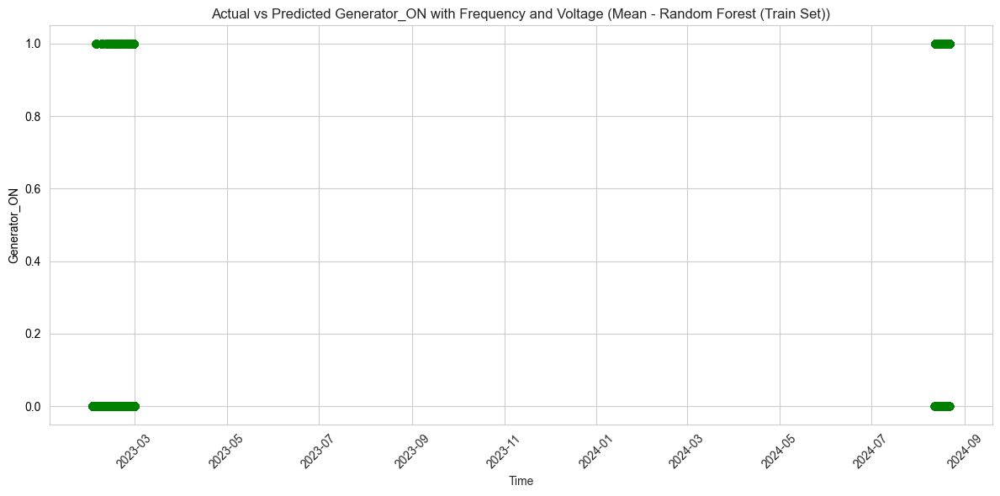

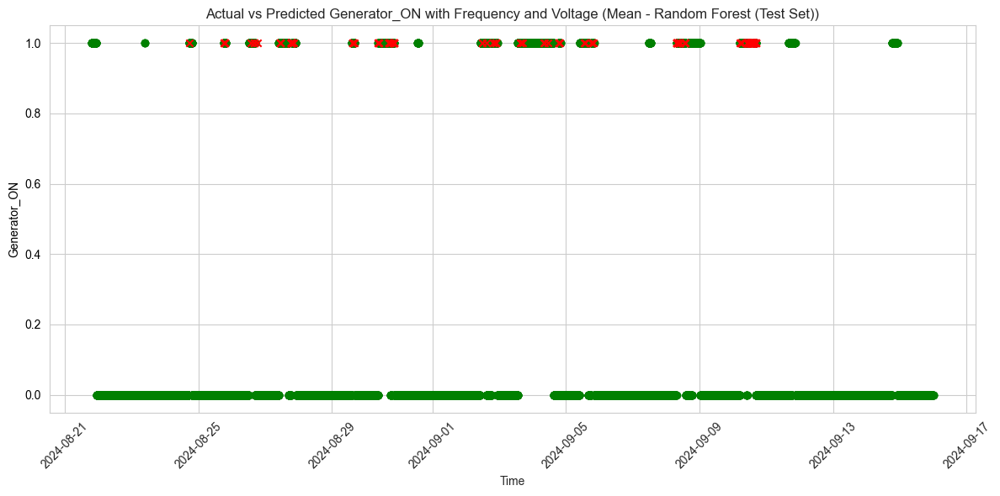

In [79]:
# Evaluate on the train set
print("Train Set Evaluation:")
evaluate_model_performance_rf(y_train, train_data_ts_co_rf['prediction'])

print("Train data prediction distribution:")
print(train_data_ts_co_rf['prediction'].value_counts())
# Evaluate on the test set
print("Test Set Evaluation:")
evaluate_model_performance_rf(y_test, test_data_ts_co_rf['prediction'])

print("Test data prediction distribution:")
print(test_data_ts_co_rf['prediction'].value_counts())

# For Random Forest Model with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_co_rf, model_name="Mean - Random Forest (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False,
                            include_frequency=False)
plot_predictions_vs_actuals(test_data_ts_co_rf, model_name="Mean - Random Forest (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=False,
                            include_frequency=False)

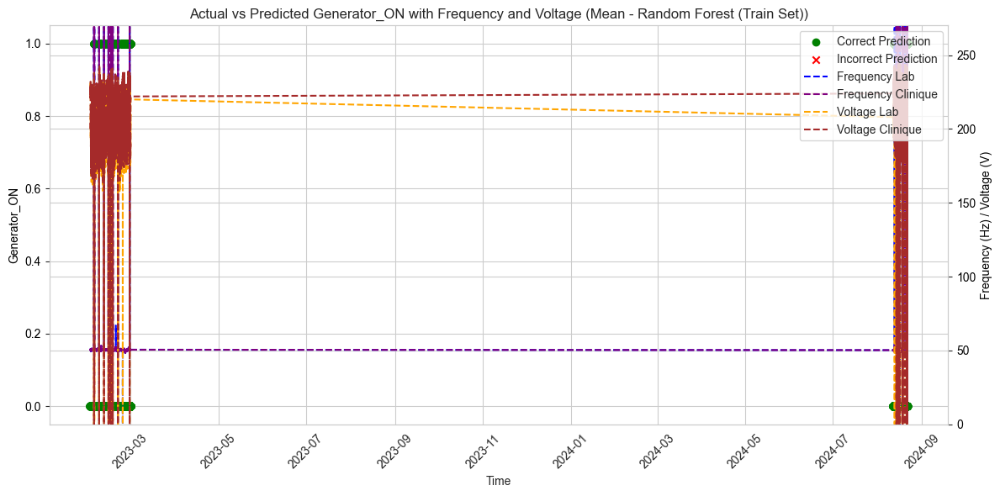

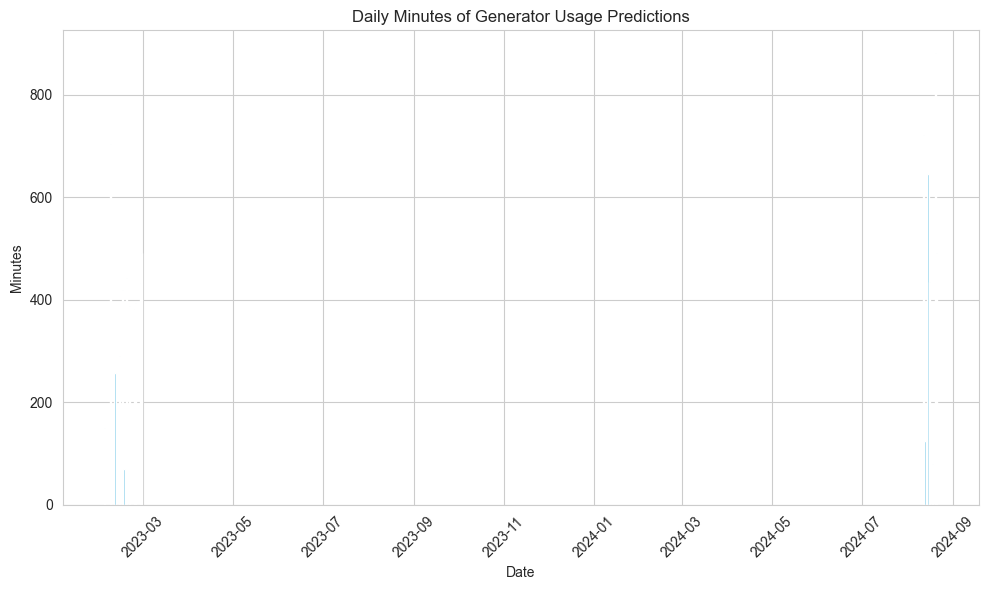

,Date,Count,Minutes,Hours
0,2023-02-03,75,150,2.500000
1,2023-02-07,352,704,11.733333
2,2023-02-10,129,258,4.300000
3,2023-02-13,145,290,4.833333
4,2023-02-15,210,420,7.000000
5,2023-02-16,35,70,1.166667
6,2023-02-18,221,442,7.366667
7,2023-02-20,194,388,6.466667
8,2023-02-23,191,382,6.366667
9,2023-02-24,197,394,6.566667


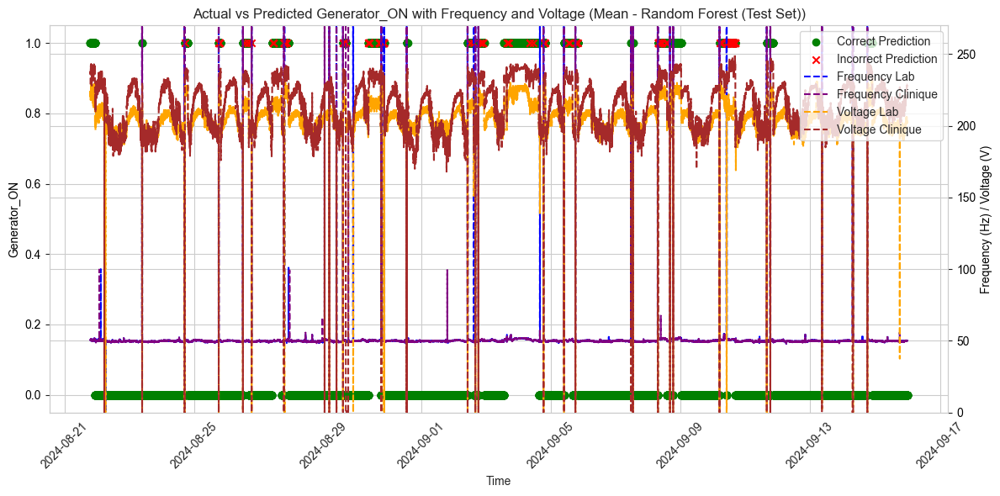

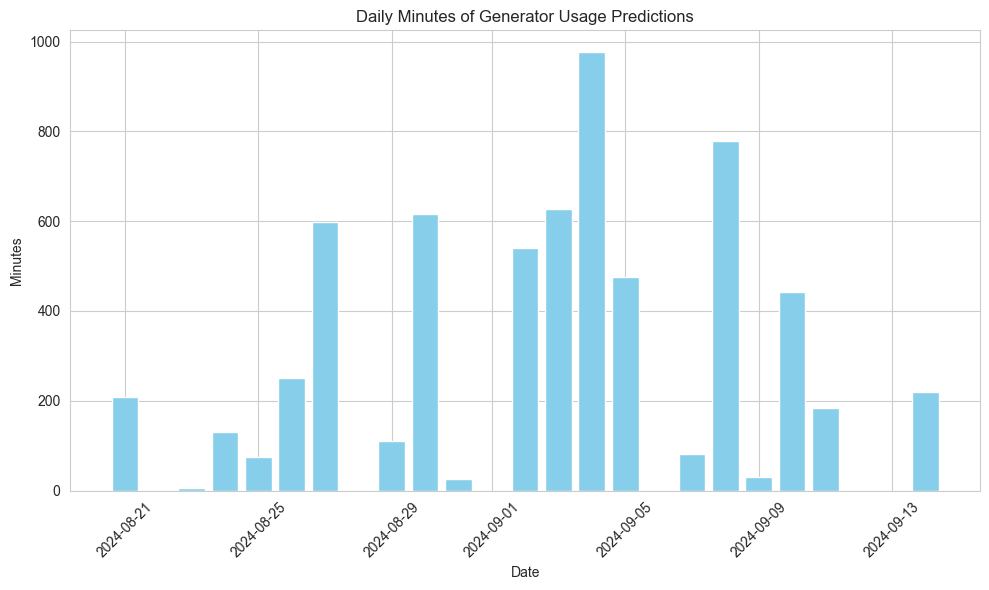

,Date,Count,Minutes,Hours
0,2024-08-21,104,208,3.466667
1,2024-08-23,3,6,0.100000
2,2024-08-24,65,130,2.166667
3,2024-08-25,37,74,1.233333
4,2024-08-26,125,250,4.166667
5,2024-08-27,299,598,9.966667
6,2024-08-29,55,110,1.833333
7,2024-08-30,308,616,10.266667
8,2024-08-31,13,26,0.433333
9,2024-09-02,270,540,9.000000


##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 3186 minutes, or 53.10 hours within 302.40 hours


In [80]:
# For Random Forest Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_co_rf, model_name="Mean - Random Forest (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True,
                            include_frequency=True)
train_data_ts_co_rf_daily_count = plot_true_predictions_histogram(train_data_ts_co_rf)
display(train_data_ts_co_rf_daily_count)

# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_ts_co_rf, model_name="Mean - Random Forest (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True,
                            include_frequency=True)
test_data_ts_co_rf_daily_count = plot_true_predictions_histogram(test_data_ts_co_rf)
display(test_data_ts_co_rf_daily_count)
train_data_ts_co_rf['Generator_ON'].dtype

print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_ts_co_rf)
display_generator_statistics(test_data_ts_co_rf)

#### 4.3.3. Adding the Correlation functions (HMM) - XGBoost

In [81]:
# Step 0: Copy rf data
train_data_ts_co_boost = train_data_ts_co.copy()
test_data_ts_co_boost = test_data_ts_co.copy()

# Step 1: Use the same data and feature columns (with copy to avoid SettingWithCopyWarning)
X_train = train_data_ts_co_boost[feature_columns].copy()
y_train = train_data_ts_co_boost['Generator_ON']

X_test = test_data_ts_co_boost.reindex(columns=feature_columns, fill_value=0).copy()
y_test = test_data_ts_co_boost['Generator_ON']

# Convert specific columns to numeric
cols_to_convert = [
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

X_train[cols_to_convert] = X_train[cols_to_convert].apply(pd.to_numeric, errors='coerce')
X_test[cols_to_convert] = X_test[cols_to_convert].apply(pd.to_numeric, errors='coerce')

#### This section is for XGBoost parameter search using cross validation

In [82]:
'''
# Step 2: Train an XGBoost Classifier
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 300, 500],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 10, 100]
}

grid_search = GridSearchCV(
    estimator=XGBClassifier(random_state=42),
    param_grid=param_grid,
    scoring='roc_auc',  # Adjust based on your metric
    cv=3,               # Cross-validation splits
    verbose=2
)

grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)


# Step 3: Make Predictions on the train and test sets
train_data_ts_co_boost['prediction'] = xgb_clf.predict(X_train)
test_data_ts_co_boost['prediction'] = xgb_clf.predict(X_test)

# Step 4: Evaluate Feature Importances
importances = xgb_clf.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': importances
})

# Sort the features by importance and keep only the top 20
top_20_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(20)

# Display the top 20 most important features
print("Top 20 features sorted by importance (XGBoost):")
display(top_20_features)

# Visualize the top 20 feature importances
plt.figure(figsize=(10, 6))
plt.barh(top_20_features['Feature'], top_20_features['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance in XGBoost Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important on top
plt.show()
'''

'\n# Step 2: Train an XGBoost Classifier\nparam_grid = {\n    \'max_depth\': [3, 5, 7],\n    \'learning_rate\': [0.01, 0.1, 0.2],\n    \'n_estimators\': [100, 300, 500],\n    \'subsample\': [0.6, 0.8, 1.0],\n    \'colsample_bytree\': [0.6, 0.8, 1.0],\n    \'gamma\': [0, 1, 5],\n    \'reg_alpha\': [0, 0.1, 1],\n    \'reg_lambda\': [1, 10, 100]\n}\n\ngrid_search = GridSearchCV(\n    estimator=XGBClassifier(random_state=42),\n    param_grid=param_grid,\n    scoring=\'roc_auc\',  # Adjust based on your metric\n    cv=3,               # Cross-validation splits\n    verbose=2\n)\n\ngrid_search.fit(X_train, y_train)\n\nprint("Best parameters:", grid_search.best_params_)\n\n\n# Step 3: Make Predictions on the train and test sets\ntrain_data_ts_co_boost[\'prediction\'] = xgb_clf.predict(X_train)\ntest_data_ts_co_boost[\'prediction\'] = xgb_clf.predict(X_test)\n\n# Step 4: Evaluate Feature Importances\nimportances = xgb_clf.feature_importances_\n\n# Create a DataFrame for better visualization\nf

In [83]:
# Use the best parameters from GridSearchCV - Saved so no need to re run the parameters. Only re run if we have additional features or different training data 

best_params = {
    'colsample_bytree': 0.6,
    'gamma': 0,
    'learning_rate': 0.1,
    'max_depth': 3,
    'n_estimators': 300,
    'reg_alpha': 0,
    'reg_lambda': 1,
    'subsample': 1.0
}


# Initialize the model with the best parameters
final_model = XGBClassifier(
    random_state=42,
    **best_params
)

# Fit the model on the entire training data
final_model.fit(X_train, y_train)

# Make predictions on the test set
train_data_ts_co_boost['prediction'] = final_model.predict(X_train)
test_data_ts_co_boost['prediction'] = final_model.predict(X_test)

# Evaluate the model on the test set
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix

# Classification report
print("Classification Report:")
print(classification_report(y_test, test_data_ts_co_boost['prediction']))

# AUC-ROC score
print("AUC-ROC Score:")
y_test_proba = final_model.predict_proba(X_test)[:, 1]
print(roc_auc_score(y_test, y_test_proba))

# Confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, test_data_ts_co_boost['prediction']))

# Step 5: Evaluate Model Performance
# Evaluate on the train set
print("Train Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_train, train_data_ts_co_boost['prediction'])

print("Train data prediction distribution (XGBoost):")
print(train_data_ts_co_boost['prediction'].value_counts())
# Evaluate on the test set
print("\nTest Set Evaluation (XGBoost):")
evaluate_model_performance_rf(y_test, test_data_ts_co_boost['prediction'])

print("Test data prediction distribution (XGBoost):")
print(test_data_ts_co_boost['prediction'].value_counts())

Classification Report:
              precision    recall  f1-score   support

       False       0.99      1.00      1.00     14720
        True       1.00      0.96      0.98      3424

    accuracy                           0.99     18144
   macro avg       1.00      0.98      0.99     18144
weighted avg       0.99      0.99      0.99     18144

AUC-ROC Score:
0.9998257187119057
Confusion Matrix:
[[14718     2]
 [  138  3286]]
Train Set Evaluation (XGBoost):
Accuracy: 0.9975014697236919
Confusion Matrix:
[[23265    50]
 [   18  3883]]
Precision: 0.9872870582252733
Recall: 0.9953857985132017
Train data prediction distribution (XGBoost):
prediction
0    23283
1     3933
Name: count, dtype: int64

Test Set Evaluation (XGBoost):
Accuracy: 0.9922839506172839
Confusion Matrix:
[[14718     2]
 [  138  3286]]
Precision: 0.9993917274939172
Recall: 0.959696261682243
Test data prediction distribution (XGBoost):
prediction
0    14856
1     3288
Name: count, dtype: int64


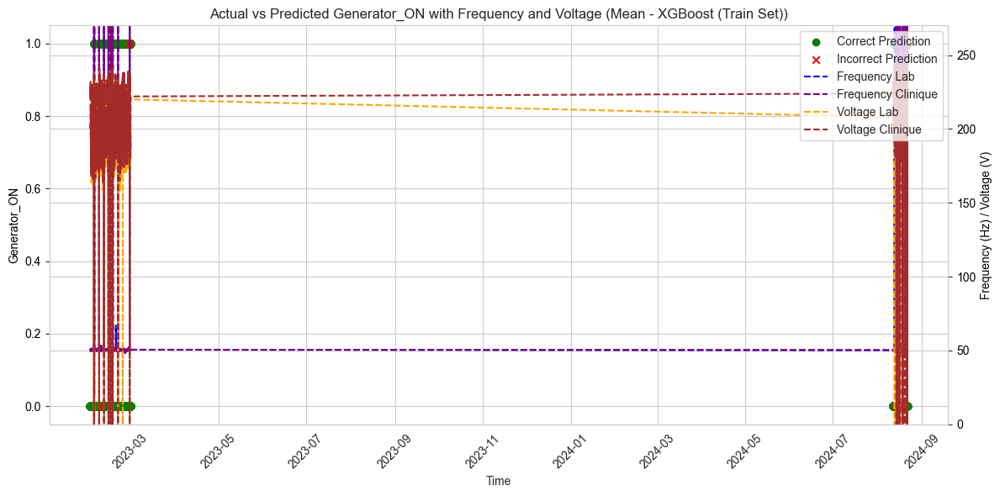

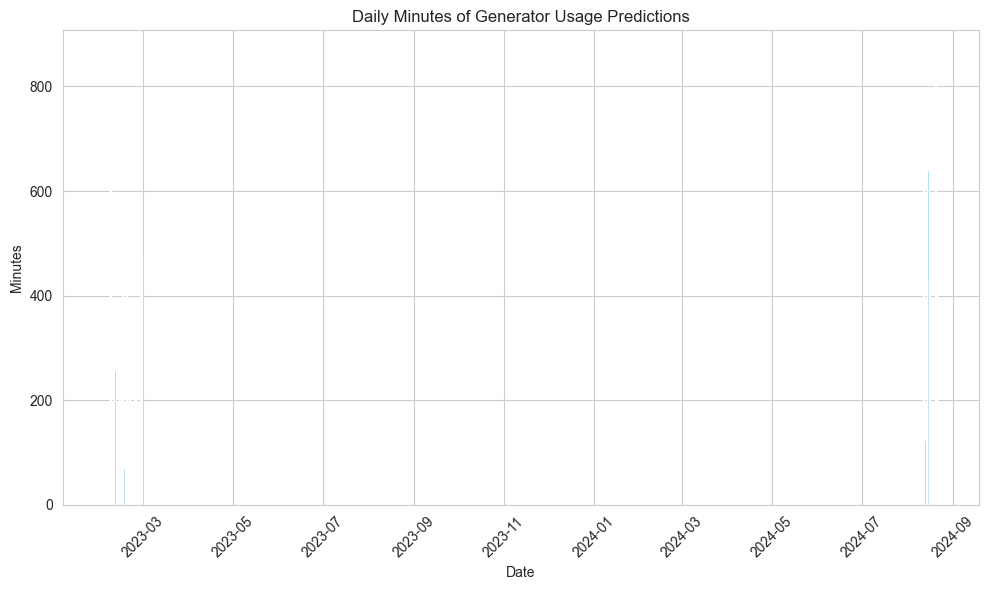

,Date,Count,Minutes,Hours
0,2023-02-03,75,150,2.500000
1,2023-02-07,352,704,11.733333
2,2023-02-08,1,2,0.033333
3,2023-02-10,129,258,4.300000
4,2023-02-13,145,290,4.833333
5,2023-02-15,210,420,7.000000
6,2023-02-16,35,70,1.166667
7,2023-02-18,221,442,7.366667
8,2023-02-20,194,388,6.466667
9,2023-02-23,191,382,6.366667


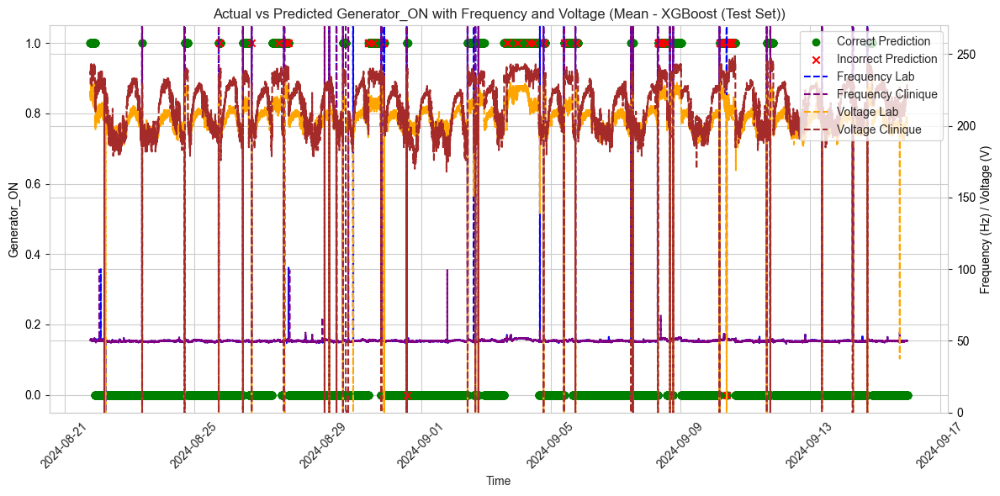

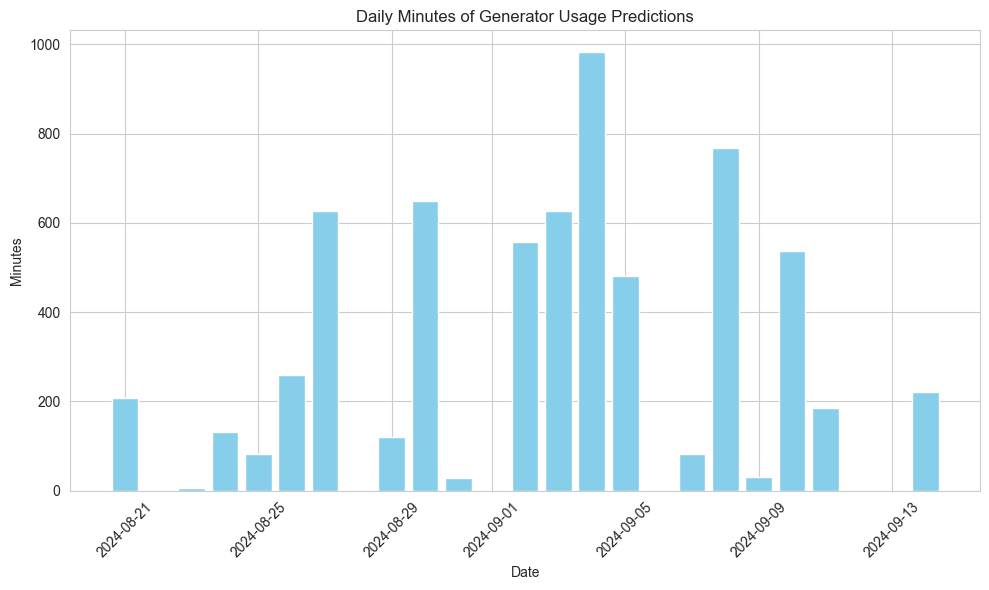

,Date,Count,Minutes,Hours
0,2024-08-21,104,208,3.466667
1,2024-08-23,3,6,0.100000
2,2024-08-24,66,132,2.200000
3,2024-08-25,41,82,1.366667
4,2024-08-26,130,260,4.333333
5,2024-08-27,313,626,10.433333
6,2024-08-29,60,120,2.000000
7,2024-08-30,324,648,10.800000
8,2024-08-31,14,28,0.466667
9,2024-09-02,279,558,9.300000


In [84]:
# For Boosting Model
# Train data with both voltage and frequency
plot_predictions_vs_actuals(train_data_ts_co_boost, model_name="Mean - XGBoost (Train Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True,
                            include_frequency=True)
train_data_ts_co_boost_daily_count = plot_true_predictions_histogram(train_data_ts_co_boost)
display(train_data_ts_co_boost_daily_count)

# Test data with both voltage and frequency
plot_predictions_vs_actuals(test_data_ts_co_boost, model_name="Mean - XGBoost (Test Set)",   
                            freq_lab_column= freq_a,
                            freq_clinique_column= freq_b,
                            volt_lab_column= volt_a,
                            volt_clinique_column=volt_b,
                            include_voltage=True,
                            include_frequency=True)
test_data_ts_co_boost_daily_count = plot_true_predictions_histogram(test_data_ts_co_boost)
display(test_data_ts_co_boost_daily_count)

In [85]:
print(f'##### PREDICTION RESULT #####')
display_generator_statistics(train_data_ts_co_boost)
display_generator_statistics(test_data_ts_co_boost)

##### PREDICTION RESULT #####
Actual Minutes: 3901 minutes, or 65.02 hours within 453.60 hours
Predicted Minutes: 3933 minutes, or 65.55 hours within 453.60 hours
Actual Minutes: 3424 minutes, or 57.07 hours within 302.40 hours
Predicted Minutes: 3288 minutes, or 54.80 hours within 302.40 hours


## 5. Applying the Model with Other Data

Top 15 features sorted by importance:


,Feature,Importance
3,Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - cl...,0.401433
2,Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - la...,0.143232
0,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - ...,0.080122
1,Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - ...,0.069076
6,higher_volt_lab,0.046430
7,higher_volt_clinique,0.032406
34,Hour_14,0.016796
31,Hour_11,0.016531
24,Hour_4,0.016030
33,Hour_13,0.015766


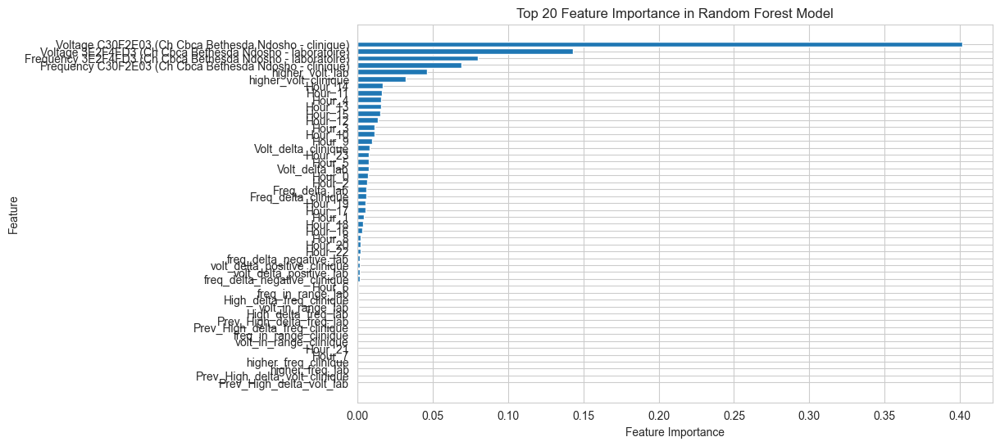

In [86]:
# Final Model use for prediction

# Step 1: Create copies of the original data
train_data_ts_rf = train_data_ts.copy()
test_data_ts_rf = test_data_ts.copy()

# Taking the mean of the dataframe (using the previous function)
train_data_ts_rf, test_data_ts_rf = calculate_mean_flags(train_data_ts_rf, test_data_ts_rf, train_data_base, columns_to_compare)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

# Use the selected feature columns to predict 'Generator_ON'
X_train = train_data_ts_rf[feature_columns]
y_train = train_data_ts_rf['Generator_ON']

X_test = test_data_ts_rf[feature_columns]
y_test = test_data_ts_rf['Generator_ON']

# Step 2: Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 3: Make Predictions on the train and test sets
train_data_ts_rf['prediction'] = clf.predict(X_train)
test_data_ts_rf['prediction'] = clf.predict(X_test)

# Step 4: Get the feature importances
importances = clf.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': importances
})

# Sort the features by importance and keep only the top 10
top_15_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(50)

# Display the top 15 most important features
print("Top 15 features sorted by importance:")
display(top_15_features)

# Visualize the top 15 feature importances
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.barh(top_15_features['Feature'], top_15_features['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance in Random Forest Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important on top
plt.show()

#### 5.1. Using 1 Month Data and Check the Prediction Result

In [92]:
# Opening files
file_list = ['Voltage Time Series-data-2024-10-25 13_13_06.csv',  
             'Voltage Time Series-data-2024-10-25 13_13_40.csv', 
             'Voltage Time Series-data-2024-10-25 13_14_12.csv',
             'Voltage Time Series-data-2024-10-25 13_14_37.csv',
             'Voltage Time Series-data-2024-10-25 13_18_07.csv']

# Initialize an empty list to collect DataFrames
data_frames_2 = []

file_path_2 = '../../data/0. ChCbNdosho/New 2/'

for file in file_list:
    # Read each file into a DataFrame and append to the list
    monthly_data = pd.read_csv(file_path_2 + file)
    data_frames_2.append(monthly_data)

# Concatenate all DataFrames in the list at once
data = pd.concat(data_frames_2, ignore_index=True)

# Display the final concatenated DataFrame
display(data)

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique)
0,2024-09-10 00:00:00,50.1,50.0,207.0,223.0
1,2024-09-10 00:02:00,49.8,49.8,203.0,221.0
2,2024-09-10 00:04:00,49.7,49.7,202.0,221.0
3,2024-09-10 00:06:00,49.8,49.8,204.0,221.0
4,2024-09-10 00:08:00,49.9,50.0,204.0,222.0
...,...,...,...,...,...
25195,2024-10-14 23:50:00,50.1,50.0,210.0,206.0
25196,2024-10-14 23:52:00,49.6,49.6,209.0,205.0
25197,2024-10-14 23:54:00,49.8,49.8,209.0,207.0
25198,2024-10-14 23:56:00,49.9,49.9,210.0,208.0


In [93]:
# Step 1: Generate Features

## FEATURE GENERATION
# Taking the mean of the dataframe (using the previous function)
test_data_2, test_data_2_dummy = calculate_mean_flags(data, data, train_data_base, columns_to_compare)

# Assuming train_data_ts and test_data_ts are your DataFrames
test_data_2, test_data_2_dummy = process_time_series_data(test_data_2, test_data_2, 
                                                        freq_lab_column= freq_a,
                                                        freq_clinique_column= freq_b,
                                                        volt_lab_column= volt_a,
                                                        volt_clinique_column= volt_b,
                                                        high_freq_threshold = high_freq_threshold,
                                                        low_freq_threshold = low_freq_threshold, 
                                                        high_volt_threshold = high_volt_threshold, 
                                                        low_volt_threshold = low_volt_threshold)

# Display Processed data:
print('Processed data after feature generation: ')
display(test_data_2)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

X_test = test_data_2[feature_columns]

# Step 2: Make Predictions on the train and test sets
test_data_2['prediction'] = clf.predict(X_test)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = test_data_2['prediction'].sum()

# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(test_data_2) / 30

# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

Processed data after feature generation: 


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,Freq_delta_lab,...,Hour_22,Hour_23,High_delta_freq_lab,High_delta_freq_clinique,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique
0,2024-09-10 00:00:00,50.1,50.0,207.0,223.0,False,False,True,True,NaN,...,False,False,False,False,False,False,NaN,NaN,NaN,NaN
1,2024-09-10 00:02:00,49.8,49.8,203.0,221.0,False,False,False,True,-0.3,...,False,False,False,False,False,False,False,False,False,False
2,2024-09-10 00:04:00,49.7,49.7,202.0,221.0,False,False,False,True,-0.1,...,False,False,False,False,False,False,False,False,False,False
3,2024-09-10 00:06:00,49.8,49.8,204.0,221.0,False,False,False,True,0.1,...,False,False,False,False,False,False,False,False,False,False
4,2024-09-10 00:08:00,49.9,50.0,204.0,222.0,False,False,False,True,0.1,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25195,2024-10-14 23:50:00,50.1,50.0,210.0,206.0,False,False,True,False,0.1,...,False,True,False,False,False,False,False,False,False,False
25196,2024-10-14 23:52:00,49.6,49.6,209.0,205.0,False,False,True,False,-0.5,...,False,True,False,False,False,False,False,False,False,False
25197,2024-10-14 23:54:00,49.8,49.8,209.0,207.0,False,False,True,False,0.2,...,False,True,False,False,False,False,False,False,False,False
25198,2024-10-14 23:56:00,49.9,49.9,210.0,208.0,False,False,True,False,0.1,...,False,True,False,False,False,False,False,False,False,False


##### PREDICTION RESULT #####
Predicted Minutes: 18696 minutes, or 311.60 hours within 840.00 hours


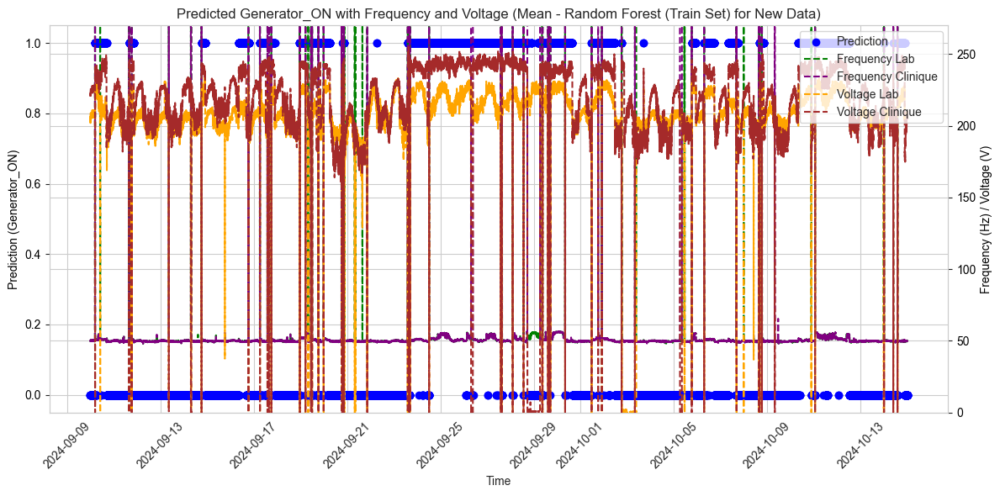

In [94]:
# For Random Forest Model
# Test data with both voltage and frequency
plot_predictions(test_data_2, model_name="Mean - Random Forest (Train Set) for New Data", include_voltage=True, include_frequency=True)

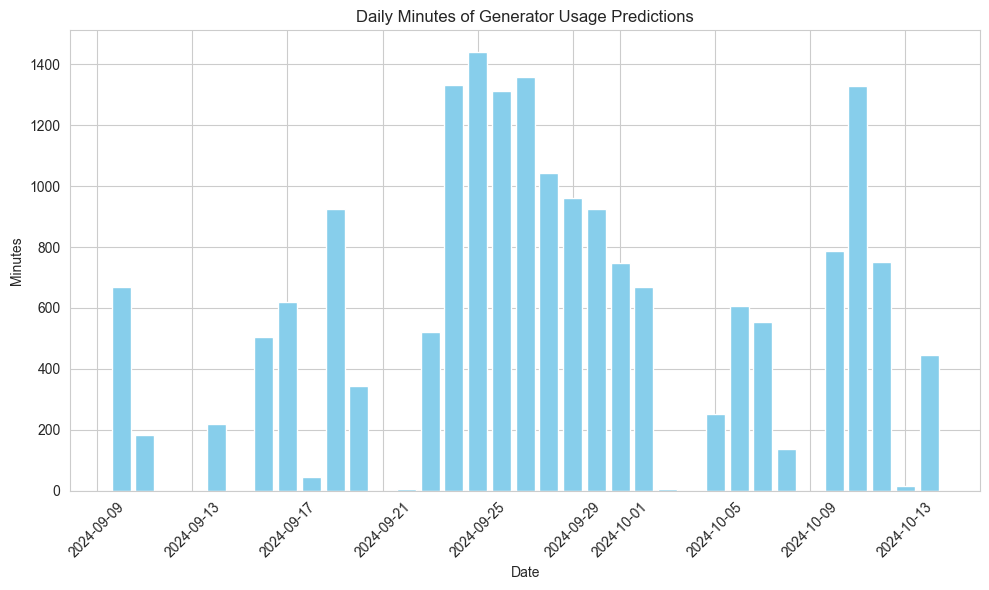

,Date,Count,Minutes,Hours
0,2024-09-10,335,670,11.166667
1,2024-09-11,92,184,3.066667
2,2024-09-14,110,220,3.666667
3,2024-09-16,252,504,8.400000
4,2024-09-17,309,618,10.300000
5,2024-09-18,22,44,0.733333
6,2024-09-19,462,924,15.400000
7,2024-09-20,171,342,5.700000
8,2024-09-22,2,4,0.066667
9,2024-09-23,261,522,8.700000


In [95]:
test_data_2_daily_count = plot_true_predictions_histogram(test_data_2)
test_data_2_daily_count

#### 5.2. Using 1 Year Data of Year 2023

Loading 1 year data into 1 dataframe:

In [96]:
# Set the path to the folder containing CSV files
folder_path = '../../data/0. ChCbNdosho/2023 Data/'

# Use glob to get all CSV file paths in the folder
csv_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Initialize an empty list to store each DataFrame
dfs = []

# Loop through the file paths and read each CSV into a DataFrame
for file in csv_files:
    df = pd.read_csv(file)
    dfs.append(df)

# Concatenate all DataFrames into one
data_2023 = pd.concat(dfs, ignore_index=True)

# Ensure the 'time' column is in datetime format
data_2023['time'] = pd.to_datetime(data_2023['Time'], format='%Y-%m-%d %H:%M:%S')

# Sort the DataFrame by the 'time' column
data_2023 = data_2023.sort_values(by='time').reset_index(drop=True)

# Display the first few rows to verify
data_2023

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),time
0,2023-01-01 00:00:00,50.3,50.3,198.0,199.0,2023-01-01 00:00:00
1,2023-01-01 00:02:00,50.2,50.2,200.0,202.0,2023-01-01 00:02:00
2,2023-01-01 00:04:00,50.0,50.0,202.0,204.0,2023-01-01 00:04:00
3,2023-01-01 00:06:00,50.3,50.3,203.0,204.0,2023-01-01 00:06:00
4,2023-01-01 00:08:00,50.1,50.1,202.0,204.0,2023-01-01 00:08:00
...,...,...,...,...,...,...
267835,2023-12-31 23:50:00,49.9,49.9,202.0,209.0,2023-12-31 23:50:00
267836,2023-12-31 23:52:00,49.9,49.8,202.0,209.0,2023-12-31 23:52:00
267837,2023-12-31 23:54:00,50.0,50.0,202.0,210.0,2023-12-31 23:54:00
267838,2023-12-31 23:56:00,50.1,50.1,202.0,210.0,2023-12-31 23:56:00


In [97]:
# Step 1: Generate Features

## FEATURE GENERATION
# Taking the mean of the dataframe (using the previous function)
test_data_2023, test_data_2023_dummy = calculate_mean_flags(data_2023, data_2023, train_data_base, columns_to_compare)

# Assuming train_data_ts and test_data_ts are your DataFrames
test_data_2023, test_data_2023_dummy = process_time_series_data(test_data_2023, test_data_2023, 
                                                        freq_lab_column= freq_a,
                                                        freq_clinique_column= freq_b,
                                                        volt_lab_column= volt_a,
                                                        volt_clinique_column= volt_b,
                                                        high_freq_threshold = high_freq_threshold,
                                                        low_freq_threshold = low_freq_threshold, 
                                                        high_volt_threshold = high_volt_threshold, 
                                                        low_volt_threshold = low_volt_threshold)

# Display Processed data:
print('Processed data after feature generation: ')
display(test_data_2023)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

X_test = test_data_2023[feature_columns]

# Step 2: Make Predictions on the train and test sets
test_data_2023['prediction'] = clf.predict(X_test)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = test_data_2023['prediction'].sum()

# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(test_data_2023) / 30

# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

Processed data after feature generation: 


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),time,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,Hour_22,Hour_23,High_delta_freq_lab,High_delta_freq_clinique,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique
0,2023-01-01 00:00:00,50.3,50.3,198.0,199.0,2023-01-01 00:00:00,False,False,False,False,...,False,False,False,False,False,False,NaN,NaN,NaN,NaN
1,2023-01-01 00:02:00,50.2,50.2,200.0,202.0,2023-01-01 00:02:00,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2023-01-01 00:04:00,50.0,50.0,202.0,204.0,2023-01-01 00:04:00,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,2023-01-01 00:06:00,50.3,50.3,203.0,204.0,2023-01-01 00:06:00,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,2023-01-01 00:08:00,50.1,50.1,202.0,204.0,2023-01-01 00:08:00,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267835,2023-12-31 23:50:00,49.9,49.9,202.0,209.0,2023-12-31 23:50:00,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
267836,2023-12-31 23:52:00,49.9,49.8,202.0,209.0,2023-12-31 23:52:00,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
267837,2023-12-31 23:54:00,50.0,50.0,202.0,210.0,2023-12-31 23:54:00,False,False,False,True,...,False,True,False,False,False,False,False,False,False,False
267838,2023-12-31 23:56:00,50.1,50.1,202.0,210.0,2023-12-31 23:56:00,False,False,False,True,...,False,True,False,False,False,False,False,False,False,False


##### PREDICTION RESULT #####
Predicted Minutes: 112630 minutes, or 1877.17 hours within 8928.00 hours


##### 5.2.1. Plot Result During Lost Clinique Data (2023)

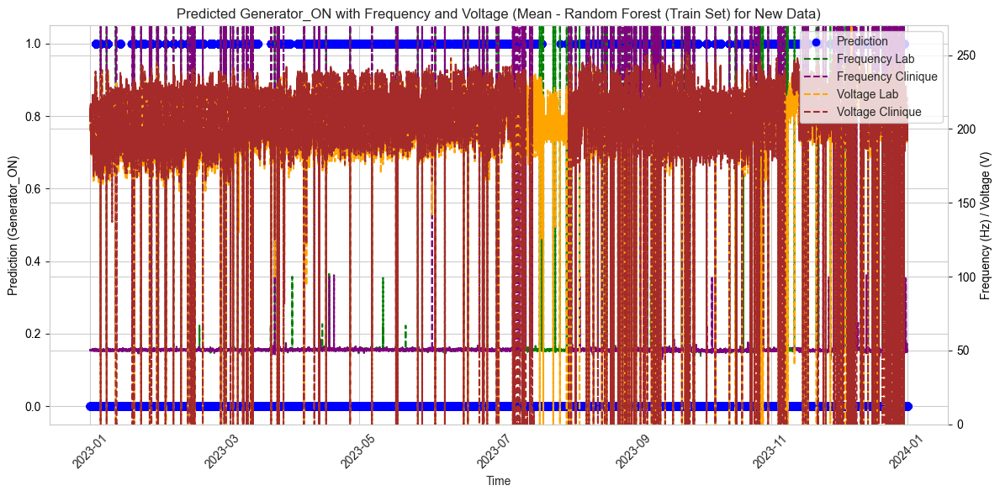

In [98]:
# For Random Forest Model
# Test data with both voltage and frequency
plot_predictions(test_data_2023, model_name="Mean - Random Forest (Train Set) for New Data", include_voltage=True, include_frequency=True)

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


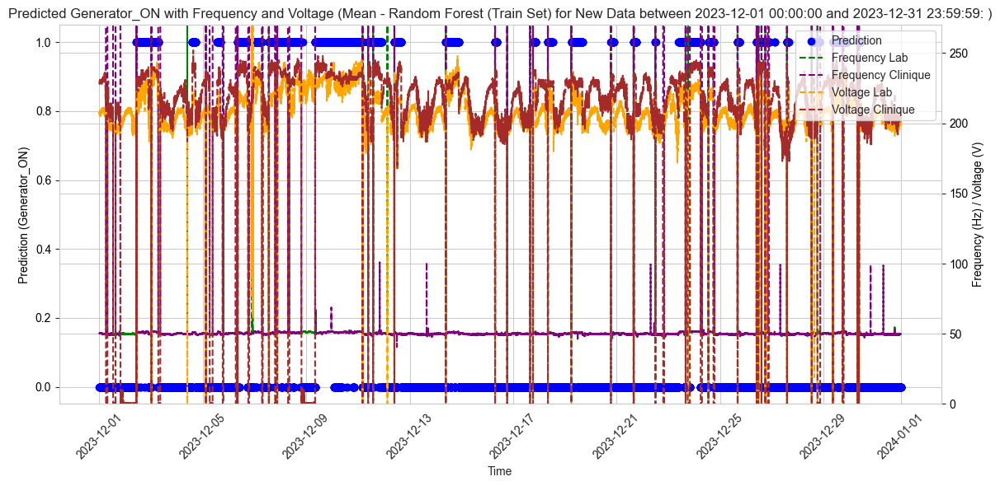

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


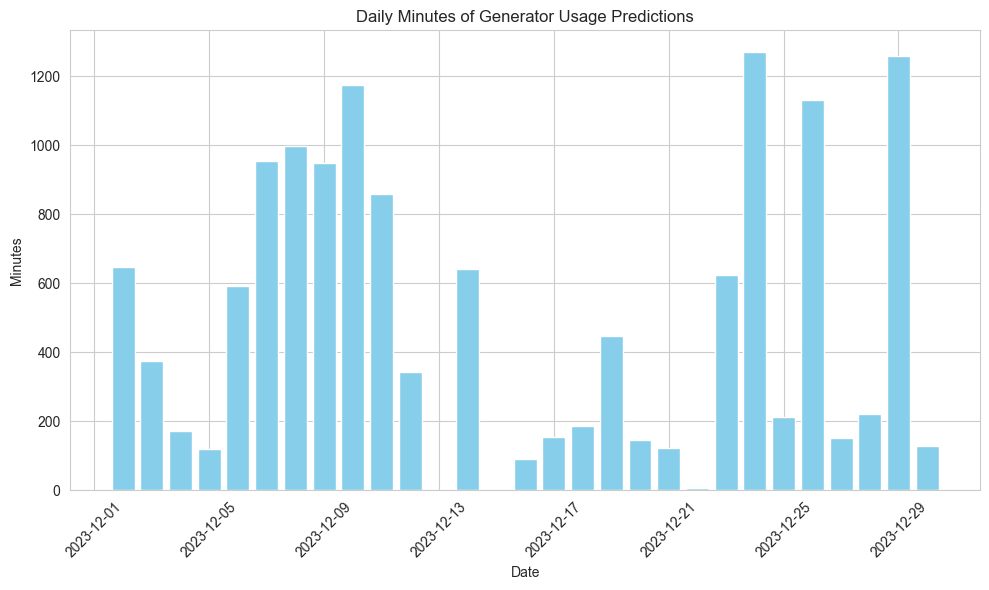

,Date,Count,Minutes,Hours
0,2023-12-02,324,648,10.800000
1,2023-12-03,187,374,6.233333
2,2023-12-04,86,172,2.866667
3,2023-12-05,60,120,2.000000
4,2023-12-06,297,594,9.900000
5,2023-12-07,477,954,15.900000
6,2023-12-08,499,998,16.633333
7,2023-12-09,474,948,15.800000
8,2023-12-10,587,1174,19.566667
9,2023-12-11,429,858,14.300000


##### PREDICTION RESULT #####
Predicted Minutes: 13988 minutes, or 233.13 hours within 912.00 hours
Average Daily Usage Minutes: 518.074074074074 minutes, or 8.634567901234567 hours
Max minutes of usage 1270 minutes or 21.166666666666668 hours. Date: 2023-12-24


In [99]:
# Plot predictions based on certain timing choosen

start_date = '2023-12-01 00:00:00'
finished_date = '2023-12-31 23:59:59'
filtered_test_data_2023 = test_data_2023[(test_data_2023['Time'] >= start_date) & (test_data_2023['Time'] <= finished_date)]


# Plot based on the filtered time:
plot_predictions(
    filtered_test_data_2023,
    model_name=f"Mean - Random Forest (Train Set) for New Data between {start_date} and {finished_date}: ",
    include_voltage=True,
    include_frequency=True
)


# Plot histogram for each minutes generator usage daily
filtered_test_data_2_daily_count = plot_true_predictions_histogram(filtered_test_data_2023)
display(filtered_test_data_2_daily_count)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = filtered_test_data_2023['prediction'].sum()


# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(filtered_test_data_2023) / 30
average_daily = filtered_test_data_2_daily_count['Minutes'].sum() / filtered_test_data_2_daily_count.shape[0] 
max_daily = filtered_test_data_2_daily_count['Minutes'].max()
# Find the row with the maximum 'Minutes' value
max_daily_row = filtered_test_data_2_daily_count.loc[filtered_test_data_2_daily_count['Minutes'].idxmax()]
# Extract the 'Date' column from that row
max_date = max_daily_row['Date']


# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')
print(f'Average Daily Usage Minutes: {average_daily} minutes, or {average_daily / 60} hours')
print(f'Max minutes of usage {max_daily} minutes or {max_daily / 60} hours. Date: {max_date}')

##### 5.2.2. Plot Result First 10 days of July (2023)

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


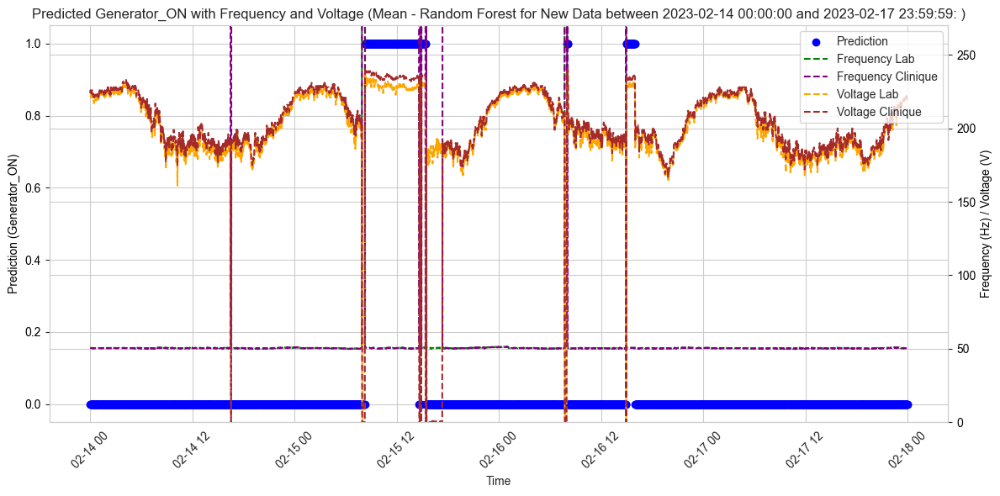

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


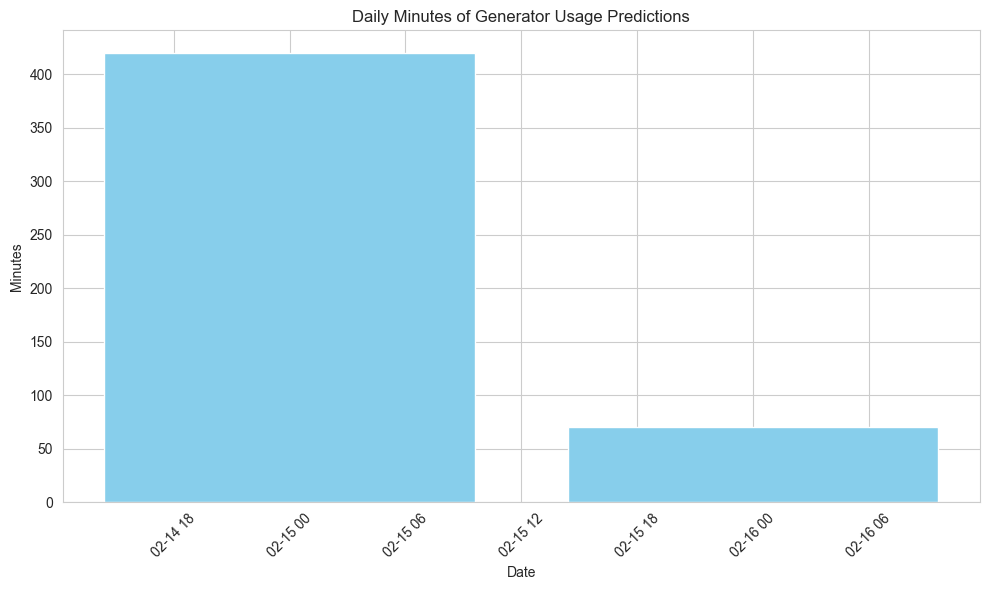

,Date,Count,Minutes,Hours
0,2023-02-15,210,420,7.000000
1,2023-02-16,35,70,1.166667


##### PREDICTION RESULT #####
Predicted Minutes: 490 minutes, or 8.17 hours within 96.00 hours


In [100]:
# Plot predictions based on certain timing choosen
start_date = '2023-02-14 00:00:00'
finished_date = '2023-02-17 23:59:59'
filtered_test_data_2023 = test_data_2023[(test_data_2023['Time'] >= start_date) & (test_data_2023['Time'] <= finished_date)]


# Plot based on the filtered time:
plot_predictions(
    filtered_test_data_2023,
    model_name=f"Mean - Random Forest for New Data between {start_date} and {finished_date}: ",
    include_voltage=True,
    include_frequency=True
)

# Plot histogram for each minutes generator usage daily
filtered_test_data_2_daily_count = plot_true_predictions_histogram(filtered_test_data_2023)
display(filtered_test_data_2_daily_count)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = filtered_test_data_2023['prediction'].sum()

# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(filtered_test_data_2023) / 30

# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

#### 5.3. Using Data of Year 2022

Due to data limitations, only Data from 27th May 2022 - 31st December 2022 is available

In [101]:
# Loading the data

# Set the path to the folder containing CSV files
folder_path = '../../data/0. ChCbNdosho/2022 Data/'

# Use glob to get all CSV file paths in the folder
csv_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Initialize an empty list to store each DataFrame
dfs = []

# Loop through the file paths and read each CSV into a DataFrame
for file in csv_files:
    df = pd.read_csv(file)
    dfs.append(df)

# Concatenate all DataFrames into one
data_2022 = pd.concat(dfs, ignore_index=True)

# Ensure the 'time' column is in datetime format
data_2022['time'] = pd.to_datetime(data_2022['Time'], format='%Y-%m-%d %H:%M:%S')

# Sort the DataFrame by the 'time' column
data_2022 = data_2022.sort_values(by='time').reset_index(drop=True)

# Display the first few rows to verify
data_2022


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),time
0,2022-05-28 00:00:00,50.6,50.7,226.0,226.0,2022-05-28 00:00:00
1,2022-05-28 00:02:00,50.6,50.6,226.0,226.0,2022-05-28 00:02:00
2,2022-05-28 00:04:00,50.3,50.3,226.0,226.0,2022-05-28 00:04:00
3,2022-05-28 00:06:00,50.1,50.1,228.0,228.0,2022-05-28 00:06:00
4,2022-05-28 00:08:00,50.1,50.2,226.0,226.0,2022-05-28 00:08:00
...,...,...,...,...,...,...
156954,2022-12-31 23:50:00,50.0,50.0,198.0,199.0,2022-12-31 23:50:00
156955,2022-12-31 23:52:00,50.1,50.1,198.0,199.0,2022-12-31 23:52:00
156956,2022-12-31 23:54:00,50.1,50.1,199.0,200.0,2022-12-31 23:54:00
156957,2022-12-31 23:56:00,50.0,50.0,199.0,201.0,2022-12-31 23:56:00


In [102]:
# Step 1: Generate Features

## FEATURE GENERATION
# Taking the mean of the dataframe (using the previous function)
test_data_2022, test_data_2022_dummy = calculate_mean_flags(data_2022, data_2022, train_data_base, columns_to_compare)

# Assuming train_data_ts and test_data_ts are your DataFrames
test_data_2022, test_data_2022_dummy = process_time_series_data(test_data_2022, test_data_2022, 
                                                        freq_lab_column= freq_a,
                                                        freq_clinique_column= freq_b,
                                                        volt_lab_column= volt_a,
                                                        volt_clinique_column= volt_b,
                                                        high_freq_threshold = high_freq_threshold,
                                                        low_freq_threshold = low_freq_threshold, 
                                                        high_volt_threshold = high_volt_threshold, 
                                                        low_volt_threshold = low_volt_threshold)

# Display Processed data:
print('Processed data after feature generation: ')
display(test_data_2022)

# Define the feature columns
feature_columns = [
    freq_a, 
    freq_b, 
    volt_a, 
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

X_test = test_data_2022[feature_columns]

# Step 2: Make Predictions on the train and test sets
test_data_2022['prediction'] = clf.predict(X_test)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = test_data_2022['prediction'].sum()

# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(test_data_2022) / 30

# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

Processed data after feature generation: 


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),time,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,Hour_22,Hour_23,High_delta_freq_lab,High_delta_freq_clinique,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique
0,2022-05-28 00:00:00,50.6,50.7,226.0,226.0,2022-05-28 00:00:00,False,False,True,True,...,False,False,False,False,False,False,NaN,NaN,NaN,NaN
1,2022-05-28 00:02:00,50.6,50.6,226.0,226.0,2022-05-28 00:02:00,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
2,2022-05-28 00:04:00,50.3,50.3,226.0,226.0,2022-05-28 00:04:00,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
3,2022-05-28 00:06:00,50.1,50.1,228.0,228.0,2022-05-28 00:06:00,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
4,2022-05-28 00:08:00,50.1,50.2,226.0,226.0,2022-05-28 00:08:00,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156954,2022-12-31 23:50:00,50.0,50.0,198.0,199.0,2022-12-31 23:50:00,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
156955,2022-12-31 23:52:00,50.1,50.1,198.0,199.0,2022-12-31 23:52:00,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
156956,2022-12-31 23:54:00,50.1,50.1,199.0,200.0,2022-12-31 23:54:00,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
156957,2022-12-31 23:56:00,50.0,50.0,199.0,201.0,2022-12-31 23:56:00,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False


##### PREDICTION RESULT #####
Predicted Minutes: 28846 minutes, or 480.77 hours within 5231.97 hours


##### 5.2.2. Plot Result During Lost Clinique Data (2022)

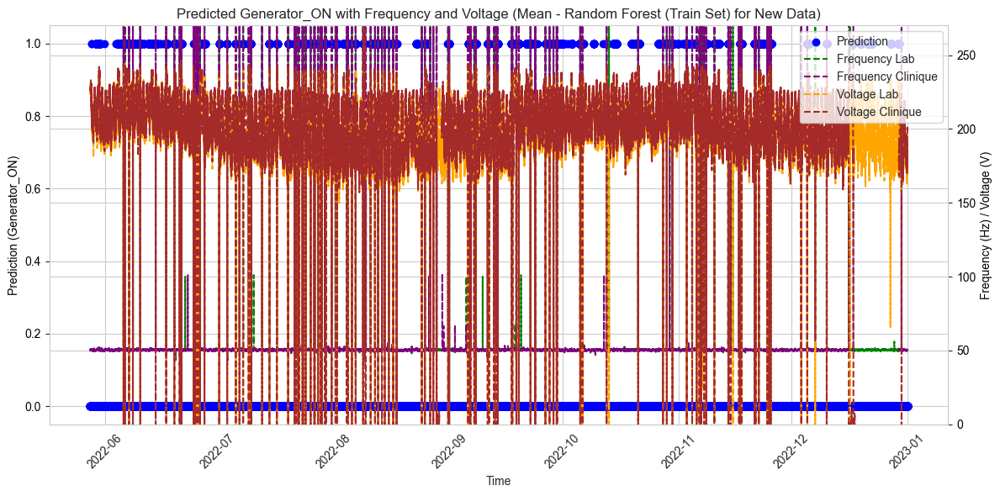

In [103]:
# For Random Forest Model
# Test data with both voltage and frequency
plot_predictions(test_data_2022, model_name="Mean - Random Forest (Train Set) for New Data", include_voltage=True, include_frequency=True)

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


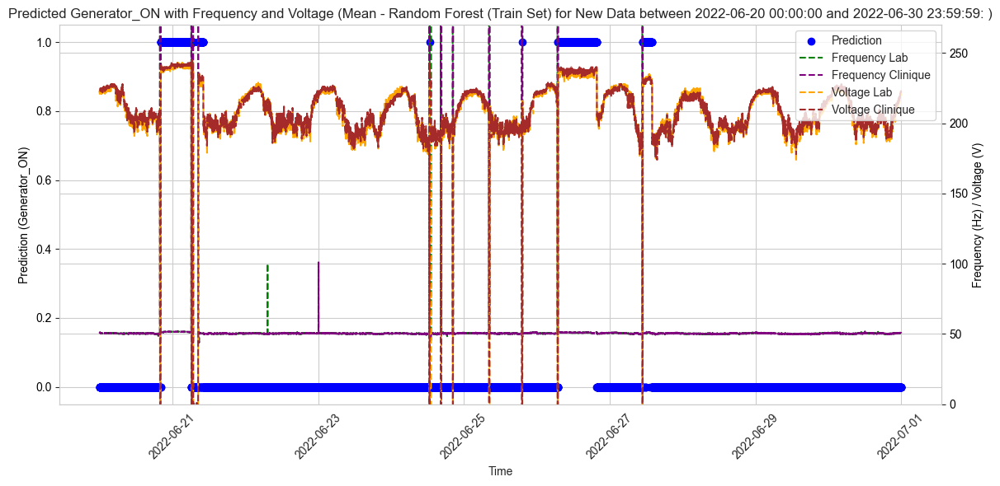

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


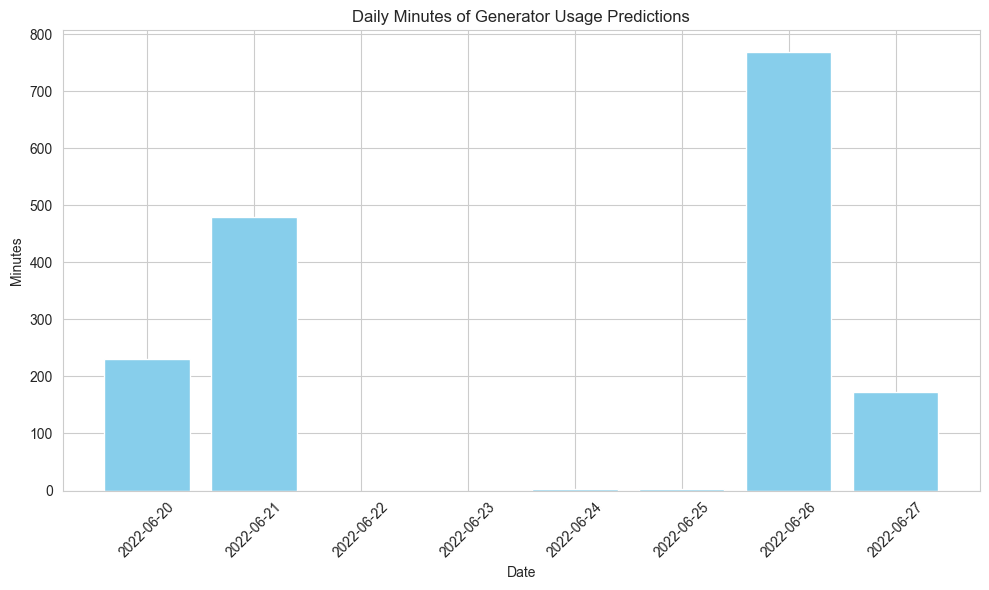

,Date,Count,Minutes,Hours
0,2022-06-20,115,230,3.833333
1,2022-06-21,240,480,8.000000
2,2022-06-24,1,2,0.033333
3,2022-06-25,1,2,0.033333
4,2022-06-26,384,768,12.800000
5,2022-06-27,86,172,2.866667


##### PREDICTION RESULT #####
Predicted Minutes: 1654 minutes, or 27.57 hours within 264.00 hours


In [104]:
# Plot predictions based on certain timing choosen

start_date = '2022-06-20 00:00:00'
finished_date = '2022-06-30 23:59:59'
filtered_test_data_2022 = test_data_2022[(test_data_2022['Time'] >= start_date) & (test_data_2022['Time'] <= finished_date)]


# Plot based on the filtered time:
plot_predictions(
    filtered_test_data_2022,
    model_name=f"Mean - Random Forest (Train Set) for New Data between {start_date} and {finished_date}: ",
    include_voltage=True,
    include_frequency=True
)


# Plot histogram for each minutes generator usage daily
filtered_test_data_2_daily_count = plot_true_predictions_histogram(filtered_test_data_2022)
display(filtered_test_data_2_daily_count)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = filtered_test_data_2022['prediction'].sum()


# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(filtered_test_data_2022) / 30


# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

display()

#### 5.4. Using Data of Year 2024

In [105]:
# Loading the data

# Set the path to the folder containing CSV files
folder_path = '../../data/0. ChCbNdosho/2024 Data/'

# Use glob to get all CSV file paths in the folder
csv_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Initialize an empty list to store each DataFrame
dfs = []

# Loop through the file paths and read each CSV into a DataFrame
for file in csv_files:
    df = pd.read_csv(file)
    dfs.append(df)

# Concatenate all DataFrames into one
data_2024 = pd.concat(dfs, ignore_index=True)

# Ensure the 'time' column is in datetime format
data_2024['time'] = pd.to_datetime(data_2024['Time'], format='%Y-%m-%d %H:%M:%S')

# Sort the DataFrame by the 'time' column
data_2024 = data_2024.sort_values(by='time').reset_index(drop=True)

# Display the first few rows to verify
data_2024

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),time
0,2024-01-01 00:00:00,50.1,50.1,201.0,211.0,2024-01-01 00:00:00
1,2024-01-01 00:02:00,49.7,49.7,202.0,210.0,2024-01-01 00:02:00
2,2024-01-01 00:04:00,49.8,49.8,202.0,210.0,2024-01-01 00:04:00
3,2024-01-01 00:06:00,49.9,49.9,201.0,213.0,2024-01-01 00:06:00
4,2024-01-01 00:08:00,50.0,50.0,204.0,209.0,2024-01-01 00:08:00
...,...,...,...,...,...,...
226766,2024-11-10 23:50:00,50.1,50.1,230.0,222.0,2024-11-10 23:50:00
226767,2024-11-10 23:52:00,50.0,50.2,230.0,222.0,2024-11-10 23:52:00
226768,2024-11-10 23:54:00,50.2,50.1,230.0,222.0,2024-11-10 23:54:00
226769,2024-11-10 23:56:00,49.9,50.2,231.0,223.0,2024-11-10 23:56:00


In [106]:
# Step 1: Generate Features

## FEATURE GENERATION
# Taking the mean of the dataframe (using the previous function)
test_data_2024, test_data_2024_dummy = calculate_mean_flags(data_2024, data_2024, train_data_base, columns_to_compare)

# Assuming train_data_ts and test_data_ts are your DataFrames
test_data_2024, test_data_2024_dummy = process_time_series_data(test_data_2024, test_data_2024, 
                                                        freq_lab_column= freq_a,
                                                        freq_clinique_column= freq_b,
                                                        volt_lab_column= volt_a,
                                                        volt_clinique_column= volt_b,
                                                        high_freq_threshold = high_freq_threshold,
                                                        low_freq_threshold = low_freq_threshold, 
                                                        high_volt_threshold = high_volt_threshold, 
                                                        low_volt_threshold = low_volt_threshold)

# Display Processed data:
print('Processed data after feature generation: ')
display(test_data_2024)

# Define the feature columns
feature_columns = [
    freq_a,
    freq_b,
    volt_a,
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

X_test = test_data_2024[feature_columns]

# Step 2: Make Predictions on the train and test sets
test_data_2024['prediction'] = clf.predict(X_test)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = test_data_2024['prediction'].sum()

# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(test_data_2024) / 30

# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

Processed data after feature generation: 


,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),time,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,Hour_22,Hour_23,High_delta_freq_lab,High_delta_freq_clinique,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique
0,2024-01-01 00:00:00,50.1,50.1,201.0,211.0,2024-01-01 00:00:00,False,False,False,True,...,False,False,False,False,False,False,NaN,NaN,NaN,NaN
1,2024-01-01 00:02:00,49.7,49.7,202.0,210.0,2024-01-01 00:02:00,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
2,2024-01-01 00:04:00,49.8,49.8,202.0,210.0,2024-01-01 00:04:00,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
3,2024-01-01 00:06:00,49.9,49.9,201.0,213.0,2024-01-01 00:06:00,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
4,2024-01-01 00:08:00,50.0,50.0,204.0,209.0,2024-01-01 00:08:00,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226766,2024-11-10 23:50:00,50.1,50.1,230.0,222.0,2024-11-10 23:50:00,False,False,True,True,...,False,True,False,False,False,False,False,False,False,False
226767,2024-11-10 23:52:00,50.0,50.2,230.0,222.0,2024-11-10 23:52:00,False,False,True,True,...,False,True,False,False,False,False,False,False,False,False
226768,2024-11-10 23:54:00,50.2,50.1,230.0,222.0,2024-11-10 23:54:00,False,False,True,True,...,False,True,False,False,False,False,False,False,False,False
226769,2024-11-10 23:56:00,49.9,50.2,231.0,223.0,2024-11-10 23:56:00,False,False,True,True,...,False,True,False,False,False,False,False,False,False,False


##### PREDICTION RESULT #####
Predicted Minutes: 83034 minutes, or 1383.90 hours within 7559.03 hours


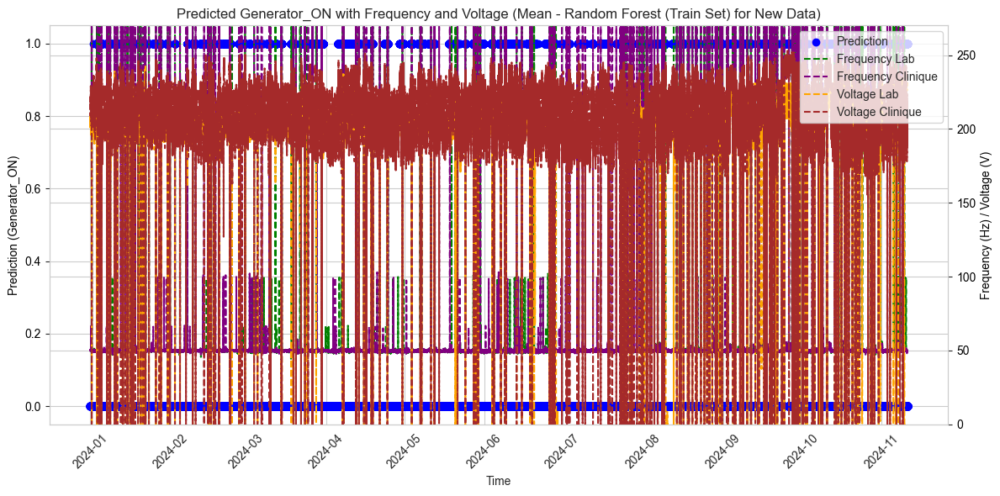

In [107]:
# For Random Forest Model
# Test data with both voltage and frequency
plot_predictions(test_data_2024, model_name="Mean - Random Forest (Train Set) for New Data", include_voltage=True, include_frequency=True)

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


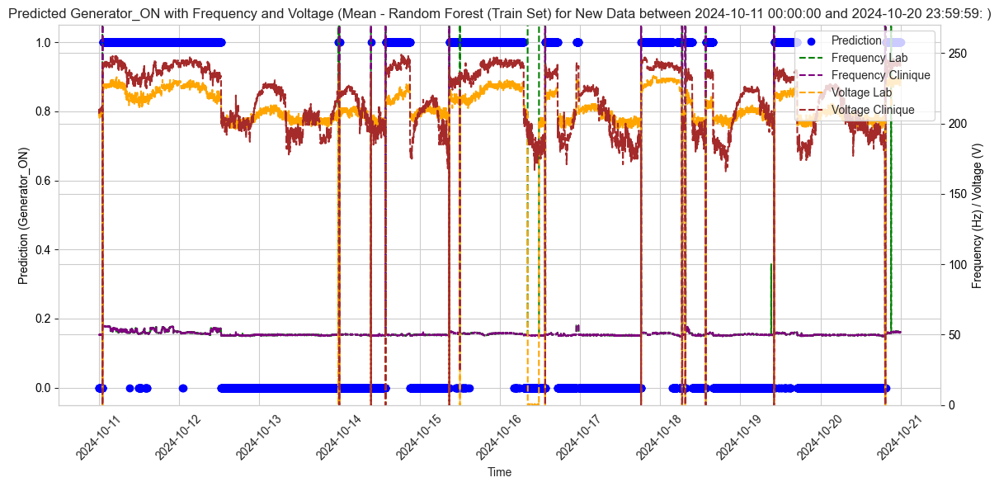

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


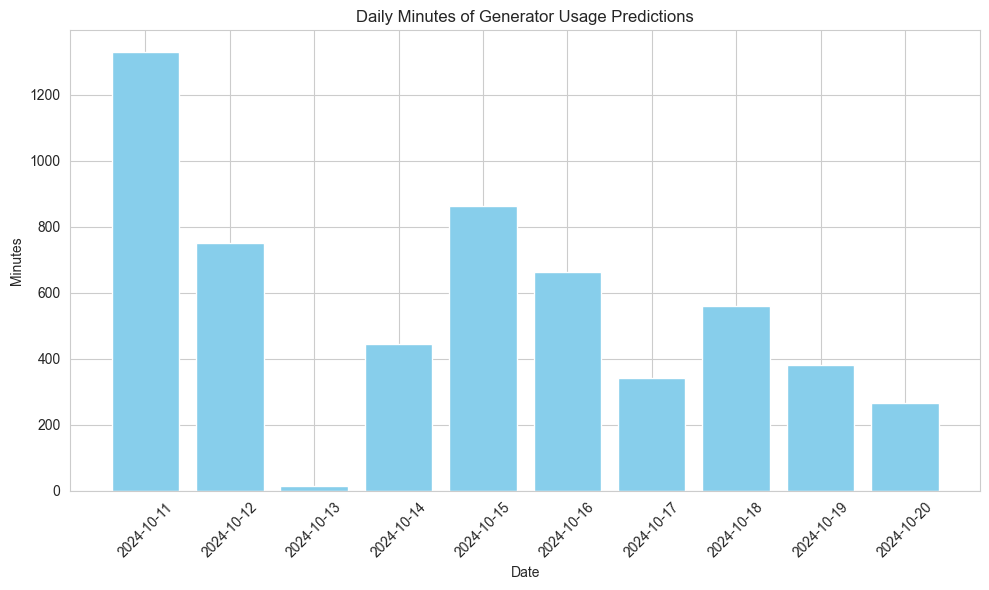

,Date,Count,Minutes,Hours
0,2024-10-11,664,1328,22.133333
1,2024-10-12,375,750,12.500000
2,2024-10-13,7,14,0.233333
3,2024-10-14,222,444,7.400000
4,2024-10-15,431,862,14.366667
5,2024-10-16,331,662,11.033333
6,2024-10-17,170,340,5.666667
7,2024-10-18,279,558,9.300000
8,2024-10-19,190,380,6.333333
9,2024-10-20,133,266,4.433333


##### PREDICTION RESULT #####
Predicted Minutes: 5604 minutes, or 93.40 hours within 240.00 hours


In [108]:
# Plot predictions based on certain timing choosen

start_date = '2024-10-11 00:00:00'
finished_date = '2024-10-20 23:59:59'
filtered_test_data_2024 = test_data_2024[(test_data_2024['Time'] >= start_date) & (test_data_2024['Time'] <= finished_date)]


# Plot based on the filtered time:
plot_predictions(
    filtered_test_data_2024,
    model_name=f"Mean - Random Forest (Train Set) for New Data between {start_date} and {finished_date}: ",
    include_voltage=True,
    include_frequency=True
)


# Plot histogram for each minutes generator usage daily
filtered_test_data_2_daily_count = plot_true_predictions_histogram(filtered_test_data_2024)
display(filtered_test_data_2_daily_count)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = filtered_test_data_2024['prediction'].sum()


# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(filtered_test_data_2024) / 30


# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

display()

In [109]:
## CHECK : 4-11 November

#### 5.5. Using Data of Year 2025

In [118]:
# Loading the data

# Set the path to the folder containing CSV files
folder_path = '../../data/0. ChCbNdosho/2025 Data/'

# Use glob to get all CSV file paths in the folder
csv_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Initialize an empty list to store each DataFrame
dfs = []

# Loop through the file paths and read each CSV into a DataFrame
for file in csv_files:
    df = pd.read_csv(file)
    dfs.append(df)

# Concatenate all DataFrames into one
data_2025 = pd.concat(dfs, ignore_index=True)

# Ensure the 'time' column is in datetime format
data_2025['time'] = pd.to_datetime(data_2025['Time'], format='%Y-%m-%d %H:%M:%S')

# Sort the DataFrame by the 'time' column
data_2025 = data_2025.sort_values(by='time').reset_index(drop=True)

# Display the first few rows to verify
data_2025

,Time,Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),time
0,2025-01-01 00:00:00,50.1,202.0,49.9,231.0,2025-01-01 00:00:00
1,2025-01-01 00:02:00,50.0,202.0,50.3,231.0,2025-01-01 00:02:00
2,2025-01-01 00:04:00,50.1,202.0,50.2,231.0,2025-01-01 00:04:00
3,2025-01-01 00:06:00,50.2,204.0,49.8,231.0,2025-01-01 00:06:00
4,2025-01-01 00:08:00,50.1,203.0,50.1,231.0,2025-01-01 00:08:00
...,...,...,...,...,...,...
127945,2025-07-01 00:58:00,49.3,252.0,NaN,NaN,2025-07-01 00:58:00
127946,2025-07-01 01:00:00,50.9,257.0,NaN,NaN,2025-07-01 01:00:00
127947,2025-07-01 01:02:00,49.9,257.0,NaN,NaN,2025-07-01 01:02:00
127948,2025-07-01 01:04:00,49.7,259.0,NaN,NaN,2025-07-01 01:04:00


In [120]:
# Step 1: Generate Features

## FEATURE GENERATION
# Taking the mean of the dataframe (using the previous function)
test_data_2025, test_data_2025_dummy = calculate_mean_flags(data_2025, data_2025, train_data_base, columns_to_compare)

# Assuming train_data_ts and test_data_ts are your DataFrames
test_data_2025, test_data_2025_dummy = process_time_series_data(test_data_2025, test_data_2025, 
                                                        freq_lab_column= freq_a,
                                                        freq_clinique_column= freq_b,
                                                        volt_lab_column= volt_a,
                                                        volt_clinique_column= volt_b,
                                                        high_freq_threshold = high_freq_threshold,
                                                        low_freq_threshold = low_freq_threshold, 
                                                        high_volt_threshold = high_volt_threshold, 
                                                        low_volt_threshold = low_volt_threshold)

# Display Processed data:
print('Processed data after feature generation: ')
display(test_data_2025)

# Define the feature columns
feature_columns = [
    freq_a,
    freq_b,
    volt_a,
    volt_b,
    'higher_freq_lab', 'higher_freq_clinique', 'higher_volt_lab',
    'higher_volt_clinique', 'Freq_delta_lab', 'Freq_delta_clinique',
    'Volt_delta_lab', 'Volt_delta_clinique', 'freq_delta_negative_lab',
    'freq_delta_negative_clinique', 'volt_delta_positive_lab',
    'volt_delta_positive_clinique', 'freq_in_range_lab',
    'volt_in_range_lab', 'freq_in_range_clinique', 'volt_in_range_clinique',
    'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
    'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
    'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
    'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
    'High_delta_freq_lab', 'High_delta_freq_clinique',
    'High_delta_volt_lab', 'High_delta_volt_clinique',
    'Prev_High_delta_freq_lab', 'Prev_High_delta_freq_clinique',
    'Prev_High_delta_volt_lab', 'Prev_High_delta_volt_clinique'
]

X_test = test_data_2025[feature_columns]

# Step 2: Make Predictions on the train and test sets
test_data_2025['prediction'] = clf.predict(X_test)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = test_data_2025['prediction'].sum()

# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(test_data_2025) / 30

# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')

Processed data after feature generation: 


,Time,Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),time,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,Hour_22,Hour_23,High_delta_freq_lab,High_delta_freq_clinique,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique
0,2025-01-01 00:00:00,50.1,202.0,49.9,231.0,2025-01-01 00:00:00,False,False,True,False,...,False,False,False,False,False,False,NaN,NaN,NaN,NaN
1,2025-01-01 00:02:00,50.0,202.0,50.3,231.0,2025-01-01 00:02:00,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
2,2025-01-01 00:04:00,50.1,202.0,50.2,231.0,2025-01-01 00:04:00,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
3,2025-01-01 00:06:00,50.2,204.0,49.8,231.0,2025-01-01 00:06:00,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
4,2025-01-01 00:08:00,50.1,203.0,50.1,231.0,2025-01-01 00:08:00,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127945,2025-07-01 00:58:00,49.3,252.0,NaN,NaN,2025-07-01 00:58:00,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
127946,2025-07-01 01:00:00,50.9,257.0,NaN,NaN,2025-07-01 01:00:00,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
127947,2025-07-01 01:02:00,49.9,257.0,NaN,NaN,2025-07-01 01:02:00,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
127948,2025-07-01 01:04:00,49.7,259.0,NaN,NaN,2025-07-01 01:04:00,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False


##### PREDICTION RESULT #####
Predicted Minutes: 74142 minutes, or 1235.70 hours within 4265.00 hours


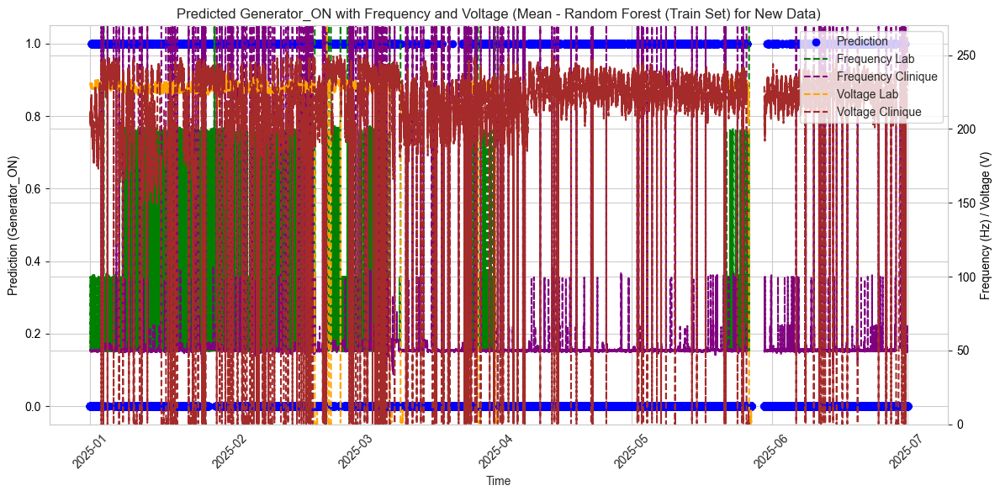

In [121]:
# For Random Forest Model
# Test data with both voltage and frequency
plot_predictions(test_data_2025, model_name="Mean - Random Forest (Train Set) for New Data", include_voltage=True, include_frequency=True)

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


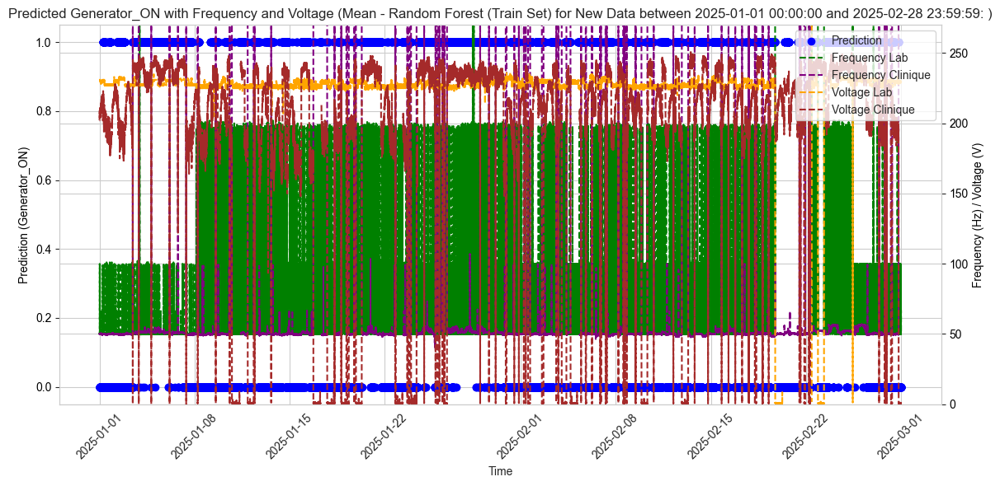

/Users/danielsitompul/Documents/GitHub/Generator_ML_Emission_Modeling/ModelingFunctions/GEMpythonlib/GEMpythonfunctions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[time_column] = pd.to_datetime(data[time_column], format='%Y-%m-%d %H:%M:%S')


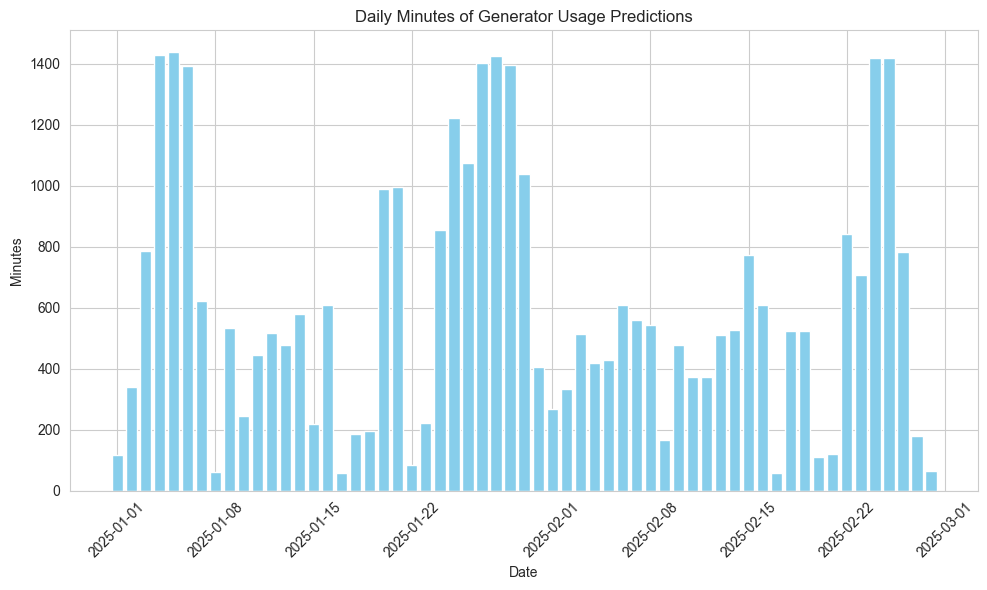

,Date,Count,Minutes,Hours
0,2025-01-01,59,118,1.966667
1,2025-01-02,170,340,5.666667
2,2025-01-03,393,786,13.100000
3,2025-01-04,715,1430,23.833333
4,2025-01-05,719,1438,23.966667
5,2025-01-06,696,1392,23.200000
6,2025-01-07,311,622,10.366667
7,2025-01-08,31,62,1.033333
8,2025-01-09,267,534,8.900000
9,2025-01-10,122,244,4.066667


##### PREDICTION RESULT #####
Predicted Minutes: 35594 minutes, or 593.23 hours within 1415.90 hours
Average Daily Usage Minutes: 603.2881355932203 minutes, or 10.054802259887005 hours
Max minutes of usage 1438 minutes or 23.966666666666665 hours. Date: 2025-01-05


In [122]:
# Plot predictions based on certain timing choosen

start_date = '2025-01-01 00:00:00'
finished_date = '2025-02-28 23:59:59'
filtered_test_data_2025 = test_data_2025[(test_data_2025['Time'] >= start_date) & (test_data_2025['Time'] <= finished_date)]


# Plot based on the filtered time:
plot_predictions(
    filtered_test_data_2025,
    model_name=f"Mean - Random Forest (Train Set) for New Data between {start_date} and {finished_date}: ",
    include_voltage=True,
    include_frequency=True
)


# Plot histogram for each minutes generator usage daily
filtered_test_data_2_daily_count = plot_true_predictions_histogram(filtered_test_data_2025)
display(filtered_test_data_2_daily_count)

print(f'##### PREDICTION RESULT #####')
predicted_minutes = filtered_test_data_2025['prediction'].sum()


# Total duration in hours (assuming each row represents 1 minute)
total_hours = len(filtered_test_data_2025) / 30
average_daily = filtered_test_data_2_daily_count['Minutes'].sum() / filtered_test_data_2_daily_count.shape[0] 
max_daily = filtered_test_data_2_daily_count['Minutes'].max()
# Find the row with the maximum 'Minutes' value
max_daily_row = filtered_test_data_2_daily_count.loc[filtered_test_data_2_daily_count['Minutes'].idxmax()]
# Extract the 'Date' column from that row
max_date = max_daily_row['Date']


# Display actual and predicted minutes with equivalent hours
print(f'Predicted Minutes: {predicted_minutes*2} minutes, or {predicted_minutes / 30:.2f} hours within {total_hours:.2f} hours')
print(f'Average Daily Usage Minutes: {average_daily} minutes, or {average_daily / 60} hours')
print(f'Max minutes of usage {max_daily} minutes or {max_daily / 60} hours. Date: {max_date}')

## 6. Summary of Data

#### 6.1. Generator 2022 Data

In [110]:
year_summary, monthly_summary = generator_usage_summary(test_data_2022)
display("Yearly Summary:")
display(year_summary)
display("Monthly Summary:")
display(monthly_summary)

'Yearly Summary:'

,Metric,Value
0,Total Minutes Used (min),28846
1,Average Daily Usage (min),132.321101
2,Median Daily Usage (min),8.0
3,Highest Month (Total),Month 11 (6232 mins)
4,Lowest Month (Total),Month 5 (270 mins)


'Monthly Summary:'

,Month,Total Usage (min),Average Daily Usage (min),Max Daily Usage (min),Max Daily Usage (Date)
0,5,270,33.750000,125,2022-05-30
1,6,5614,93.566667,554,2022-06-06
2,7,3130,50.483871,194,2022-07-28
3,8,3108,50.129032,352,2022-08-25
4,9,4830,80.500000,276,2022-09-21
5,10,3696,59.612903,243,2022-10-30
6,11,6232,103.866667,404,2022-11-07
7,12,1966,31.709677,273,2022-12-05


#### 6.2. Generator 2023 Data

In [111]:
year_summary, monthly_summary = generator_usage_summary(test_data_2023)
display("Yearly Summary:")
display(year_summary)
display("Monthly Summary:")
display(monthly_summary)

'Yearly Summary:'

,Metric,Value
0,Total Minutes Used (min),112630
1,Average Daily Usage (min),308.575342
2,Median Daily Usage (min),304.0
3,Highest Month (Total),Month 12 (13988 mins)
4,Lowest Month (Total),Month 1 (2968 mins)


'Monthly Summary:'

,Month,Total Usage (min),Average Daily Usage (min),Max Daily Usage (min),Max Daily Usage (Date)
0,1,2968,47.870968,383,2023-01-08
1,2,4422,78.964286,352,2023-02-07
2,3,5010,80.806452,390,2023-03-12
3,4,12858,214.300000,488,2023-04-11
4,5,13472,217.290323,318,2023-05-29
5,6,13372,222.866667,363,2023-06-22
6,7,8170,131.774194,427,2023-07-05
7,8,12260,197.741935,433,2023-08-08
8,9,11862,197.700000,518,2023-09-05
9,10,4952,79.870968,397,2023-10-27


#### 6.3. Generator 2024 Data

In [112]:
year_summary, monthly_summary = generator_usage_summary(test_data_2024)
display("Yearly Summary:")
display(year_summary)
display("Monthly Summary:")
display(monthly_summary)

'Yearly Summary:'

,Metric,Value
0,Total Minutes Used (min),83034
1,Average Daily Usage (min),263.6
2,Median Daily Usage (min),174.0
3,Highest Month (Total),Month 9 (15904 mins)
4,Lowest Month (Total),Month 11 (3906 mins)


'Monthly Summary:'

,Month,Total Usage (min),Average Daily Usage (min),Max Daily Usage (min),Max Daily Usage (Date)
0,1,7274,117.322581,339,2024-01-19
1,2,5288,91.172414,295,2024-02-27
2,3,5300,85.483871,321,2024-03-22
3,4,8074,134.566667,464,2024-04-15
4,5,5338,86.096774,386,2024-05-10
5,6,6384,106.400000,298,2024-06-04
6,7,5208,84.000000,320,2024-07-27
7,8,8080,130.322581,441,2024-08-20
8,9,15904,265.066667,720,2024-09-25
9,10,12278,198.032258,664,2024-10-11


#### 6.4. Generator 2025 Data

In [ ]:
year_summary, monthly_summary = generator_usage_summary(test_data_2025)
display("Yearly Summary:")
display(year_summary)
display("Monthly Summary:")
display(monthly_summary)

## 7. Generator Power Calculation

In [113]:
# Constant Declaration of Hourly kwh average
kwh_hour = [
    6.747835296, 7.057838155, 8.16854183, 11.30196556, 11.21547191, 9.88189269, 11.22740354, 12.85224141, 14.05086424, 13.96076821,
    13.70200973, 13.46483643, 13.25040271, 12.23739568, 9.853452467, 11.13546578, 11.58039839, 9.594331892, 9.649361468,
    8.320364238, 6.779637969, 6.241952539, 6.125157442, 6.18646468
]

#### 7.1. Generator 2022 Power

In [114]:
# Calculate the total kWh for each row based on hour-specific multipliers
test_data_2022['power (kW)'] = test_data_2022.apply(
    lambda row: sum(row[f'Hour_{i}'] * kwh_hour[i] for i in range(24)) / 30 if row['prediction'] else 0,
    axis=1
)

test_data_2022[test_data_2022['prediction']]

,Time,Frequency 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Frequency C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),Voltage 3E2F4FD3 (Ch Cbca Bethesda Ndosho - laboratoire),Voltage C30F2E03 (Ch Cbca Bethesda Ndosho - clinique),time,higher_freq_lab,higher_freq_clinique,higher_volt_lab,higher_volt_clinique,...,High_delta_volt_lab,High_delta_volt_clinique,Prev_High_delta_freq_lab,Prev_High_delta_freq_clinique,Prev_High_delta_volt_lab,Prev_High_delta_volt_clinique,prediction,Date,Month,power (kW)
276,2022-05-28 09:12:00,50.2,50.2,212.0,214.0,2022-05-28 09:12:00,False,False,True,True,...,False,False,False,False,False,False,True,2022-05-28,5,0.465359
277,2022-05-28 09:14:00,50.0,50.0,213.0,216.0,2022-05-28 09:14:00,False,False,True,True,...,False,False,False,False,False,False,True,2022-05-28,5,0.465359
990,2022-05-29 09:00:00,50.1,50.1,216.0,218.0,2022-05-29 09:00:00,False,False,True,True,...,False,False,False,False,False,False,True,2022-05-29,5,0.465359
991,2022-05-29 09:02:00,50.3,50.3,213.0,215.0,2022-05-29 09:02:00,False,False,True,True,...,False,False,False,False,False,False,True,2022-05-29,5,0.465359
992,2022-05-29 09:04:00,50.3,50.3,216.0,218.0,2022-05-29 09:04:00,False,False,True,True,...,False,False,False,False,False,False,True,2022-05-29,5,0.465359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155290,2022-12-29 16:22:00,51.1,NaN,231.0,NaN,2022-12-29 16:22:00,False,False,True,False,...,False,False,False,False,False,False,True,2022-12-29,12,0.386013
155291,2022-12-29 16:24:00,51.2,NaN,233.0,NaN,2022-12-29 16:24:00,False,False,True,False,...,False,False,False,False,False,False,True,2022-12-29,12,0.386013
155292,2022-12-29 16:26:00,51.0,NaN,234.0,NaN,2022-12-29 16:26:00,False,False,True,False,...,False,False,False,False,False,False,True,2022-12-29,12,0.386013
155293,2022-12-29 16:28:00,51.1,NaN,232.0,NaN,2022-12-29 16:28:00,False,False,True,False,...,False,False,False,False,False,False,True,2022-12-29,12,0.386013


In [115]:
# Year 2022 power from generator summary
year_summary, monthly_summary = power_usage_summary(test_data_2022)
display("Yearly Summary:")
display(year_summary)
display("Monthly Summary:")
display(monthly_summary)

'Yearly Summary:'

,Metric,Value
0,Total Power Used (kW),5441.5
1,Average Daily Usage (kW),24.96
2,Median Daily Usage (kW),1.49
3,Highest Month (Total),Month 11 (1197.0 kW)
4,Lowest Month (Total),Month 5 (61.63 kW)


'Monthly Summary:'

,Month,Total Usage (kW),Average Daily Usage (kW),Max Daily Usage (kW),Max Daily Usage (Date)
0,5,61.63,15.41,57.12,2022-05-30
1,6,1073.04,35.77,205.05,2022-06-06
2,7,522.71,16.86,77.81,2022-07-09
3,8,507.25,16.36,143.55,2022-08-25
4,9,936.03,31.20,112.80,2022-09-21
5,10,726.93,23.45,103.34,2022-10-30
6,11,1197.00,39.90,155.18,2022-11-25
7,12,416.92,13.45,114.99,2022-12-05


#### 7.2. Generator 2023 Power

In [ ]:
# Calculate the total kWh for each row based on hour-specific multipliers
test_data_2023['power (kW)'] = test_data_2023.apply(
    lambda row: sum(row[f'Hour_{i}'] * kwh_hour[i] for i in range(24)) / 30 if row['prediction'] else 0,
    axis=1
)

test_data_2023[test_data_2023['prediction']]

In [ ]:
# Year 2023 power from generator summary
year_summary, monthly_summary = power_usage_summary(test_data_2023)
display("Yearly Summary:")
display(year_summary)
display("Monthly Summary:")
display(monthly_summary)

#### 7.3. Generator 2024 Power

In [ ]:
# Calculate the total kWh for each row based on hour-specific multipliers
test_data_2024['power (kW)'] = test_data_2024.apply(
    lambda row: sum(row[f'Hour_{i}'] * kwh_hour[i] for i in range(24)) / 30 if row['prediction'] else 0,
    axis=1
)

test_data_2024[test_data_2024['prediction']]

In [ ]:
# Year 2024 power from generator summary
year_summary, monthly_summary = power_usage_summary(test_data_2024)
display("Yearly Summary:")
display(year_summary)
display("Monthly Summary:")
display(monthly_summary)

## 8. Generator Emission Calculation

In [ ]:
# Constant Declaration of Emission index

#Assuming Un-Controlled NOx
NOx_lb_hp_hr = 0.024
CO_lb_hp_hr = 0.0055
SOx_lb_hp_hr = 0.00809
CO2_lb_hp_hr = 1.16
PM_lb_hp_hr = 0.0007

kwh_to_hp_hr = 1.341
lb_to_gr = 453.592

#### 8.1. Generator 2022 Emission

In [ ]:
test_data_2022 = calculate_emissions(test_data_2022)

test_data_2022[test_data_2022['prediction']]

In [ ]:
generator_emission_summary(test_data_2022)

#### 8.2. Generator 2023 Emission

In [ ]:
test_data_2023 = calculate_emissions(test_data_2023)

test_data_2023[test_data_2023['prediction']]

In [ ]:
generator_emission_summary(test_data_2023)

#### 8.3. Generator 2024 Emission

In [ ]:
test_data_2024 = calculate_emissions(test_data_2024)

test_data_2024[test_data_2024['prediction']]

In [ ]:
generator_emission_summary(test_data_2024)

## 9. Generator Output Emissions File

In [ ]:
file_name = ["data_2022.csv", "data_2023.csv", "data_2024.csv"]
years = [2022, 2023, 2024]
columns = ['Time','prediction','power (kW)','NOx Emission (g)','CO Emission (g)','SOx Emission (g)','CO2 Emission (g)','PM Emission (g)', 'Date', 'Month']

test_data_2024[columns].to_csv('results/data_2024.csv', index = False)
test_data_2023[columns].to_csv('results/data_2023.csv', index = False)
test_data_2022[columns].to_csv('results/data_2022.csv', index = False)